C:\Users\david\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\deeplake\util\check_latest_version.py:32: UserWarning: A newer version of deeplake (3.8.17) is available. It's recommended that you update to the latest version using `pip install -U deeplake`.
  warnings.warn(
|

Opening dataset in read-only mode as you don't have write permissions.


|

This dataset can be visualized in Jupyter Notebook by ds.visualize() or at https://app.activeloop.ai/activeloop/spoken_mnist



-

hub://activeloop/spoken_mnist loaded successfully.



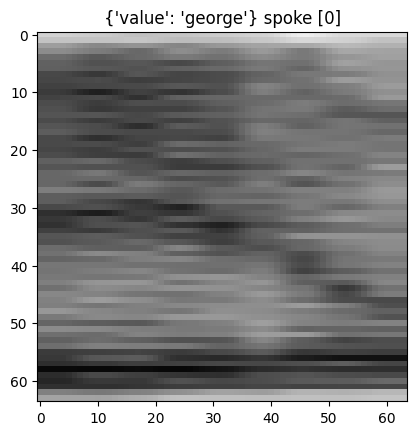

In [1]:
import hub
ds = hub.load("hub://activeloop/spoken_mnist")

# check out the first spectrogram, it's label, and who spoke it!
import matplotlib.pyplot as plt
plt.imshow(ds.spectrograms[0].numpy())
plt.title(f"{ds.speakers[0].data()} spoke {ds.labels[0].numpy()}")
plt.show()

# 1 ) Eda and data cleaning 

#### 1.1 ) Duration Length outliers cleaning 

- For avoiding to much noise introduced due to Variable Ntau Padding 

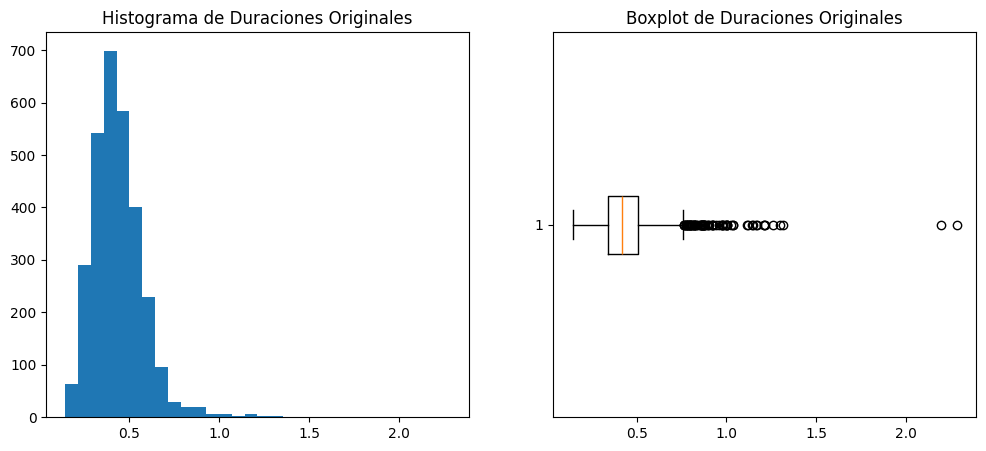

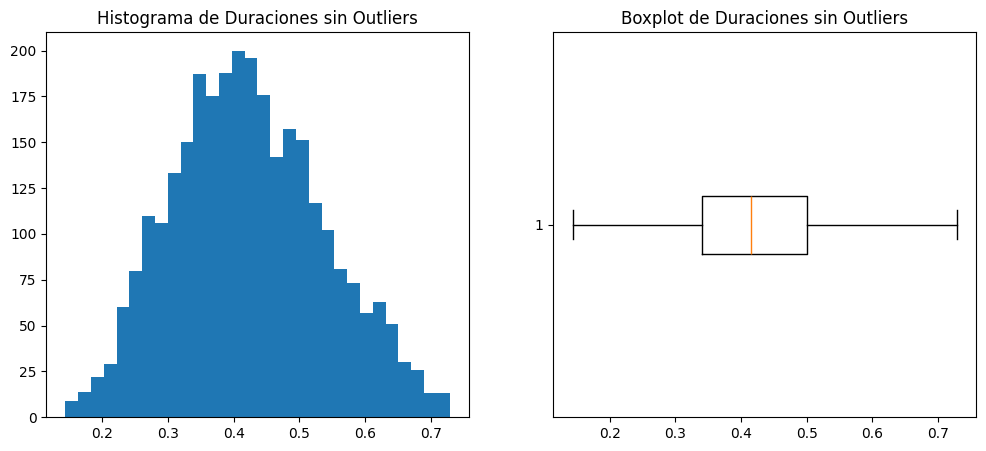

C:\Users\david\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\deeplake\core\tensor.py:714: UserWarning: Indexing by integer in a for loop, like `for i in range(len(ds)): ... ds.tensor[i]` can be quite slow. Use `for i, sample in enumerate(ds)` instead.
  warnings.warn(


In [2]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import zscore

# Convertir los audios a un array de numpy y calcular su duración
audios = [np.array(audio) for audio in ds.audio]  # Ajusta esto según tu dataset
sampling_rate = 8000  # Asumiendo una tasa de muestreo constante

durations = np.array([len(audio) / sampling_rate for audio in audios])

# Función para plotear histograma y boxplot
def plot_data(data, title):
    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    plt.hist(data, bins=30)
    plt.title(f'Histograma de {title}')

    plt.subplot(1, 2, 2)
    plt.boxplot(data, vert=False)
    plt.title(f'Boxplot de {title}')

    plt.show()

# Plotear la distribución inicial
plot_data(durations, 'Duraciones Originales')

# Calcular z-score
z_scores = zscore(durations)

# Filtrar los outliers y mantener los índices
indices = np.arange(len(durations))
filtered_indices = indices[np.abs(z_scores) < 2]
filtered_durations = durations[filtered_indices]

# Plotear la distribución después de eliminar outliers
plot_data(filtered_durations, 'Duraciones sin Outliers')


# Convertir los índices filtrados a lista
filtered_indices_list = filtered_indices.tolist()

# Usar la lista de índices filtrados para obtener las labels y speakers correspondientes
filtered_labels = [ds.labels[idx].numpy() for idx in filtered_indices_list]
filtered_speakers = [ds.speakers[idx].numpy() for idx in filtered_indices_list]



In [3]:
print('filtered_labels :' ,filtered_labels)
print('filtered_speakers :' ,filtered_speakers)

filtered_labels : [array([0], dtype=uint32), array([0], dtype=uint32), array([0], dtype=uint32), array([0], dtype=uint32), array([0], dtype=uint32), array([0], dtype=uint32), array([0], dtype=uint32), array([0], dtype=uint32), array([0], dtype=uint32), array([0], dtype=uint32), array([0], dtype=uint32), array([0], dtype=uint32), array([0], dtype=uint32), array([0], dtype=uint32), array([0], dtype=uint32), array([0], dtype=uint32), array([0], dtype=uint32), array([0], dtype=uint32), array([0], dtype=uint32), array([0], dtype=uint32), array([0], dtype=uint32), array([0], dtype=uint32), array([0], dtype=uint32), array([0], dtype=uint32), array([0], dtype=uint32), array([0], dtype=uint32), array([0], dtype=uint32), array([0], dtype=uint32), array([0], dtype=uint32), array([0], dtype=uint32), array([0], dtype=uint32), array([0], dtype=uint32), array([0], dtype=uint32), array([0], dtype=uint32), array([0], dtype=uint32), array([0], dtype=uint32), array([0], dtype=uint32), array([0], dtype=ui

Conteo de datos por speaker:
Speaker george: 498 datos
Speaker jackson: 478 datos
Speaker lucas: 444 datos
Speaker nicolas: 500 datos
Speaker theo: 491 datos
Speaker yweweler: 500 datos

Conteo de datos por label:
Label 0: 289 datos
Label 1: 292 datos
Label 2: 294 datos
Label 3: 295 datos
Label 4: 297 datos
Label 5: 294 datos
Label 6: 277 datos
Label 7: 289 datos
Label 8: 294 datos
Label 9: 290 datos


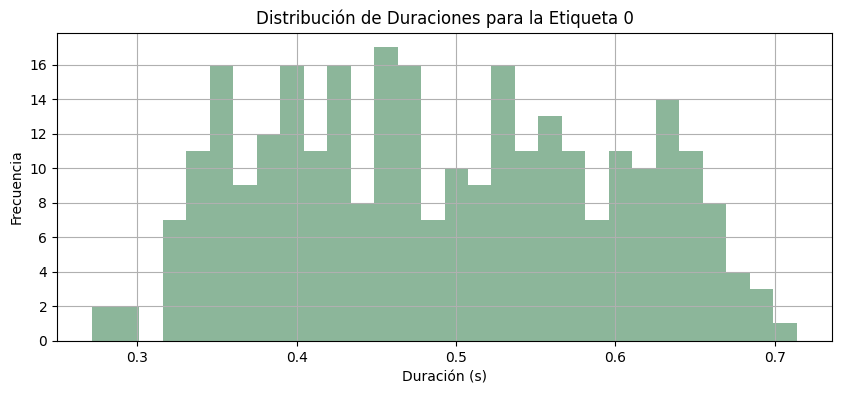

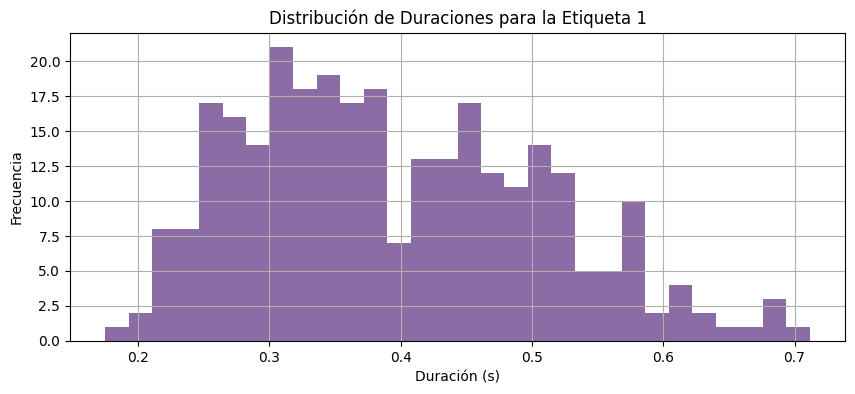

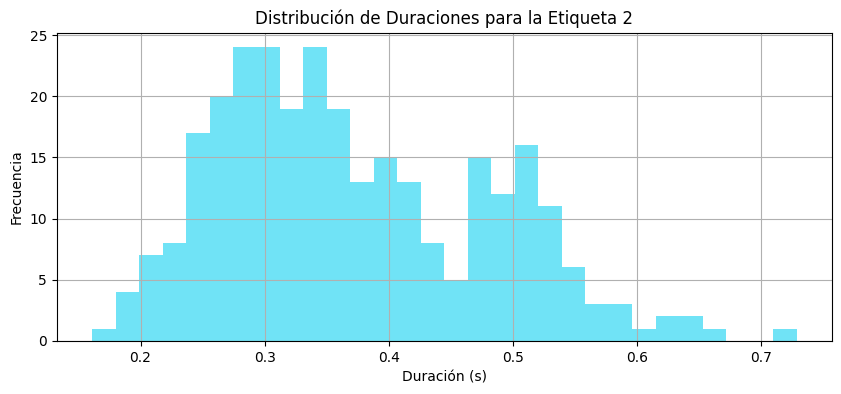

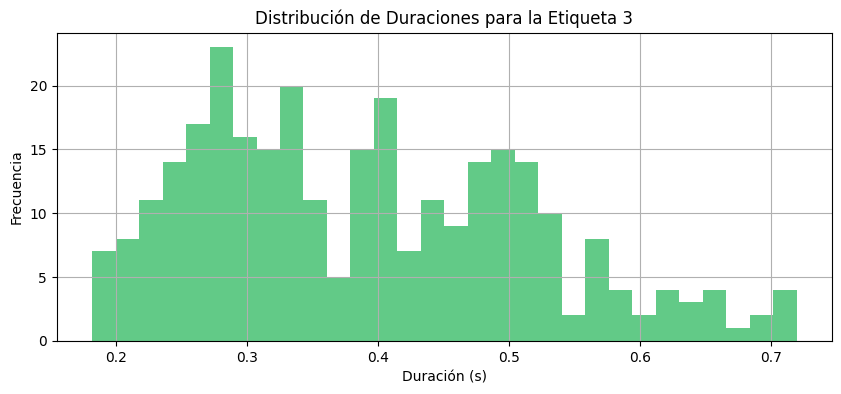

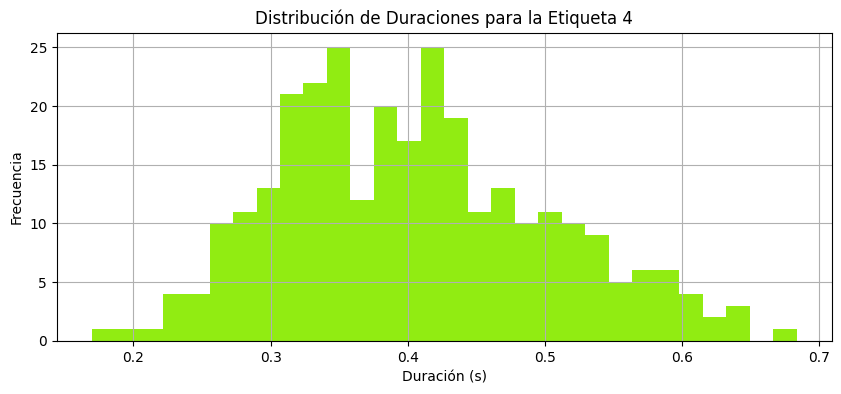

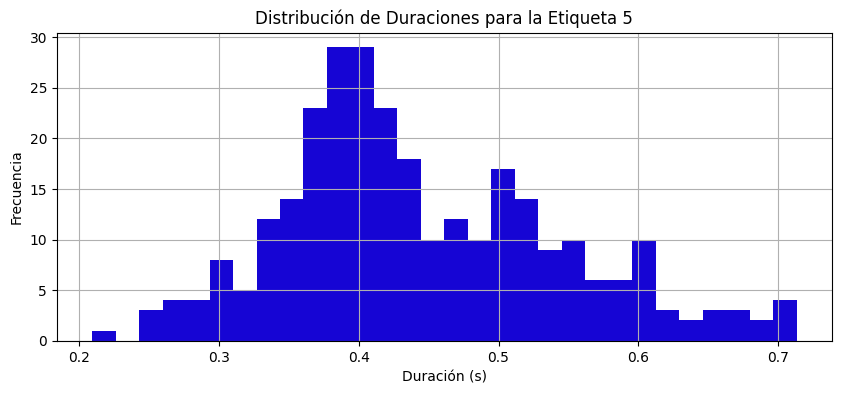

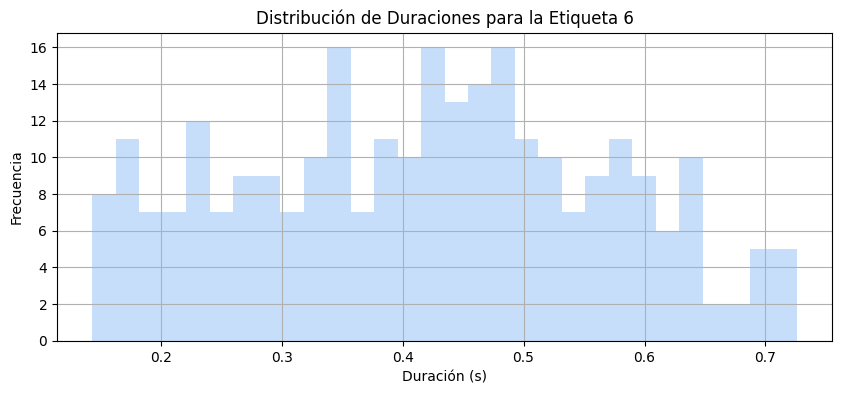

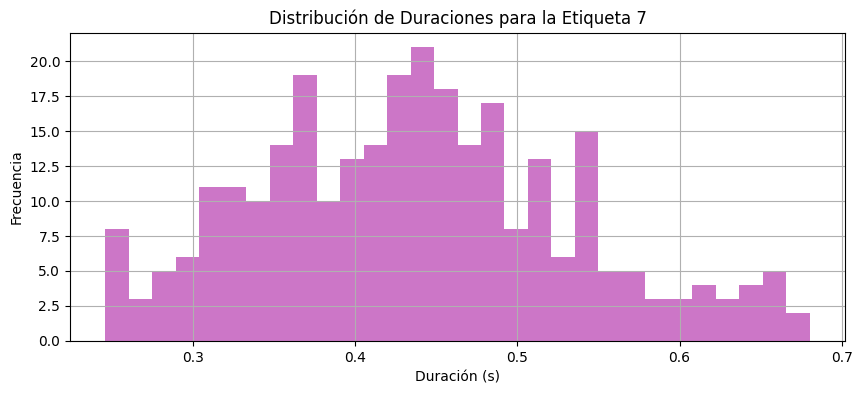

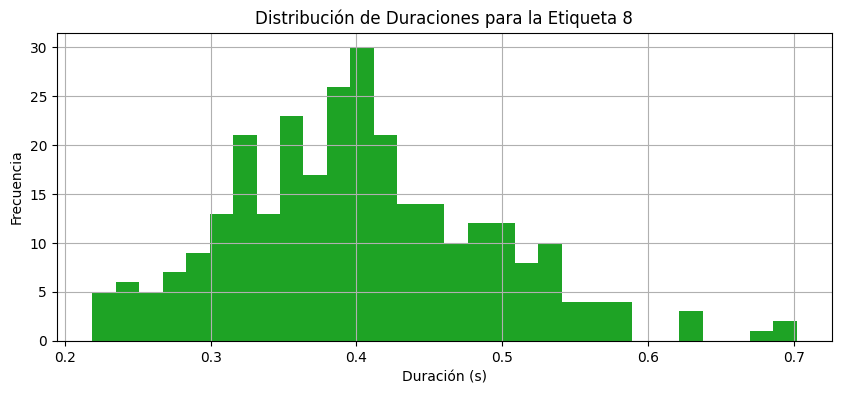

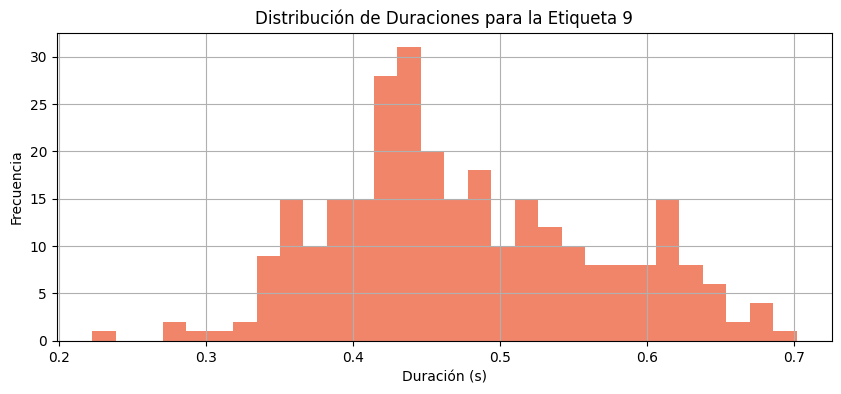

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict

# Suponemos que 'filtered_durations', 'filtered_labels', y 'filtered_speakers' están definidos como antes

# Aplanar los arrays de labels y speakers
flat_labels = np.concatenate(filtered_labels).astype(int)
flat_speakers = np.concatenate(filtered_speakers)

# Contar las ocurrencias para cada speaker y label
speaker_counts = defaultdict(int)
label_counts = defaultdict(int)

for speaker, label in zip(flat_speakers, flat_labels):
    speaker_counts[speaker] += 1
    label_counts[label] += 1

# Imprimir los conteos
print("Conteo de datos por speaker:")
for speaker, count in speaker_counts.items():
    print(f"Speaker {speaker}: {count} datos")

print("\nConteo de datos por label:")
for label, count in label_counts.items():
    print(f"Label {label}: {count} datos")

# Graficar las distribuciones por label
unique_labels = set(flat_labels)



for label in unique_labels:
    label_durations = [dur for dur, lbl in zip(filtered_durations, flat_labels) if lbl == label]
    plt.figure(figsize=(10, 4))
    plt.hist(label_durations, bins=30 ,color=np.random.rand(3,))
    plt.title(f'Distribución de Duraciones para la Etiqueta {label}')
    plt.xlabel('Duración (s)')
    plt.ylabel('Frecuencia')
    plt.grid(True)
    plt.show()


In [5]:

import numpy as np

# Suponemos que 'filtered_durations', 'flat_labels', 'flat_speakers', y 'audios' están definidos como antes

# Definir los rangos de Nτ para cada tipo de filtro acústico
def calculate_ntau_ranges(duration, ntau_max, ntau_min):
    # Esta función debe calcular el valor de Nτ basado en la duración del audio
    # y debe ser ajustada según las reglas específicas que desees aplicar
    ntau = np.interp(duration, [durations.min(), durations.max()], [ntau_min, ntau_max])
    return int(np.round(ntau))

# Crear el nuevo sub-dataset limpio
sub_dataset = []
for idx, (duration, label, speaker, audio_data) in enumerate(zip(filtered_durations, flat_labels, flat_speakers, audios)):
    sub_dataset.append({
        "index": idx,
        "label": label,
        "speaker": speaker,
        "audio_data": audio_data,
        "ntau_spectrogram": calculate_ntau_ranges(duration, 67, 24),
        "ntau_cochlear": calculate_ntau_ranges(duration, 41, 16),
        "ntau_mfcc": calculate_ntau_ranges(duration, 83, 31)
    })

# Imprimir algunos de los elementos para verificar
for element in sub_dataset[:5]:  # Imprimir solo los primeros 5 para verificar
    print(element)


{'index': 0, 'label': 0, 'speaker': 'george', 'audio_data': array([[-1489.],
       [ -962.],
       [ -606.],
       ...,
       [-1814.],
       [-1110.],
       [  -15.]]), 'ntau_spectrogram': 27, 'ntau_cochlear': 18, 'ntau_mfcc': 35}
{'index': 1, 'label': 0, 'speaker': 'george', 'audio_data': array([[ 36.],
       [ 18.],
       [ 63.],
       ...,
       [-22.],
       [-35.],
       [ 15.]]), 'ntau_spectrogram': 33, 'ntau_cochlear': 21, 'ntau_mfcc': 42}
{'index': 2, 'label': 0, 'speaker': 'george', 'audio_data': array([[-175.],
       [-509.],
       [ 293.],
       ...,
       [ -93.],
       [-137.],
       [ -89.]]), 'ntau_spectrogram': 30, 'ntau_cochlear': 20, 'ntau_mfcc': 39}
{'index': 3, 'label': 0, 'speaker': 'george', 'audio_data': array([[ 103.],
       [ 138.],
       [ 196.],
       ...,
       [-273.],
       [-238.],
       [-173.]]), 'ntau_spectrogram': 31, 'ntau_cochlear': 20, 'ntau_mfcc': 40}
{'index': 4, 'label': 0, 'speaker': 'george', 'audio_data': array([[ 67.

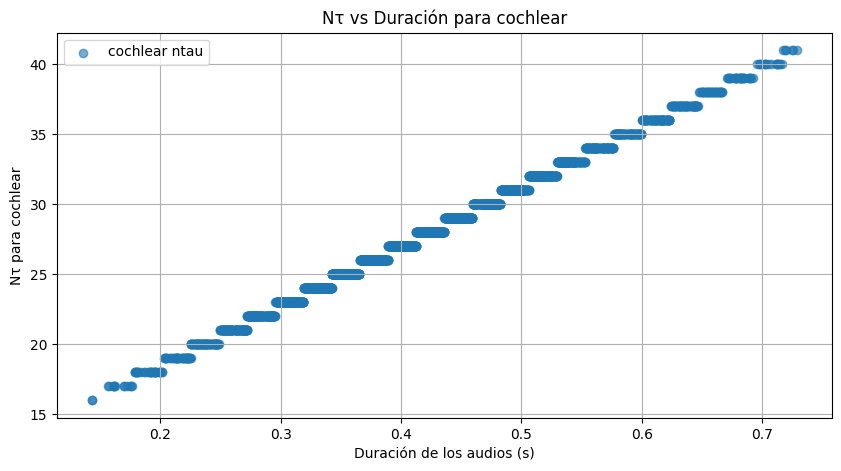

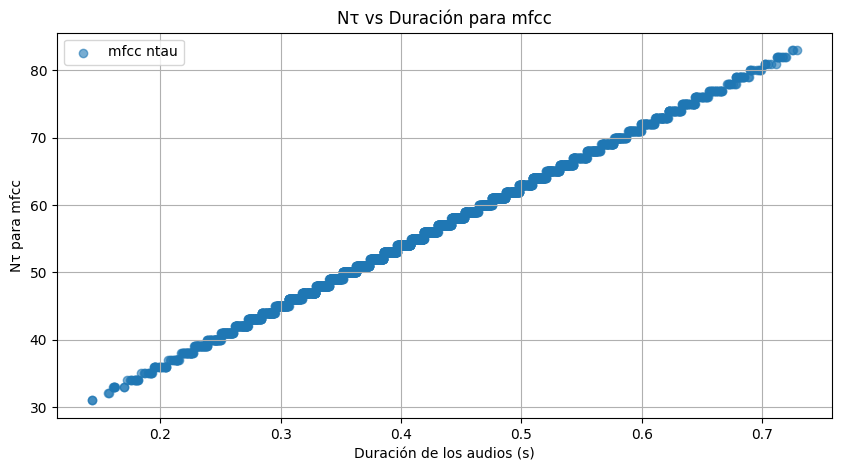

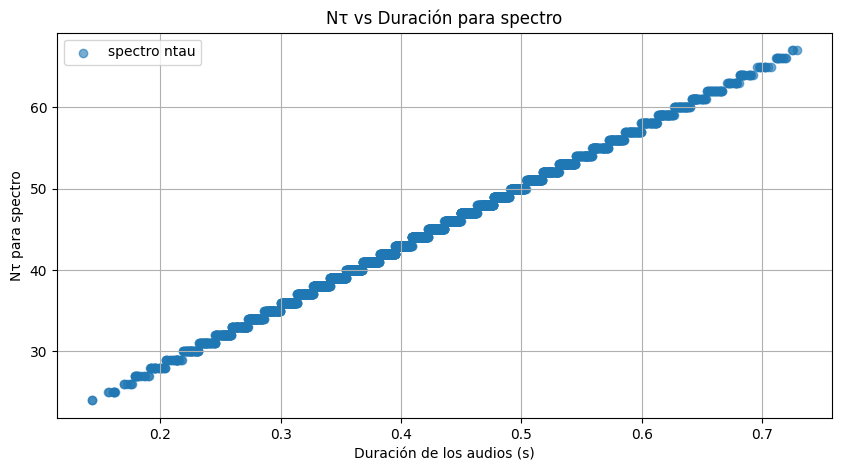

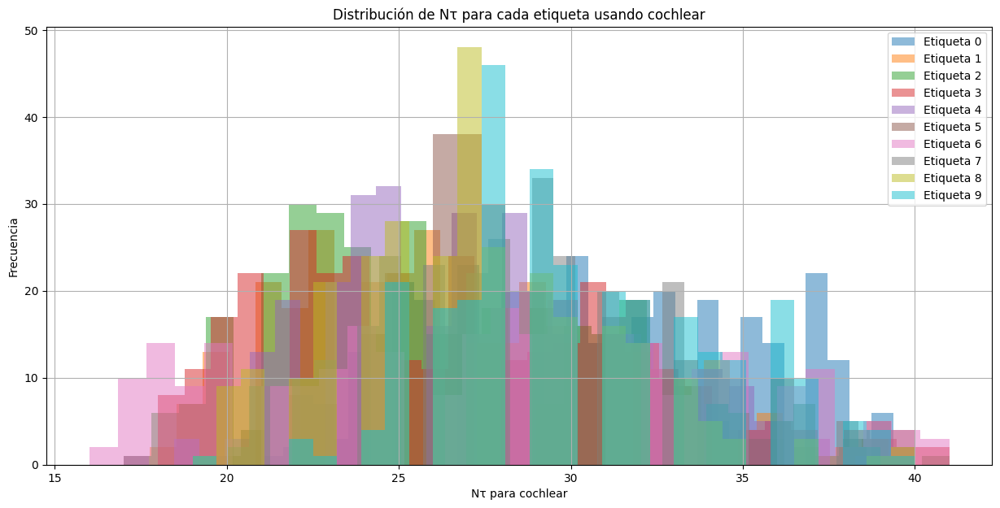

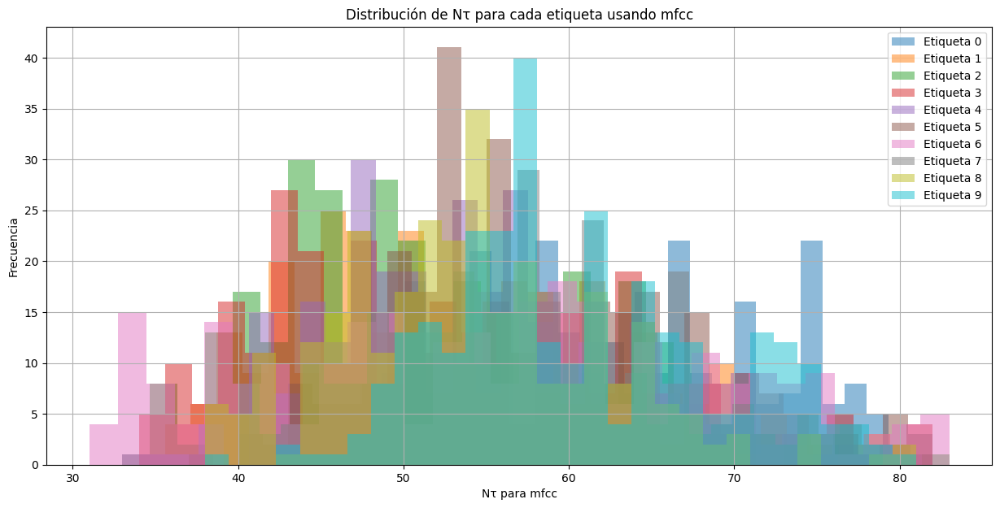

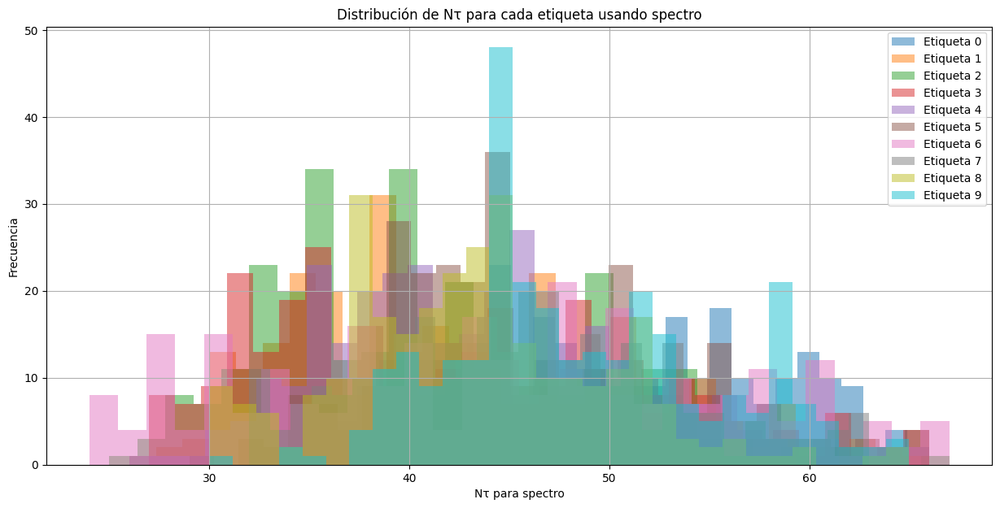

In [6]:
import numpy as np
import matplotlib.pyplot as plt

# Asumiendo que 'filtered_durations' contiene las duraciones de los audios filtrados

# Definir los rangos máximos y mínimos de Nτ para cada tipo de filtro acústico
ntau_ranges = {
    'cochlear': (16, 41),
    'mfcc': (31, 83),
    'spectro': (24, 67)
}

# Función para calcular Nτ basado en la duración y los rangos dados
def calculate_ntau(duration, ntau_min, ntau_max):
    # Mapear la duración al rango de Nτ, considerando la duración mínima y máxima en el dataset
    ntau = np.interp(duration, [np.min(filtered_durations), np.max(filtered_durations)], [ntau_min, ntau_max])
    return int(np.round(ntau))

# Calcula Nτ para cada filtro y cada muestra de audio
ntau_values = {filter_type: [calculate_ntau(dur, *ntau_ranges[filter_type]) for dur in filtered_durations] for filter_type in ntau_ranges}

# Graficar Nτ vs duración para cada tipo de filtro
for filter_type, ntau_list in ntau_values.items():
    plt.figure(figsize=(10, 5))
    plt.scatter(filtered_durations, ntau_list, alpha=0.6, label=f'{filter_type} ntau')
    plt.xlabel('Duración de los audios (s)')
    plt.ylabel(f'Nτ para {filter_type}')
    plt.title(f'Nτ vs Duración para {filter_type}')
    plt.legend()
    plt.grid(True)
    plt.show()

# Función para graficar la distribución de Nτ para cada etiqueta y cada filtro
def plot_ntau_distribution_per_label(labels, ntau_list, filter_type):
    unique_labels = set(labels)
    plt.figure(figsize=(15, 7))
    for label in unique_labels:
        label_ntau = [ntau for ntau, lbl in zip(ntau_list, labels) if lbl == label]
        plt.hist(label_ntau, bins=30, alpha=0.5, label=f'Etiqueta {label}')
    
    plt.title(f'Distribución de Nτ para cada etiqueta usando {filter_type}')
    plt.xlabel(f'Nτ para {filter_type}')
    plt.ylabel('Frecuencia')
    plt.legend()
    plt.grid(True)
    plt.show()

# Asumiendo que 'flat_labels' contiene las etiquetas correspondientes a 'filtered_durations'
for filter_type, ntau_list in ntau_values.items():
    plot_ntau_distribution_per_label(flat_labels, ntau_list, filter_type)


In [7]:
import pickle

# Asumiendo que 'sub_dataset' es tu subconjunto de datos
# Especifica la ruta y el nombre del archivo donde deseas guardar el subconjunto
pickle_file_path = './spoken_mnist_data_cleaned.pickle'

# Guardar el subconjunto de datos en formato pickle
with open(pickle_file_path, 'wb') as file:
    pickle.dump(sub_dataset, file)

print(f"Subconjunto de datos guardado en {pickle_file_path}")

Subconjunto de datos guardado en ./spoken_mnist_data_cleaned.pickle


In [8]:
audio_data = [d['audio_data'].flatten() for d in sub_dataset]

print(audio_data) 

[array([-1489.,  -962.,  -606., ..., -1814., -1110.,   -15.]), array([ 36.,  18.,  63., ..., -22., -35.,  15.]), array([-175., -509.,  293., ...,  -93., -137.,  -89.]), array([ 103.,  138.,  196., ..., -273., -238., -173.]), array([ 67.,  91., 104., ..., 161.,  99., 164.]), array([-138., -124., -106., ...,  -99.,  -78.,  -69.]), array([ 12.,  39., 179., ...,  83.,  68., 114.]), array([-447., -407., -644., ...,  132.,  105.,   63.]), array([ 71.,  98., 109., ...,  58.,  45.,  60.]), array([62., 72., 90., ..., 51., 39., 59.]), array([ -36.,  -52.,  -62., ...,  -63.,  -59., -101.]), array([-222., -226., -247., ..., -162., -186., -171.]), array([  76.,  123.,  141., ..., -156., -131., -110.]), array([ -93., -106.,  -94., ...,   13.,   70.,   72.]), array([ 29., -37.,  41., ..., -75.,  13., 101.]), array([105., 103., 105., ...,  24.,  47.,  26.]), array([  72.,  158.,    0., ...,   -7.,  -83., -129.]), array([-218., -184., -144., ...,   88.,   27.,  -79.]), array([ 103., -223.,  113., ..., 

#### 1.2 ) Noise Eda And Noise Reduction

In [9]:
from scipy import signal
import numpy as np

# Suponiendo que 'sub_dataset' contiene los datos de audio, etiquetas y hablantes como se describió anteriormente

# Y asumiendo que 'audio_data' es una lista de arrays de numpy, cada uno representando un audio

# Función para calcular la SNR
def calculate_snr(signal, noise):
    signal_power = np.mean(signal ** 2)
    noise_power = np.mean(noise ** 2)
    return 10 * np.log10(signal_power / noise_power) if noise_power > 0 else float('inf')

# Aplicar el filtro de Wiener y calcular la SNR para cada audio
snr_values = []
snr_per_speaker = {speaker: [] for speaker in set(data["speaker"] for data in sub_dataset)}
snr_per_speaker_label = {(data["speaker"], data["label"]): [] for data in sub_dataset}

for data in sub_dataset:
    # Aplicar el filtro de Wiener
    audio_filtrado = signal.wiener(data["audio_data"])
    data["audio_weiner_filtered"] = audio_filtrado
    # Calcular el ruido (original - filtrado)
    ruido_estimado = data["audio_data"] - audio_filtrado

    # Calcular la SNR
    snr = calculate_snr(data["audio_data"], ruido_estimado)
    snr_values.append(snr)

    # Agregar a los conteos por hablante y por etiqueta
    snr_per_speaker[data["speaker"]].append(snr)
    snr_per_speaker_label[(data["speaker"], data["label"])].append(snr)

# Calcular la SNR promedio del dataset
snr_promedio_dataset = np.mean(snr_values)

# Calcular la SNR promedio por hablante
snr_promedio_por_hablante = {speaker: np.mean(snr_list) for speaker, snr_list in snr_per_speaker.items()}

# Calcular la SNR promedio por hablante y etiqueta
snr_promedio_por_hablante_etiqueta = {(speaker, label): np.mean(snr_list) 
                                      for (speaker, label), snr_list in snr_per_speaker_label.items()}

# Imprimir los resultados
print(f"SNR promedio del dataset: {snr_promedio_dataset}")
print("\nSNR promedio por hablante:")
for speaker, snr_prom in snr_promedio_por_hablante.items():
    print(f"{speaker}: {snr_prom}")

print("\nSNR promedio por hablante y etiqueta:")
for (speaker, label), snr_prom in snr_promedio_por_hablante_etiqueta.items():
    print(f"{speaker}, {label}: {snr_prom}")



C:\Users\david\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\scipy\signal\_signaltools.py:1657: RuntimeWarning: divide by zero encountered in divide
  res *= (1 - noise / lVar)
C:\Users\david\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\scipy\signal\_signaltools.py:1657: RuntimeWarning: invalid value encountered in multiply
  res *= (1 - noise / lVar)


SNR promedio del dataset: 10.067443111158777

SNR promedio por hablante:
jackson: 9.551750241498148
lucas: 10.672950662316113
theo: 9.630454343146948
nicolas: 10.918659415899594
george: 10.015477111654269
yweweler: 9.652419590079921

SNR promedio por hablante y etiqueta:
george, 0: 8.599272392368807
jackson, 0: 9.513563939891652
lucas, 0: 10.510363667611388
nicolas, 0: 9.410046198768947
theo, 0: 8.493372283942481
yweweler, 0: 9.209357557266463
george, 1: 9.100483180149936
jackson, 1: 9.3868663763477
lucas, 1: 11.917242494320114
nicolas, 1: 10.025146455572589
theo, 1: 9.016763213945605
yweweler, 1: 9.706147390675321
george, 2: 9.333577542786168
jackson, 2: 9.691313983718135
lucas, 2: 10.476665954926817
nicolas, 2: 9.941365309403864
theo, 2: 8.584095920465955
yweweler, 2: 9.197053976695004
george, 3: 9.414609849070228
jackson, 3: 8.654827224794293
lucas, 3: 10.138892790126826
nicolas, 3: 10.55928833494895
theo, 3: 8.56995801288422
yweweler, 3: 9.485041758786913
george, 4: 10.385693599871

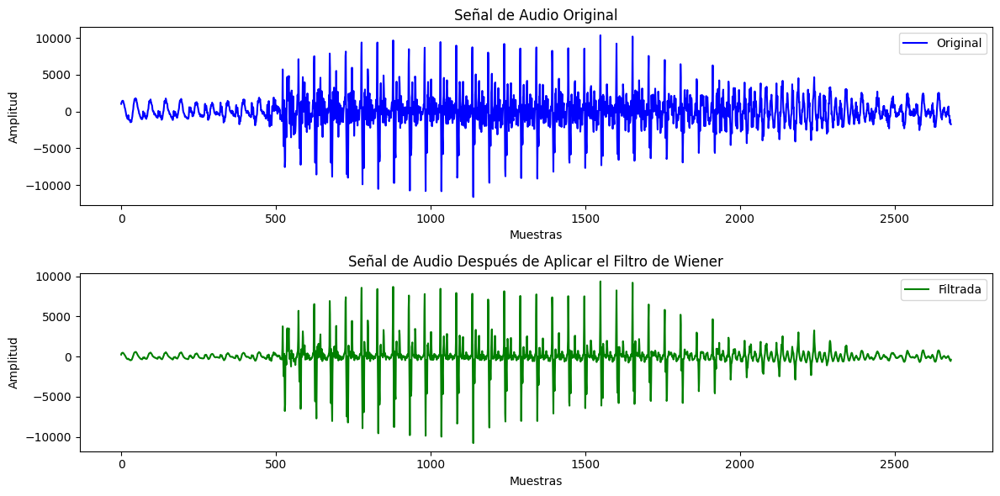

In [10]:
import matplotlib.pyplot as plt

# Suponiendo que todavía estamos usando el mismo 'sub_dataset' y eligiendo un dato al azar para la demostración
# Seleccionar un dato aleatorio del dataset
sample_data = sub_dataset[np.random.randint(len(sub_dataset))]

# Aplicar el filtro de Wiener al dato seleccionado
audio_filtrado = signal.wiener(sample_data["audio_data"])

# Dibujar las señales original y filtrada
plt.figure(figsize=(12, 6))

# Señal Original
plt.subplot(2, 1, 1)
plt.plot(sample_data["audio_data"], label="Original", color="blue")
plt.title("Señal de Audio Original")
plt.xlabel("Muestras")
plt.ylabel("Amplitud")
plt.legend()

# Señal Filtrada
plt.subplot(2, 1, 2)
plt.plot(audio_filtrado, label="Filtrada", color="green")
plt.title("Señal de Audio Después de Aplicar el Filtro de Wiener")
plt.xlabel("Muestras")
plt.ylabel("Amplitud")
plt.legend()

plt.tight_layout()
plt.show()



#### 1.3) Data Filtering 

In [11]:
# Contando directamente del dataset proporcionado los datos por label para cada speaker
label_speaker_count_direct = {}

for data in sub_dataset:
    speaker = data["speaker"]
    label = data["label"]
    key = (speaker, label)
    if key not in label_speaker_count_direct:
        label_speaker_count_direct[key] = 0
    label_speaker_count_direct[key] += 1

# Organizando los conteos por speaker para imprimirlos de manera ordenada
organized_counts = {}
for key, count in label_speaker_count_direct.items():
    speaker, label = key
    if speaker not in organized_counts:
        organized_counts[speaker] = {}
    organized_counts[speaker][label] = count

# Imprimiendo los resultados
for speaker, label_counts in organized_counts.items():
    print(f"\nSpeaker {speaker}:")
    for label, count in label_counts.items():
        print(f"Label {label}: {count} datos")



Speaker george:
Label 0: 49 datos
Label 1: 50 datos
Label 2: 50 datos
Label 3: 50 datos
Label 4: 50 datos
Label 5: 50 datos
Label 6: 50 datos
Label 7: 49 datos
Label 8: 50 datos
Label 9: 50 datos

Speaker jackson:
Label 0: 49 datos
Label 1: 50 datos
Label 2: 49 datos
Label 3: 50 datos
Label 4: 50 datos
Label 5: 50 datos
Label 6: 30 datos
Label 7: 50 datos
Label 8: 50 datos
Label 9: 50 datos

Speaker lucas:
Label 0: 41 datos
Label 1: 43 datos
Label 2: 45 datos
Label 3: 45 datos
Label 4: 47 datos
Label 5: 45 datos
Label 6: 47 datos
Label 7: 42 datos
Label 8: 44 datos
Label 9: 45 datos

Speaker nicolas:
Label 0: 50 datos
Label 1: 50 datos
Label 2: 50 datos
Label 3: 50 datos
Label 4: 50 datos
Label 5: 50 datos
Label 6: 50 datos
Label 7: 50 datos
Label 8: 50 datos
Label 9: 50 datos

Speaker theo:
Label 0: 50 datos
Label 1: 49 datos
Label 2: 50 datos
Label 3: 50 datos
Label 4: 50 datos
Label 5: 49 datos
Label 6: 50 datos
Label 7: 48 datos
Label 8: 50 datos
Label 9: 45 datos

Speaker ywewele

In [12]:
# Seleccionar los 5 hablantes con la SNR más alta y luego seleccionar los 30 datos más limpios por cada label para cada uno de estos hablantes

# Calcular la SNR promedio por hablante
snr_promedio_por_hablante = {}
for speaker in snr_per_speaker:
    snr_promedio_por_hablante[speaker] = np.mean(snr_per_speaker[speaker])

# Seleccionar los 5 hablantes con la SNR más alta
top_5_speakers = sorted(snr_promedio_por_hablante, key=snr_promedio_por_hablante.get, reverse=True)[:5]

# Seleccionar los 30 datos más limpios por cada label para cada uno de los 5 hablantes
top_data_per_speaker_label = {}

for speaker in top_5_speakers:
    for label in set(data["label"] for data in sub_dataset if data["speaker"] == speaker):
        # Filtrar los datos para el hablante y etiqueta específicos
        filtered_data = [data for data in sub_dataset if data["speaker"] == speaker and data["label"] == label]

        # Ordenar por SNR y seleccionar los 30 primeros
        filtered_data.sort(key=lambda x: calculate_snr(x["audio_data"], x["audio_data"] - x["audio_weiner_filtered"]), reverse=True)
        top_data_per_speaker_label[(speaker, label)] = filtered_data[:30]

# Extraer los índices de las instancias seleccionadas
selected_indices = {(speaker, label): [data["index"] for data in top_data] 
                    for (speaker, label), top_data in top_data_per_speaker_label.items()}

selected_indices



{('nicolas', 0): [149,
  148,
  139,
  145,
  143,
  147,
  146,
  141,
  144,
  140,
  153,
  142,
  172,
  151,
  184,
  163,
  152,
  174,
  166,
  183,
  154,
  164,
  155,
  162,
  168,
  167,
  158,
  187,
  160,
  171],
 ('nicolas', 1): [435,
  438,
  436,
  437,
  433,
  441,
  448,
  439,
  447,
  446,
  445,
  444,
  434,
  443,
  449,
  440,
  432,
  442,
  477,
  472,
  468,
  469,
  452,
  465,
  475,
  467,
  476,
  463,
  455,
  453],
 ('nicolas', 2): [749,
  741,
  744,
  732,
  725,
  729,
  726,
  752,
  746,
  747,
  748,
  735,
  737,
  733,
  745,
  739,
  743,
  753,
  730,
  750,
  731,
  727,
  738,
  742,
  762,
  774,
  734,
  736,
  760,
  751],
 ('nicolas', 3): [1049,
  1047,
  1030,
  1046,
  1026,
  1022,
  1036,
  1048,
  1038,
  1041,
  1024,
  1025,
  1020,
  1037,
  1029,
  1031,
  1035,
  1043,
  1032,
  1028,
  1045,
  1034,
  1023,
  1033,
  1040,
  1021,
  1027,
  1039,
  1051,
  1042],
 ('nicolas', 4): [1342,
  1347,
  1331,
  1322,
  1327,
  1348

In [13]:
# Crear un subconjunto del dataset que contenga solo los audios seleccionados, filtrados de ruido, sus etiquetas y el hablante correspondiente

# Inicializar el subconjunto
sub_dataset_selected = []

# Iterar sobre cada hablante y etiqueta en los índices seleccionados
for (speaker, label), indices in selected_indices.items():
    for index in indices:
        # Encontrar el dato correspondiente en el dataset original
        data = next((item for item in sub_dataset if item["index"] == index), None)
        if data:
            # Agregar al subconjunto la señal filtrada, su etiqueta y el hablante
            sub_dataset_selected.append((data["audio_weiner_filtered"].astype(np.float32), data["label"], speaker))

# Verificando los primeros elementos del subconjunto
sub_dataset_selected[:5]  # Muestra solo los primeros 5 para verificación 




[(array([[ 12.777778],
         [ 14.888889],
         [-42.22222 ],
         ...,
         [-19.555555],
         [-16.444445],
         [ -8.777778]], dtype=float32),
  0,
  'nicolas'),
 (array([[ 0.6666667 ],
         [ 0.22222222],
         [ 0.        ],
         ...,
         [-3.8888888 ],
         [-3.4444444 ],
         [-2.2222223 ]], dtype=float32),
  0,
  'nicolas'),
 (array([[-4.3333335],
         [-6.6666665],
         [-6.2222223],
         ...,
         [-1.3333334],
         [-0.6666667],
         [-1.8888888]], dtype=float32),
  0,
  'nicolas'),
 (array([[6.888889 ],
         [9.888889 ],
         [9.222222 ],
         ...,
         [4.5555553],
         [4.7777777],
         [3.7777777]], dtype=float32),
  0,
  'nicolas'),
 (array([[0.22222222],
         [0.5555556 ],
         [0.        ],
         ...,
         [0.7777778 ],
         [0.5555556 ],
         [0.        ]], dtype=float32),
  0,
  'nicolas')]

In [14]:
# CHECKPOINT

import pickle

# Asumiendo que 'sub_dataset' es tu subconjunto de datos
# Especifica la ruta y el nombre del archivo donde deseas guardar el subconjunto
pickle_file_path = './spoken_mnistV2_sub_dataset_selected.pickle'

# Guardar el subconjunto de datos en formato pickle
with open(pickle_file_path, 'wb') as file:
    pickle.dump(sub_dataset_selected, file)

print(f"Subconjunto de datos guardado en {pickle_file_path}")

Subconjunto de datos guardado en ./spoken_mnistV2_sub_dataset_selected.pickle


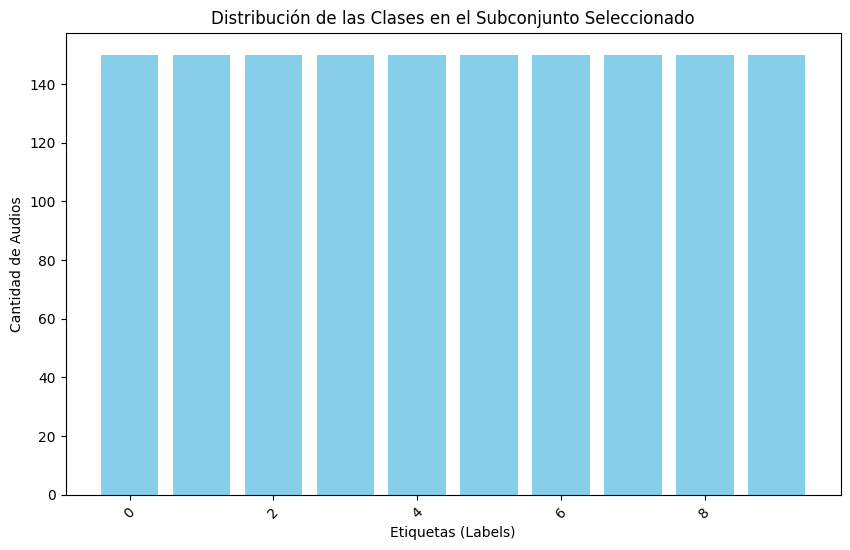

Total de datos por speaker seleccionado:
nicolas: 300 datos
lucas: 300 datos
george: 300 datos
yweweler: 300 datos
theo: 300 datos

Total de datos por label por speaker seleccionado:
nicolas, 0: 30 datos
nicolas, 1: 30 datos
nicolas, 2: 30 datos
nicolas, 3: 30 datos
nicolas, 4: 30 datos
nicolas, 5: 30 datos
nicolas, 6: 30 datos
nicolas, 7: 30 datos
nicolas, 8: 30 datos
nicolas, 9: 30 datos
lucas, 0: 30 datos
lucas, 1: 30 datos
lucas, 2: 30 datos
lucas, 3: 30 datos
lucas, 4: 30 datos
lucas, 5: 30 datos
lucas, 6: 30 datos
lucas, 7: 30 datos
lucas, 8: 30 datos
lucas, 9: 30 datos
george, 0: 30 datos
george, 1: 30 datos
george, 2: 30 datos
george, 3: 30 datos
george, 4: 30 datos
george, 5: 30 datos
george, 6: 30 datos
george, 7: 30 datos
george, 8: 30 datos
george, 9: 30 datos
yweweler, 0: 30 datos
yweweler, 1: 30 datos
yweweler, 2: 30 datos
yweweler, 3: 30 datos
yweweler, 4: 30 datos
yweweler, 5: 30 datos
yweweler, 6: 30 datos
yweweler, 7: 30 datos
yweweler, 8: 30 datos
yweweler, 9: 30 dat

In [15]:
import matplotlib.pyplot as plt

# Contar la frecuencia de cada etiqueta en el subconjunto seleccionado
label_counts = {}
for _, label,_ in sub_dataset_selected:
    if label not in label_counts:
        label_counts[label] = 0
    label_counts[label] += 1

# Preparar datos para el gráfico
labels = list(label_counts.keys())
counts = [label_counts[label] for label in labels]

# Crear gráfico de barras
plt.figure(figsize=(10, 6))
plt.bar(labels, counts, color='skyblue')
plt.xlabel('Etiquetas (Labels)')
plt.ylabel('Cantidad de Audios')
plt.title('Distribución de las Clases en el Subconjunto Seleccionado')
plt.xticks(rotation=45)
plt.show()

# Calcular el total de datos, el total de datos por speaker y el total de datos por label por speaker

# Dado que el subconjunto seleccionado solo contiene audio filtrado y etiquetas, necesitamos ajustar el enfoque

# Calcular el total de datos por speaker y por label por speaker a partir del subconjunto original
# Utilizaremos los índices seleccionados para hacer esto

total_datos_por_speaker_selected = {speaker: 0 for speaker in top_5_speakers}
total_datos_por_label_por_speaker_selected = {(speaker, label): 0 
                                              for speaker in top_5_speakers 
                                              for label in set(data["label"] for data in sub_dataset)}

# Contar los datos por speaker y por label por speaker
for (speaker, label), indices in selected_indices.items():
    total_datos_por_speaker_selected[speaker] += len(indices)
    total_datos_por_label_por_speaker_selected[(speaker, label)] += len(indices)

# Imprimir los resultados
#print(f"Total de datos en el subconjunto seleccionado: {total_datos}\n")
print("Total de datos por speaker seleccionado:")
for speaker, count in total_datos_por_speaker_selected.items():
    print(f"{speaker}: {count} datos")

print("\nTotal de datos por label por speaker seleccionado:")
for (speaker, label), count in total_datos_por_label_por_speaker_selected.items():
    print(f"{speaker}, {label}: {count} datos")





# 2) Data PreProsesing 

### 2.1) Filters

- Spectrogram : 
    - Linear 
    - Mel Spectrogram 
    - Non linear Exponetial Espectrogram 
- MFCC (python Librosa or Pytorch)

- Cochlear : 
    - Lyon Cochlear 1990 Matlab Implementation 
    - Carfac google Implementation 

#### 2.1.1) MFCC 

##### 2.1.1.1) Filter Aplication

In [16]:
# Agregar un print para mostrar el time step máximo y mínimo alcanzado en los MFCCs

import librosa

# Inicializamos una lista para almacenar las características MFCC
mfcc_features = []

# Iterar sobre cada audio en el subconjunto seleccionado
for audio, _,_ in sub_dataset_selected:
    # Aplanar el audio para asegurarse de que sea unidimensional
    audio = audio.flatten()
    
    # Calcular MFCCs. Asumiendo una tasa de muestreo de 8000 Hz.
    mfcc = librosa.feature.mfcc(y=audio, sr=8000, n_mfcc=13 , )
    mfcc_features.append(mfcc)

# Inicializar variables para almacenar los time steps máximos y mínimos
max_time_steps = 0
min_time_steps = float('inf')

# Iterar sobre los MFCCs para encontrar los valores máximos y mínimos
for mfcc in mfcc_features:
    print(mfcc.shape)  # Imprimir la forma de cada MFCC
    time_steps = mfcc.shape[1]
    max_time_steps = max(max_time_steps, time_steps)
    min_time_steps = min(min_time_steps, time_steps)

# Imprimir el time step máximo y mínimo
print(f"Time step máximo: {max_time_steps}")
print(f"Time step mínimo: {min_time_steps}")



C:\Users\david\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\librosa\core\spectrum.py:257: UserWarning: n_fft=2048 is too large for input signal of length=1933
  warnings.warn(
C:\Users\david\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\librosa\core\spectrum.py:257: UserWarning: n_fft=2048 is too large for input signal of length=2034
  warnings.warn(
C:\Users\david\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\librosa\core\spectrum.py:257: UserWarning: n_fft=2048 is too large for input signal of length=1973
  warnings.warn(
C:\Users\david\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\librosa\core\spectrum.py:257: UserWarning: n_fft=2048 is too large for input signal of length=13

(13, 19)
(13, 11)
(13, 12)
(13, 10)
(13, 12)
(13, 9)
(13, 9)
(13, 10)
(13, 10)
(13, 8)
(13, 9)
(13, 10)
(13, 7)
(13, 8)
(13, 8)
(13, 8)
(13, 8)
(13, 8)
(13, 8)
(13, 7)
(13, 9)
(13, 8)
(13, 8)
(13, 6)
(13, 7)
(13, 7)
(13, 8)
(13, 8)
(13, 9)
(13, 8)
(13, 11)
(13, 12)
(13, 12)
(13, 9)
(13, 7)
(13, 6)
(13, 8)
(13, 9)
(13, 8)
(13, 7)
(13, 6)
(13, 7)
(13, 7)
(13, 5)
(13, 8)
(13, 7)
(13, 8)
(13, 8)
(13, 7)
(13, 5)
(13, 6)
(13, 6)
(13, 6)
(13, 6)
(13, 5)
(13, 5)
(13, 6)
(13, 5)
(13, 5)
(13, 6)
(13, 16)
(13, 16)
(13, 19)
(13, 9)
(13, 10)
(13, 7)
(13, 7)
(13, 5)
(13, 9)
(13, 8)
(13, 7)
(13, 8)
(13, 8)
(13, 6)
(13, 7)
(13, 9)
(13, 10)
(13, 6)
(13, 9)
(13, 6)
(13, 7)
(13, 7)
(13, 7)
(13, 7)
(13, 6)
(13, 5)
(13, 7)
(13, 9)
(13, 7)
(13, 5)
(13, 20)
(13, 21)
(13, 15)
(13, 12)
(13, 11)
(13, 11)
(13, 11)
(13, 10)
(13, 11)
(13, 11)
(13, 10)
(13, 11)
(13, 8)
(13, 8)
(13, 12)
(13, 8)
(13, 9)
(13, 9)
(13, 8)
(13, 11)
(13, 9)
(13, 9)
(13, 8)
(13, 8)
(13, 9)
(13, 10)
(13, 9)
(13, 8)
(13, 6)
(13, 8)
(13, 18)


C:\Users\david\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\librosa\core\spectrum.py:257: UserWarning: n_fft=2048 is too large for input signal of length=1722
  warnings.warn(
C:\Users\david\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\librosa\core\spectrum.py:257: UserWarning: n_fft=2048 is too large for input signal of length=1968
  warnings.warn(
C:\Users\david\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\librosa\core\spectrum.py:257: UserWarning: n_fft=2048 is too large for input signal of length=1911
  warnings.warn(


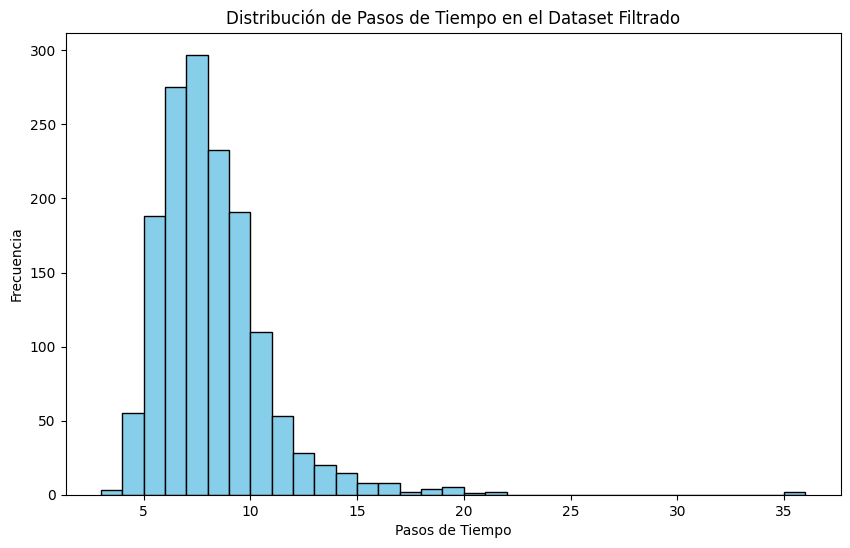

In [17]:
# Continuando desde el código anterior para plotear la distribución de time steps

import matplotlib.pyplot as plt

# Inicializamos una lista para almacenar los time steps de cada MFCC
time_steps_list = []

# Iterar sobre los MFCCs para extraer los time steps
for mfcc in mfcc_features:
    time_steps = mfcc.shape[1]
    time_steps_list.append(time_steps)

# Crear un histograma de los time steps
plt.figure(figsize=(10, 6))
plt.hist(time_steps_list, bins=range(min(time_steps_list), max(time_steps_list) + 1), color='skyblue', edgecolor='black')
plt.xlabel('Pasos de Tiempo')
plt.ylabel('Frecuencia')
plt.title('Distribución de Pasos de Tiempo en el Dataset Filtrado')
plt.show()




In [18]:
# Supongamos que ya hemos calculado los MFCCs y están almacenados en la lista mfcc_features
# Ahora vamos a aplicar zero padding para que todos tengan el mismo número de time steps
# El número objetivo de time steps es 83 según la especificación anterior

# Parámetro objetivo para el padding
target_time_steps = 36

# Aplicar zero padding a los MFCCs para que todos tengan el mismo número de time steps
mfcc_padded = []
for mfcc in mfcc_features:
    # Calcular la cantidad de padding necesaria
    padding_amount = target_time_steps - mfcc.shape[1]
    if padding_amount > 0:
        # Aplicar zero padding al final de la segunda dimensión (time steps)
        mfcc = np.pad(mfcc, ((0, 0), (0, padding_amount)), mode='constant', constant_values=0)
    mfcc_padded.append(mfcc)

# Imprimir las dimensiones resultantes de cada conjunto de MFCCs después del padding
for mfcc in mfcc_padded:
    print(mfcc.shape)



(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(13, 36)
(

##### With Padding

##### 2.1.1.2 ) Linear CLasifier Readout

In [19]:
# Inicializar una lista vacía para almacenar todos los vectores aplanados
audios_procesados = []

# Iterar sobre cada tupla en resultados_procesados
for vector in mfcc_padded:
    # Aplanar el vector a una dimensión
    vector_aplanado = np.ravel(vector)
    # Añadir el vector aplanado a la lista
    audios_procesados.append(vector_aplanado)

# Convertir la lista de vectores aplanados en un array de NumPy
audios_procesados = np.array(audios_procesados)

# Normalización
max_val = np.max(np.abs(audios_procesados))

audios_procesados_normalized = audios_procesados / max_val

etiquetas = [elemento[1] for elemento in sub_dataset_selected]

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
etiquetas_encoded = label_encoder.fit_transform(etiquetas)


from tensorflow.keras.utils import to_categorical

etiquetas_one_hot = to_categorical(etiquetas_encoded)



In [20]:
from sklearn.model_selection import train_test_split
from collections import defaultdict

# Suponiendo que 'sub_dataset_selected' es tu lista de tuplas, y cada tupla tiene la forma (audio, label, speaker)

# Crear un diccionario para agrupar los datos por hablante y etiqueta
grouped_data = defaultdict(list)
for i, (audio, label, speaker) in enumerate(sub_dataset_selected):
    grouped_data[(speaker, label)].append(i)

# Inicializar listas para los índices de entrenamiento y prueba
train_indices = []
test_indices = []

# Dividir los datos estratificando por combinación de hablante y etiqueta
for (speaker, label), indices in grouped_data.items():
    # Solo dividir si hay suficientes datos para estratificar
    if len(indices) > 1:
        # Extraer los subconjuntos de datos correspondientes a los índices actuales
        sub_dataset = [sub_dataset_selected[i] for i in indices]
        sub_labels = [label for i in indices]
        # Dividir el subconjunto de datos
        indices_train, indices_test = train_test_split(
            indices, test_size=0.2, random_state=42, shuffle=True, stratify=sub_labels
        )
        # Agregar los índices de entrenamiento y prueba a las listas globales
        train_indices.extend(indices_train)
        test_indices.extend(indices_test)

# Usar los índices para crear los conjuntos de entrenamiento y prueba finales
train_dataset = [sub_dataset_selected[i] for i in train_indices]
test_dataset = [sub_dataset_selected[i] for i in test_indices]

# Verificar el balance de los conjuntos
# Esto es solo para demostración, ya que no tenemos un dataset real para mostrar
print(f"Train set size: {len(train_dataset)}, Test set size: {len(test_dataset)}")


Train set size: 1200, Test set size: 300


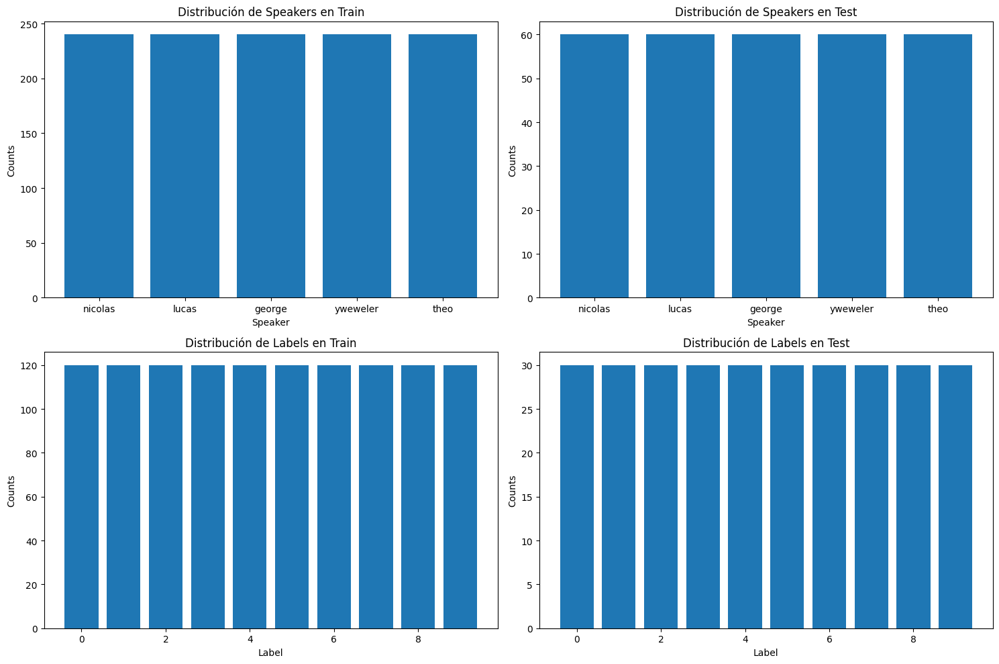

In [21]:
from collections import Counter




import matplotlib.pyplot as plt

# Suponiendo que 'train_dataset' y 'test_dataset' son las listas de tuplas que contienen los datos de entrenamiento y prueba
# y cada tupla es de la forma (audio, label, speaker)

# Extraer la información de hablante y etiqueta para los conjuntos de entrenamiento y prueba
train_speakers = [data[2] for data in train_dataset]
test_speakers = [data[2] for data in test_dataset]
train_labels = [data[1] for data in train_dataset]
test_labels = [data[1] for data in test_dataset]

# Contar las ocurrencias de cada hablante y etiqueta
train_speaker_counts = Counter(train_speakers)
test_speaker_counts = Counter(test_speakers)
train_label_counts = Counter(train_labels)
test_label_counts = Counter(test_labels)

# Crear las figuras para los histogramas
fig, axs = plt.subplots(2, 2, figsize=(15, 10))

# Histograma de la distribución de hablantes en el conjunto de entrenamiento
axs[0, 0].bar(train_speaker_counts.keys(), train_speaker_counts.values())
axs[0, 0].set_title('Distribución de Speakers en Train')
axs[0, 0].set_xlabel('Speaker')
axs[0, 0].set_ylabel('Counts')

# Histograma de la distribución de hablantes en el conjunto de prueba
axs[0, 1].bar(test_speaker_counts.keys(), test_speaker_counts.values())
axs[0, 1].set_title('Distribución de Speakers en Test')
axs[0, 1].set_xlabel('Speaker')
axs[0, 1].set_ylabel('Counts')

# Histograma de la distribución de etiquetas en el conjunto de entrenamiento
axs[1, 0].bar(train_label_counts.keys(), train_label_counts.values())
axs[1, 0].set_title('Distribución de Labels en Train')
axs[1, 0].set_xlabel('Label')
axs[1, 0].set_ylabel('Counts')

# Histograma de la distribución de etiquetas en el conjunto de prueba
axs[1, 1].bar(test_label_counts.keys(), test_label_counts.values())
axs[1, 1].set_title('Distribución de Labels en Test')
axs[1, 1].set_xlabel('Label')
axs[1, 1].set_ylabel('Counts')

# Ajustar el layout para evitar la superposición de títulos
plt.tight_layout()

# Mostrar los gráficos
plt.show()




In [22]:
import numpy as np
import numpy as np

# Aleatorizar el orden de las muestras en los conjuntos de entrenamiento y prueba
train_indices = np.random.permutation(train_indices)
test_indices = np.random.permutation(test_indices)

# Reconstruir X_train, X_test, y_train, y_test con los índices aleatorizados
X_train = audios_procesados_normalized[train_indices]
X_test = audios_procesados_normalized[test_indices]
y_train = etiquetas_one_hot[train_indices]
y_test = etiquetas_one_hot[test_indices]



X_train_filter_only = np.array(X_train)
X_test_filter_only = np.array(X_test)
y_train_filter_only = np.array(y_train)
y_test_filter_only = np.array(y_test)

print("Forma de X_train:", X_train_filter_only.shape)
print("Forma de X_test:", X_test_filter_only.shape)
print("Forma de y_train:", y_train_filter_only.shape)
print("Forma de y_test:", y_test_filter_only.shape)

Forma de X_train: (1200, 468)
Forma de X_test: (300, 468)
Forma de y_train: (1200, 10)
Forma de y_test: (300, 10)


In [23]:
# Convertir las etiquetas one-hot de vuelta a etiquetas de clase para facilitar la visualización
y_train_classes = np.argmax(y_train, axis=1)
y_test_classes = np.argmax(y_test, axis=1)

# Imprimir las distribuciones de las etiquetas
print("Distribución de etiquetas en y_train:", np.bincount(y_train_classes))
print("Distribución de etiquetas en y_test:", np.bincount(y_test_classes))


# Imprimir las primeras 30 etiquetas de y_train y y_test para ver cómo quedaron ordenadas
print("Primeras 30 etiquetas en y_train:", y_train_classes[:30])
print("Primeras 30 etiquetas en y_test:", y_test_classes[:30])

Distribución de etiquetas en y_train: [120 120 120 120 120 120 120 120 120 120]
Distribución de etiquetas en y_test: [30 30 30 30 30 30 30 30 30 30]
Primeras 30 etiquetas en y_train: [2 5 7 1 0 7 5 8 9 0 5 5 1 0 2 7 0 2 2 8 0 3 4 9 5 5 7 5 4 5]
Primeras 30 etiquetas en y_test: [7 1 2 1 9 0 4 4 8 9 5 2 5 1 0 5 3 3 7 5 9 7 0 1 7 3 7 3 8 2]


In [24]:
import numpy as np
from sklearn.metrics import accuracy_score

def linear_clasifier_readout(X_train, y_train, X_test, y_test, num_samples_test , num_samples_train, num_intervals ,num_labels,num_features):
    # Repetimos las etiquetas one-hot para cada intervalo
    
    # Transponemos y_train
    y_train_transposed = y_train.T

    # Usamos np.tile para repetir la matriz transpuesta
    Y_hat_repeated = np.tile(y_train_transposed, (1, num_intervals))

    # Redimensionamos X_train a una forma que separe las muestras, los intervalos y las características
    X_train_intermediate = X_train.reshape(num_samples_train, num_features, num_intervals)

    # Reorganizamos la matriz a la forma deseada [(num_samples * num_intervals), num_features]
    S = X_train_intermediate.reshape(num_samples_train * num_intervals, num_features)

    # Calculamos la pseudoinversa de la salida aplanada del reservorio
    S_moore = np.linalg.pinv(S).T

    # Calculamos los pesos
    Weights = Y_hat_repeated @ S_moore



    # Aplicamos los pesos al conjunto de prueba

    # Reorganizar X_test a la forma (300, 13, 36)
    X_test_reshaped = X_test.reshape(num_samples_test, num_features, num_intervals)

    # Inicializar una matriz para guardar los resultados
    # Cada muestra tendrá un resultado por intervalo, así que la forma será (300, 36, 10)
    results_test_raw = np.zeros((num_samples_test, num_intervals, Weights.shape[0]))

    # Aplicar la matriz de pesos a cada intervalo
    for i in range(num_intervals):
        interval_features = X_test_reshaped[:, :, i]  # Extraer las características de cada intervalo
        results_test_raw[:, i, :] = interval_features @ Weights.T  # Aplicar los pesos

    # Calculando el promedio a lo largo del eje de los intervalos
    # La forma de results_promedio será (num_samples_test, num_classes)
    results_test_promedio = np.mean(results_test_raw, axis=1)


    # Elegir la clase con el valor más alto para cada muestra
    # La forma de y_pred será (num_samples_test,)
    y_test_pred = np.argmax(results_test_promedio, axis=1)


    # y_pred contiene ahora las clases predichas para cada muestra


    # Aplicamos los pesos al conjunto de entrenamiento


        # Reorganizar X_test a la forma (300, 36, 13)
    X_train_reshaped = X_train.reshape(num_samples_train, num_features, num_intervals)

    # Inicializar una matriz para guardar los resultados
    # Cada muestra tendrá un resultado por intervalo, así que la forma será (300, 36, 10)
    results_train_raw = np.zeros((num_samples_train, num_intervals, Weights.shape[0]))

    # Aplicar la matriz de pesos a cada intervalo
    for i in range(num_intervals):
        interval_features = X_train_reshaped[:, :, i]  # Extraer las características de cada intervalo
        results_train_raw[:, i, :] = interval_features @ Weights.T  # Aplicar los pesos

    # Calculando el promedio a lo largo del eje de los intervalos
    # La forma de results_promedio será (num_samples_test, num_classes)
    results_train_promedio = np.mean(results_train_raw, axis=1)


    # Elegir la clase con el valor más alto para cada muestra
    # La forma de y_pred será (num_samples_train,)
    y_train_pred = np.argmax(results_train_promedio, axis=1)




    # Convertimos las etiquetas verdaderas one-hot en índices de clase
    y_test_true_indices = np.argmax(y_test, axis=1)
    y_train_true_indices = np.argmax(y_train, axis=1)

    # Calculamos la precisión
    accuracy_test = accuracy_score(y_test_true_indices, y_test_pred)
    accuracy_train = accuracy_score(y_train_true_indices, y_train_pred)

    # Imprimimos los resultados
    print('Shapes:')
    print('y_train Shape :', y_train.shape)
    print("Y_hat_repeated shape:", Y_hat_repeated.shape)
    print("Forma de la matriz S:", S.shape)
    print("Pseudo inverse shape :",S_moore.shape)
    print('Weights matrix shape', Weights.shape)
    print('Shapes for Test Set :')
    print("X_test content shape:",X_test_reshaped.shape)
    print("Test Prediction Raw Results Shape",results_test_raw.shape)
    print("Mean Results shape:",results_test_promedio.shape)


    print(f'Accuracy en el conjunto de prueba: {accuracy_test*100:.2f} %')
    print(f'Accuracy en el conjunto de train: {accuracy_train*100:.2f} %')

    print('Predicted Test Labels:')
    print(y_test_pred)
    print('True Test Labels:')
    print(y_test_true_indices)

    print('Predicted train Labels:')
    print(y_train_pred[:30])
    print('True train Labels:')
    print(y_train_true_indices[:30])


    print("y_test prediction results:")
    print("resultados de la prediccion de cada intervalo")
    #print(results_test_raw)


    print("resultados del promedio")
    #print(results_test_promedio)
    print("matriz de pesos")
    print(Weights)
    



#    return {
#        'accuracy_test': accuracy_test,
#        'accuracy_train': accuracy_train,
#        'y_test_pred': y_test_pred,
#        'y_train_pred': y_train_pred,
#        'Weights': Weights
#    }

# Ejemplo de cómo usar la función
# result = train_and_evaluate(X_train, y_train, X_test, y_test, num_samples_test, num_intervals, num_neurons_per_interval)
# print(result)

In [25]:
print(X_train)

[[0.5965325  0.6286972  0.60418564 ... 0.         0.         0.        ]
 [0.36154813 0.42332292 0.5880224  ... 0.         0.         0.        ]
 [0.24462275 0.2463546  0.24672656 ... 0.         0.         0.        ]
 ...
 [0.32337728 0.33509088 0.6918536  ... 0.         0.         0.        ]
 [0.740512   0.84711987 0.8531416  ... 0.         0.         0.        ]
 [0.6877987  0.83836955 0.9197124  ... 0.         0.         0.        ]]


In [26]:
num_samples_test = 300
num_samples_train = 1200
num_intervals = 36
num_labels = 10
num_features = 13

result = linear_clasifier_readout(X_train_filter_only, y_train_filter_only, X_test_filter_only, y_test_filter_only, num_samples_test , num_samples_train, num_intervals ,num_labels,num_features=num_features)

Shapes:
y_train Shape : (1200, 10)
Y_hat_repeated shape: (10, 43200)
Forma de la matriz S: (43200, 13)
Pseudo inverse shape : (43200, 13)
Weights matrix shape (10, 13)
Shapes for Test Set :
X_test content shape: (300, 13, 36)
Test Prediction Raw Results Shape (300, 36, 10)
Mean Results shape: (300, 10)
Accuracy en el conjunto de prueba: 10.00 %
Accuracy en el conjunto de train: 10.00 %
Predicted Test Labels:
[9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9
 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9
 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9
 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9
 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9
 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9
 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9
 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 

##### 2.1.1.3 ) Non Linear CLasifier Readout : MLP

In [27]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam

# Asegúrate de que los datos estén en el formato correcto
# X_train, y_train, X_test, y_test deben ser arrays de numpy o listas convertibles a arrays de numpy

# Definir la arquitectura del modelo
model = Sequential([
    Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    
    Dense(64, activation='relu'),
    
    Dense(y_train.shape[1], activation='sigmoid')  # Usar 'sigmoid' para clasificación multilabel
])

# Compilar el modelo
model.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])

# Entrenar el modelo
history = model.fit(X_train_filter_only, y_train_filter_only, epochs=1000, batch_size=32, validation_data=(X_test_filter_only, y_test_filter_only))

# Puedes guardar el modelo entrenado si lo deseas
# model.save('mlp_multilabel_model.h5')


Epoch 1/1000


38/38 [==============================] - 1s 7ms/step - loss: 0.5425 - accuracy: 0.1000 - val_loss: 0.3602 - val_accuracy: 0.1000
Epoch 2/1000
38/38 [==============================] - 0s 2ms/step - loss: 0.3383 - accuracy: 0.1058 - val_loss: 0.3283 - val_accuracy: 0.1267
Epoch 3/1000
38/38 [==============================] - 0s 2ms/step - loss: 0.3270 - accuracy: 0.1533 - val_loss: 0.3242 - val_accuracy: 0.2100
Epoch 4/1000
38/38 [==============================] - 0s 2ms/step - loss: 0.3232 - accuracy: 0.2375 - val_loss: 0.3201 - val_accuracy: 0.3300
Epoch 5/1000
38/38 [==============================] - 0s 3ms/step - loss: 0.3191 - accuracy: 0.2692 - val_loss: 0.3148 - val_accuracy: 0.2800
Epoch 6/1000
38/38 [==============================] - 0s 2ms/step - loss: 0.3128 - accuracy: 0.3208 - val_loss: 0.3063 - val_accuracy: 0.3600
Epoch 7/1000
38/38 [==============================] - 0s 3ms/step - loss: 0.3043 - accuracy: 0.3292 - val_loss: 0.2959 - val_accuracy: 0.3800
Epo

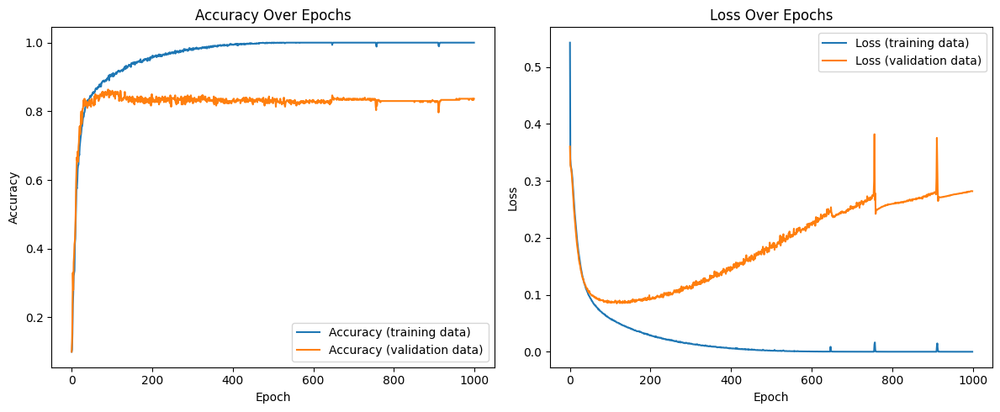

In [28]:
# Plotear las curvas de entrenamiento
plt.figure(figsize=(12, 5))

# Plotear la precisión del entrenamiento
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Accuracy (training data)')
plt.plot(history.history['val_accuracy'], label='Accuracy (validation data)')
plt.title('Accuracy Over Epochs')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend()

# Plotear la pérdida del entrenamiento
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Loss (training data)')
plt.plot(history.history['val_loss'], label='Loss (validation data)')
plt.title('Loss Over Epochs')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend()

plt.tight_layout()
plt.show()

In [29]:
import numpy as np

# Mejor precisión en el conjunto de entrenamiento
best_train_accuracy = max(history.history['accuracy'])

# Mejor precisión en el conjunto de validación
best_val_accuracy = max(history.history['val_accuracy'])

# Época en la que se obtuvo la mejor precisión en el conjunto de validación
best_epoch_val_accuracy = np.argmax(history.history['val_accuracy']) + 1

print("Mejor precisión en entrenamiento:", best_train_accuracy)
print("Mejor precisión en validación:", best_val_accuracy)
print("Época de la mejor precisión en validación:", best_epoch_val_accuracy)

Mejor precisión en entrenamiento: 1.0
Mejor precisión en validación: 0.8633333444595337
Época de la mejor precisión en validación: 91


##### 2.1.1.4) Logistice Regresion

In [30]:
from sklearn.linear_model import LogisticRegression

# Assuming X_train is of shape (1200, 468)
X_train_reshaped = X_train.reshape(1200, 13, 36).transpose(0, 2, 1).reshape(-1, 13)
# Similarly reshape X_test if necessary
X_test_reshaped = X_test.reshape(300, 13, 36).transpose(0, 2, 1).reshape(-1, 13)

# Assuming y_train is of shape (1200, 10)
y_train_repeated = np.repeat(y_train, 36, axis=0)
# Similarly expand y_test if necessary
y_test_repeated = np.repeat(y_test, 36, axis=0)

# Initialize the logistic regression model
log_reg = LogisticRegression(max_iter=1000, multi_class='multinomial', solver='lbfgs')

# Fit the model to the reshaped training data and expanded labels
log_reg.fit(X_train_reshaped, y_train_repeated.argmax(axis=1))

# You can now predict on the test set and evaluate the model
y_pred_test = log_reg.predict(X_test_reshaped)
# Evaluate the model (example using accuracy)
from sklearn.metrics import accuracy_score
test_accuracy = accuracy_score(y_test_repeated.argmax(axis=1), y_pred_test)

# Output the test accuracy
print(f"Test Accuracy: {test_accuracy * 100:.2f}%")

# Predict on the reshaped training data
y_pred_train = log_reg.predict(X_train_reshaped)

# Calculate the accuracy on the training set
# y_train_repeated.argmax(axis=1) converts the one-hot encoded labels back to class labels
train_accuracy = accuracy_score(y_train_repeated.argmax(axis=1), y_pred_train)

# Output the training accuracy
print(f"Training Accuracy: {train_accuracy * 100:.2f}%")



Test Accuracy: 15.29%
Training Accuracy: 14.80%


##### 2.1.1.5) Dimentionaliry reduction visualization

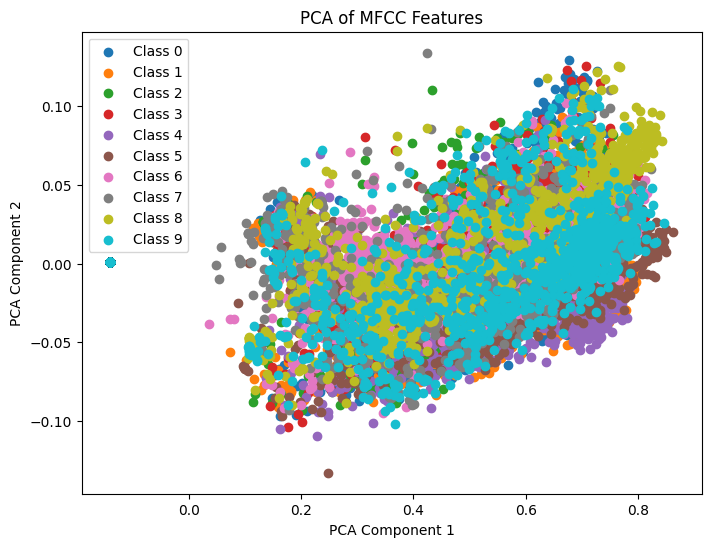

Explained variance ratio: [0.99115765 0.00381311]


In [31]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_train_reshaped)

plt.figure(figsize=(8, 6))
for i in range(10):  # Assuming 10 classes
    plt.scatter(X_pca[y_train_repeated.argmax(axis=1) == i, 0], X_pca[y_train_repeated.argmax(axis=1) == i, 1], label=f'Class {i}')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.title('PCA of MFCC Features')
plt.legend()
plt.show()
# Print the explained variance ratio for the first few components
print("Explained variance ratio:", pca.explained_variance_ratio_[:10])

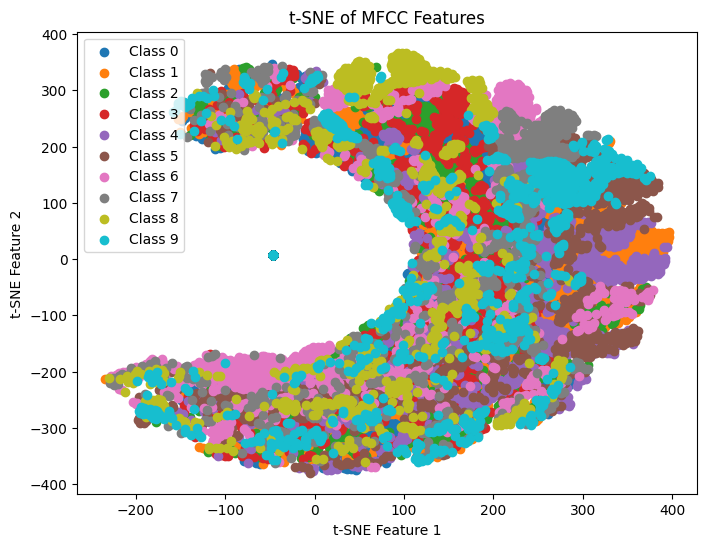

In [32]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(X_train_reshaped)  # t-SNE on a subset for performance

plt.figure(figsize=(8, 6))
for i in range(10):  # Assuming 10 classes
    plt.scatter(X_tsne[y_train_repeated.argmax(axis=1) == i, 0], X_tsne[y_train_repeated.argmax(axis=1) == i, 1], label=f'Class {i}')
plt.xlabel('t-SNE Feature 1')
plt.ylabel('t-SNE Feature 2')
plt.title('t-SNE of MFCC Features')
plt.legend()
plt.show()


##### Without Padding

##### 2.1.1.6) Linear Clasifier Readout

In [33]:
# Iterar sobre los MFCCs para encontrar los valores máximos y mínimos
for mfcc in mfcc_features:
    print(mfcc.shape)  # Imprimir la forma de cada MFCC


print(len(mfcc_features))  

print(mfcc_features)

(13, 19)
(13, 11)
(13, 12)
(13, 10)
(13, 12)
(13, 9)
(13, 9)
(13, 10)
(13, 10)
(13, 8)
(13, 9)
(13, 10)
(13, 7)
(13, 8)
(13, 8)
(13, 8)
(13, 8)
(13, 8)
(13, 8)
(13, 7)
(13, 9)
(13, 8)
(13, 8)
(13, 6)
(13, 7)
(13, 7)
(13, 8)
(13, 8)
(13, 9)
(13, 8)
(13, 11)
(13, 12)
(13, 12)
(13, 9)
(13, 7)
(13, 6)
(13, 8)
(13, 9)
(13, 8)
(13, 7)
(13, 6)
(13, 7)
(13, 7)
(13, 5)
(13, 8)
(13, 7)
(13, 8)
(13, 8)
(13, 7)
(13, 5)
(13, 6)
(13, 6)
(13, 6)
(13, 6)
(13, 5)
(13, 5)
(13, 6)
(13, 5)
(13, 5)
(13, 6)
(13, 16)
(13, 16)
(13, 19)
(13, 9)
(13, 10)
(13, 7)
(13, 7)
(13, 5)
(13, 9)
(13, 8)
(13, 7)
(13, 8)
(13, 8)
(13, 6)
(13, 7)
(13, 9)
(13, 10)
(13, 6)
(13, 9)
(13, 6)
(13, 7)
(13, 7)
(13, 7)
(13, 7)
(13, 6)
(13, 5)
(13, 7)
(13, 9)
(13, 7)
(13, 5)
(13, 20)
(13, 21)
(13, 15)
(13, 12)
(13, 11)
(13, 11)
(13, 11)
(13, 10)
(13, 11)
(13, 11)
(13, 10)
(13, 11)
(13, 8)
(13, 8)
(13, 12)
(13, 8)
(13, 9)
(13, 9)
(13, 8)
(13, 11)
(13, 9)
(13, 9)
(13, 8)
(13, 8)
(13, 9)
(13, 10)
(13, 9)
(13, 8)
(13, 6)
(13, 8)
(13, 18)


In [34]:
# Normalización
import numpy as np

# Inicializar el valor máximo
max_val = float('-inf')

# Encontrar el valor máximo absoluto en todo el conjunto de datos
for mfcc in mfcc_features:
    max_val = max(max_val, np.max(np.abs(mfcc)))

# Normalizar cada MFCC dividiéndolo por el valor máximo
mfcc_features_normalized = [mfcc / max_val for mfcc in mfcc_features]

# Ahora mfcc_features_normalized contiene cada MFCC normalizado


etiquetas = [elemento[1] for elemento in sub_dataset_selected]

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
etiquetas_encoded = label_encoder.fit_transform(etiquetas)


from tensorflow.keras.utils import to_categorical

etiquetas_one_hot = to_categorical(etiquetas_encoded)

In [35]:
from sklearn.model_selection import train_test_split
from collections import defaultdict

# Suponiendo que 'sub_dataset_selected' es tu lista de tuplas, y cada tupla tiene la forma (audio, label, speaker)

# Crear un diccionario para agrupar los datos por hablante y etiqueta
grouped_data = defaultdict(list)
for i, (audio, label, speaker) in enumerate(sub_dataset_selected):
    grouped_data[(speaker, label)].append(i)

# Inicializar listas para los índices de entrenamiento y prueba
train_indices = []
test_indices = []

# Dividir los datos estratificando por combinación de hablante y etiqueta
for (speaker, label), indices in grouped_data.items():
    # Solo dividir si hay suficientes datos para estratificar
    if len(indices) > 1:
        # Extraer los subconjuntos de datos correspondientes a los índices actuales
        sub_dataset = [sub_dataset_selected[i] for i in indices]
        sub_labels = [label for i in indices]
        # Dividir el subconjunto de datos
        indices_train, indices_test = train_test_split(
            indices, test_size=0.2, random_state=42, shuffle=True, stratify=sub_labels
        )
        # Agregar los índices de entrenamiento y prueba a las listas globales
        train_indices.extend(indices_train)
        test_indices.extend(indices_test)

# Usar los índices para crear los conjuntos de entrenamiento y prueba finales
train_dataset = [sub_dataset_selected[i] for i in train_indices]
test_dataset = [sub_dataset_selected[i] for i in test_indices]

# Verificar el balance de los conjuntos
# Esto es solo para demostración, ya que no tenemos un dataset real para mostrar
print(f"Train set size: {len(train_dataset)}, Test set size: {len(test_dataset)}")

Train set size: 1200, Test set size: 300


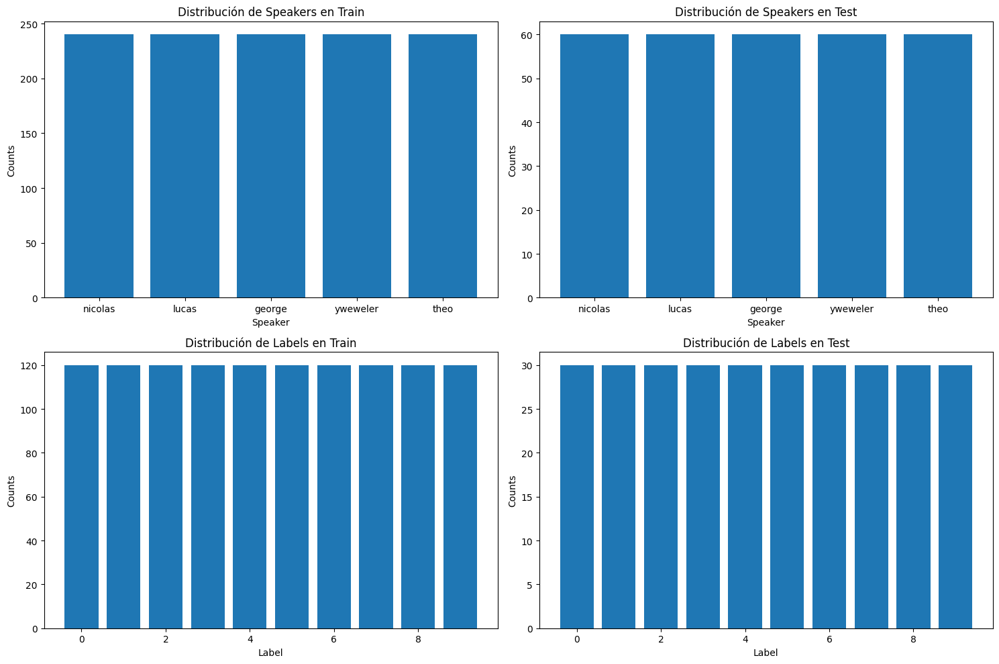

In [36]:
from collections import Counter




import matplotlib.pyplot as plt

# Suponiendo que 'train_dataset' y 'test_dataset' son las listas de tuplas que contienen los datos de entrenamiento y prueba
# y cada tupla es de la forma (audio, label, speaker)

# Extraer la información de hablante y etiqueta para los conjuntos de entrenamiento y prueba
train_speakers = [data[2] for data in train_dataset]
test_speakers = [data[2] for data in test_dataset]
train_labels = [data[1] for data in train_dataset]
test_labels = [data[1] for data in test_dataset]

# Contar las ocurrencias de cada hablante y etiqueta
train_speaker_counts = Counter(train_speakers)
test_speaker_counts = Counter(test_speakers)
train_label_counts = Counter(train_labels)
test_label_counts = Counter(test_labels)

# Crear las figuras para los histogramas
fig, axs = plt.subplots(2, 2, figsize=(15, 10))

# Histograma de la distribución de hablantes en el conjunto de entrenamiento
axs[0, 0].bar(train_speaker_counts.keys(), train_speaker_counts.values())
axs[0, 0].set_title('Distribución de Speakers en Train')
axs[0, 0].set_xlabel('Speaker')
axs[0, 0].set_ylabel('Counts')

# Histograma de la distribución de hablantes en el conjunto de prueba
axs[0, 1].bar(test_speaker_counts.keys(), test_speaker_counts.values())
axs[0, 1].set_title('Distribución de Speakers en Test')
axs[0, 1].set_xlabel('Speaker')
axs[0, 1].set_ylabel('Counts')

# Histograma de la distribución de etiquetas en el conjunto de entrenamiento
axs[1, 0].bar(train_label_counts.keys(), train_label_counts.values())
axs[1, 0].set_title('Distribución de Labels en Train')
axs[1, 0].set_xlabel('Label')
axs[1, 0].set_ylabel('Counts')

# Histograma de la distribución de etiquetas en el conjunto de prueba
axs[1, 1].bar(test_label_counts.keys(), test_label_counts.values())
axs[1, 1].set_title('Distribución de Labels en Test')
axs[1, 1].set_xlabel('Label')
axs[1, 1].set_ylabel('Counts')

# Ajustar el layout para evitar la superposición de títulos
plt.tight_layout()

# Mostrar los gráficos
plt.show()


In [37]:
print(len(mfcc_features_normalized))

print( mfcc_features_normalized[:2])

for data in mfcc_features_normalized:
    print(data.shape)

print(train_indices)    

1500
[array([[ 4.69926178e-01,  5.68829715e-01,  7.88791895e-01,
         8.72348607e-01,  8.88176382e-01,  8.68189037e-01,
         8.13613713e-01,  6.92522109e-01,  4.52621192e-01,
         3.25905412e-01,  3.02803993e-01,  2.98545122e-01,
         2.97244906e-01,  2.97518849e-01,  2.97418416e-01,
         2.98068076e-01,  3.09509039e-01,  3.25163633e-01,
         3.33200455e-01],
       [ 7.29755685e-02,  6.47079274e-02,  4.12679873e-02,
         4.53936756e-02,  7.87684992e-02,  1.09168909e-01,
         1.10453166e-01,  1.27805486e-01,  1.19864874e-01,
         3.16409841e-02,  8.51215608e-03,  3.07409070e-03,
         1.25914952e-03,  1.64595153e-03,  1.49201613e-03,
         2.36771605e-03,  1.80052388e-02,  3.84377167e-02,
         4.80991155e-02],
       [-2.07779631e-02,  5.31297829e-03,  3.06705032e-02,
         1.18506551e-02, -1.92500949e-02, -4.40068468e-02,
        -4.34613377e-02, -3.22481617e-02, -1.65758643e-03,
         1.40546365e-02,  6.92796195e-03,  2.99263955e-03

In [38]:
import numpy as np
import numpy as np

# Aleatorizar el orden de las muestras en los conjuntos de entrenamiento y prueba
train_indices = np.random.permutation(train_indices)
test_indices = np.random.permutation(test_indices)

# Construir X_train y X_test usando list comprehension
X_train_no_padding = [mfcc_features_normalized[i] for i in train_indices]
X_test_no_padding = [mfcc_features_normalized[i] for i in test_indices]

# Suponiendo que etiquetas_one_hot es un array de numpy y contiene las etiquetas correspondientes
y_train_no_padding = etiquetas_one_hot[train_indices]
y_test_no_padding = etiquetas_one_hot[test_indices]

# Verificando los primeros elementos para asegurar la correspondencia correcta
X_train_no_padding[:2], y_train_no_padding[:2], X_test_no_padding[:2], y_test_no_padding[:2]


([array([[ 5.61225355e-01,  6.33935392e-01,  6.46559715e-01,
           6.04506671e-01,  5.08353233e-01],
         [ 7.84706399e-02,  7.56203905e-02,  8.27019513e-02,
           8.11308250e-02,  6.36026636e-02],
         [-8.72683898e-03, -2.97507737e-02, -3.51562947e-02,
          -2.86833160e-02, -2.12168805e-02],
         [ 1.39529034e-02,  7.24367239e-03,  4.99306479e-03,
           1.24538029e-02,  1.45733980e-02],
         [-1.88676512e-03, -1.15479026e-02, -1.41998157e-02,
          -1.21952621e-02, -1.26160309e-02],
         [-1.60988439e-02, -1.46258427e-02, -1.09733064e-02,
          -8.57980270e-03, -4.40846058e-03],
         [-8.08135141e-03, -4.85432101e-03, -4.74932138e-03,
          -3.48187517e-03,  3.96483159e-03],
         [-6.29951851e-03,  6.75165968e-04,  3.83372954e-03,
           3.04325158e-03,  4.94045392e-03],
         [-2.02942751e-02, -1.24324327e-02, -6.55012811e-03,
          -2.36459682e-03,  2.45328364e-03],
         [-1.44115547e-02, -1.43969795e-02, -1

In [39]:
print(X_train[0].shape[1])

IndexError: tuple index out of range

In [41]:
def linear_classifier_readout_variable_length(X_train, y_train, num_features,X_test, y_test):
    """
    Modified linear classifier to handle variable-length sequences.
    
    Args:
    X_train (list of np.array): Training data with variable-length sequences.
    y_train (np.array): Training labels.
    X_test (list of np.array): Test data with variable-length sequences.
    y_test (np.array): Test labels.
    num_labels (int): Number of label categories.
    
    Returns:
    None: Prints out the accuracy and other relevant information.
    """

    def create_S_matrix(mfcc_features, num_features=13):
        """
        Create a matrix S from variable-length MFCC feature sequences.

        Args:
        mfcc_features (list of np.array): List of MFCC feature arrays with variable length.
        num_features (int): Number of features in each MFCC array (default is 13).

        Returns:
        np.array: The resulting S matrix with dimensions [(num_samples * num_intervals), num_features].
        """
        # Flatten each MFCC feature array and concatenate
        transposed_features = [sequence.T for sequence in mfcc_features]
        S = np.vstack(transposed_features)


        return S

    S = create_S_matrix(X_train)


    def create_Y_hat_repeated(y_train, X_train, num_features):
        """
        Create the Y_hat_repeated matrix for variable-length sequences.

        Args:
        y_train (np.array): Training labels.
        X_train (list of np.array): Training data with variable-length sequences.
        num_features (int): Number of features in each MFCC array (default is 13).

        Returns:
        np.array: The resulting Y_hat_repeated matrix.
        """
        # Contar los intervalos en cada secuencia de X_train
        intervals_per_sample = [sequence.shape[1] for sequence in X_train]

        # Replicar cada etiqueta en y_train basado en el número de intervalos de su secuencia correspondiente
        Y_hat_repeated = np.repeat(y_train, intervals_per_sample, axis=0)

        return Y_hat_repeated

    Y_hat_repeated = create_Y_hat_repeated(y_train, X_train, num_features)

    # Calculamos la pseudoinversa 

    S_moore = np.linalg.pinv(S)

    Weights = Y_hat_repeated.T @ S_moore.T

    # Imprimir los resultados
    print('Shapes:')
    print("Forma de la matriz S:", S.shape)
    print("Y_hat_repeated shape:", Y_hat_repeated.shape)
    print("Pseudo inverse shape :",S_moore.shape)
    print('Weights matrix shape', Weights.shape)
    print('Weigths:',Weights)
 
# Aplicamos los pesos al conjunto de prueba
    
    def apply_weights_and_predict(data_set, Weights, num_features):
        """
        Apply the weight matrix to each sequence in the test set and predict classes.

        Args:
        data_set (list of np.array): Test data with variable-length sequences.
        Weights (np.array): The weight matrix from the trained model.
        num_features (int): Number of features in each MFCC array (default is 13).

        Returns:
        np.array: Predicted classes for each test sample.
        """
        # Initialize an empty list to store averaged results for each test sample
        averaged_results = []

        # Apply weights to each test sequence and compute the average result
        for sequence in data_set:

            # Apply weights to the sequence
            interval_results = sequence.T @ Weights.T
      
            # Average the results over all intervals for the test sample
            averaged_results.append(np.mean(interval_results, axis=0))

        # Convert the list of averages to a NumPy array
        averaged_results = np.array(averaged_results)

        # Predict the class for each test sample
        y_test_pred = np.argmax(averaged_results, axis=1)

        return y_test_pred , averaged_results
    
    
    y_test_pred , y_test_promedio = apply_weights_and_predict(X_test, Weights, num_features)

    y_train_pred , y_train_promedio = apply_weights_and_predict(X_train,Weights,num_features)

    # Convertimos las etiquetas verdaderas one-hot en índices de clase
    y_test_true_indices = np.argmax(y_test, axis=1)
    y_train_true_indices = np.argmax(y_train,axis=1)

    
    # Calculamos la precisión
    accuracy_test = accuracy_score(y_test_true_indices, y_test_pred)
    accuracy_train = accuracy_score(y_train_true_indices,y_train_pred)

    print('Shapes for Test Set :')
    print("Mean Results shape:", y_test_promedio.shape)
    print('Predicted Test Labels:')
    print(y_test_pred)
    print(f'Accuracy en el conjunto de prueba: {accuracy_test*100:.2f} %')

    print('Shapes for train Set :')
    print("Mean Results shape:", y_train_promedio.shape)
    print('Predicted train Labels:')
    print(y_train_pred)
    print(f'Accuracy en el conjunto de entrenamiento: {accuracy_train*100:.2f} %')

    return y_test_pred, y_test_true_indices



In [42]:
num_samples_test = 300
num_samples_train = 1200
num_labels = 10
num_features = 13

y_test_pred, y_test_true_indices = linear_classifier_readout_variable_length(X_train_no_padding, y_train_no_padding, num_features=num_features , X_test=X_test_no_padding, y_test=y_test_no_padding)

Shapes:
Forma de la matriz S: (9298, 13)
Y_hat_repeated shape: (9298, 10)
Pseudo inverse shape : (13, 9298)
Weights matrix shape (10, 13)
Weigths: [[ 1.53518647e-01  3.11886340e-01 -1.88684726e+00  2.55270767e+00
   3.51638508e+00  1.65647224e-01 -2.60800195e+00 -3.49714208e+00
  -1.94737720e+00  4.78403854e+00 -3.13394487e-01  1.00211608e+00
   6.22868395e+00]
 [ 1.32867828e-01  5.24830818e-01 -4.78230268e-01 -1.43256259e+00
   2.31065798e+00  3.07598853e+00 -1.47133994e+00  1.21240854e+00
  -2.03583568e-01  2.68158317e+00 -4.03315496e+00 -2.70214319e+00
  -5.66430664e+00]
 [ 1.51403323e-01 -5.58299348e-02  6.80639781e-03  1.55964422e+00
   3.23387480e+00  1.76461220e+00 -2.27235690e-01 -2.63107491e+00
  -5.94773865e+00 -3.72918868e+00 -2.46700495e-01  1.00999379e+00
  -6.18061543e-01]
 [ 7.43887499e-02  5.48796237e-01 -2.70927638e-01  3.60848927e+00
   4.37538207e-01  6.02798581e-01  7.01057374e-01 -1.31696916e+00
  -2.76570535e+00 -3.25389713e-01 -1.50646210e+00  4.28196526e+00
   4

##### 2.1.1.7) Non Linear Clasifier Readout : MLP

In [43]:


def create_S_matrix(mfcc_features, num_features=13):
        """
        Create a matrix S from variable-length MFCC feature sequences.

        Args:
        mfcc_features (list of np.array): List of MFCC feature arrays with variable length.
        num_features (int): Number of features in each MFCC array (default is 13).

        Returns:
        np.array: The resulting S matrix with dimensions [(num_samples * num_intervals), num_features].
        """
        # Flatten each MFCC feature array and concatenate
        transposed_features = [sequence.T for sequence in mfcc_features]
        S = np.vstack(transposed_features)


        return S


def create_Y_hat_repeated(y_train, X_train, num_features):
        """
        Create the Y_hat_repeated matrix for variable-length sequences.

        Args:
        y_train (np.array): Training labels.
        X_train (list of np.array): Training data with variable-length sequences.
        num_features (int): Number of features in each MFCC array (default is 13).

        Returns:
        np.array: The resulting Y_hat_repeated matrix.
        """
        # Contar los intervalos en cada secuencia de X_train
        intervals_per_sample = [sequence.shape[1] for sequence in X_train]

        # Replicar cada etiqueta en y_train basado en el número de intervalos de su secuencia correspondiente
        Y_hat_repeated = np.repeat(y_train, intervals_per_sample, axis=0)

        return Y_hat_repeated

In [44]:
X_train_no_padding_mlp = create_S_matrix(X_train_no_padding,13)
X_test_no_padding_mlp = create_S_matrix(X_test_no_padding,13)

y_train_no_padding_mlp = create_Y_hat_repeated(y_train_no_padding, X_train_no_padding, num_features=13)

y_test_no_padding_mlp = create_Y_hat_repeated(y_test_no_padding, X_test_no_padding, num_features=13)






print('Xtrain shape',X_train_no_padding_mlp.shape)
print('Xtest shape',X_test_no_padding_mlp.shape)

print('ytrain shape',y_train_no_padding_mlp.shape)
print('ytest shape',y_test_no_padding_mlp.shape)

Xtrain shape (9298, 13)
Xtest shape (2254, 13)
ytrain shape (9298, 10)
ytest shape (2254, 10)


In [45]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam

# Asegúrate de que los datos estén en el formato correcto
# X_train, y_train, X_test, y_test deben ser arrays de numpy o listas convertibles a arrays de numpy

# Definir la arquitectura del modelo
model_noPadding = Sequential([
    Dense(256, activation='relu', input_shape=(X_train_no_padding_mlp.shape[1],)),
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),
    
    Dense(y_train.shape[1], activation='sigmoid')  # Usar 'sigmoid' para clasificación multilabel
])

# Compilar el modelo
model_noPadding.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])

# Entrenar el modelo
history_noPadding = model_noPadding.fit(X_train_no_padding_mlp, y_train_no_padding_mlp, epochs=1000, batch_size=32, validation_data=(X_test_no_padding_mlp, y_test_no_padding_mlp))



Epoch 1/1000
291/291 [==============================] - 1s 2ms/step - loss: 0.3528 - accuracy: 0.1070 - val_loss: 0.3237 - val_accuracy: 0.1047
Epoch 2/1000
291/291 [==============================] - 0s 2ms/step - loss: 0.3159 - accuracy: 0.1643 - val_loss: 0.3010 - val_accuracy: 0.2227
Epoch 3/1000
291/291 [==============================] - 0s 1ms/step - loss: 0.2973 - accuracy: 0.2275 - val_loss: 0.2839 - val_accuracy: 0.2569
Epoch 4/1000
291/291 [==============================] - 0s 2ms/step - loss: 0.2845 - accuracy: 0.2605 - val_loss: 0.2763 - val_accuracy: 0.3030
Epoch 5/1000
291/291 [==============================] - 0s 1ms/step - loss: 0.2781 - accuracy: 0.3025 - val_loss: 0.2705 - val_accuracy: 0.3217
Epoch 6/1000
291/291 [==============================] - 0s 2ms/step - loss: 0.2718 - accuracy: 0.3192 - val_loss: 0.2656 - val_accuracy: 0.3154
Epoch 7/1000
291/291 [==============================] - 0s 1ms/step - loss: 0.2650 - accuracy: 0.3392 - val_loss: 0.2550 - val_accuracy:

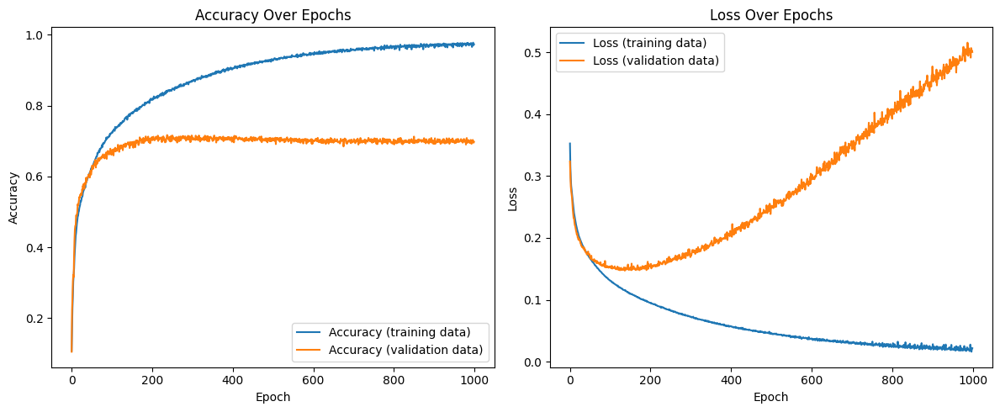

In [46]:
# Plotear las curvas de entrenamiento
plt.figure(figsize=(12, 5))

# Plotear la precisión del entrenamiento
plt.subplot(1, 2, 1)
plt.plot(history_noPadding.history['accuracy'], label='Accuracy (training data)')
plt.plot(history_noPadding.history['val_accuracy'], label='Accuracy (validation data)')
plt.title('Accuracy Over Epochs')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend()

# Plotear la pérdida del entrenamiento
plt.subplot(1, 2, 2)
plt.plot(history_noPadding.history['loss'], label='Loss (training data)')
plt.plot(history_noPadding.history['val_loss'], label='Loss (validation data)')
plt.title('Loss Over Epochs')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend()

plt.tight_layout()
plt.show()

In [47]:
import numpy as np

# Mejor precisión en el conjunto de entrenamiento
best_train_accuracy = max(history_noPadding.history['accuracy'])

# Mejor precisión en el conjunto de validación
best_val_accuracy = max(history_noPadding.history['val_accuracy'])

# Época en la que se obtuvo la mejor precisión en el conjunto de validación
best_epoch_val_accuracy = np.argmax(history_noPadding.history['val_accuracy']) + 1

print("Mejor precisión en entrenamiento:", best_train_accuracy)
print("Mejor precisión en validación:", best_val_accuracy)
print("Época de la mejor precisión en validación:", best_epoch_val_accuracy)

Mejor precisión en entrenamiento: 0.9778447151184082
Mejor precisión en validación: 0.7169476747512817
Época de la mejor precisión en validación: 238


In [48]:


test_results = []

for sequence in X_test_no_padding:
    print(sequence.T.shape)
    logits = model_noPadding.predict(sequence.T)
    average_logits = np.mean(logits, axis=0)
    predicted_class = np.argmax(average_logits, axis=0)
    print(predicted_class)
    test_results.append(predicted_class)

(12, 13)
1/1 [==============================] - 0s 88ms/step
6
(7, 13)
1/1 [==============================] - 0s 21ms/step
2
(8, 13)
1/1 [==============================] - 0s 20ms/step
5
(8, 13)
1/1 [==============================] - 0s 18ms/step
9
(7, 13)
1/1 [==============================] - 0s 18ms/step
4
(5, 13)
1/1 [==============================] - 0s 19ms/step
1
(9, 13)
1/1 [==============================] - 0s 20ms/step
2
(6, 13)
1/1 [==============================] - 0s 19ms/step
1
(8, 13)
1/1 [==============================] - 0s 20ms/step
6
(9, 13)
1/1 [==============================] - 0s 19ms/step
0
(7, 13)
1/1 [==============================] - 0s 19ms/step
0
(6, 13)
1/1 [==============================] - 0s 19ms/step
5
(13, 13)
1/1 [==============================] - 0s 19ms/step
6
(9, 13)
1/1 [==============================] - 0s 19ms/step
1
(9, 13)
1/1 [==============================] - 0s 19ms/step
2
(5, 13)
1/1 [==============================] - 0s 20ms/step
3
(7, 13

In [49]:
test_targets = []
for sequence in y_test_no_padding:
    
    prediction = np.argmax(sequence, axis=0)
    
    test_targets.append(prediction)
    # Calculamos la precisión
accuracy_test = accuracy_score(test_targets, test_results)

print(test_results[:50])
print(test_targets)
print(f'Accuracy en el conjunto de prueba: {accuracy_test*100:.2f} %')

[6, 2, 5, 9, 4, 1, 2, 1, 6, 0, 0, 5, 6, 1, 2, 3, 8, 3, 3, 8, 2, 6, 3, 1, 3, 7, 5, 3, 4, 9, 3, 9, 8, 0, 6, 2, 0, 1, 1, 6, 4, 9, 1, 5, 6, 5, 3, 7, 3, 9]
[6, 2, 5, 9, 4, 1, 2, 0, 5, 0, 0, 5, 6, 1, 2, 3, 8, 4, 3, 8, 2, 6, 3, 1, 3, 7, 5, 3, 4, 9, 2, 9, 8, 0, 6, 2, 0, 1, 1, 6, 4, 9, 1, 5, 6, 5, 3, 7, 2, 9, 9, 5, 9, 4, 9, 3, 5, 1, 0, 6, 7, 4, 3, 0, 5, 3, 8, 2, 2, 6, 5, 4, 7, 0, 9, 1, 5, 3, 0, 7, 1, 7, 7, 8, 7, 7, 8, 3, 7, 4, 5, 7, 8, 6, 8, 9, 8, 0, 9, 9, 4, 1, 2, 7, 5, 6, 9, 7, 1, 4, 6, 0, 9, 7, 8, 3, 0, 1, 9, 6, 0, 6, 2, 2, 9, 9, 8, 6, 7, 8, 7, 5, 8, 7, 8, 3, 1, 8, 9, 5, 1, 2, 6, 3, 2, 7, 5, 5, 3, 0, 4, 3, 7, 6, 9, 5, 2, 6, 9, 5, 9, 8, 6, 8, 4, 4, 5, 5, 7, 6, 4, 3, 3, 1, 0, 2, 4, 0, 4, 3, 1, 9, 0, 7, 1, 4, 0, 7, 4, 0, 3, 3, 2, 1, 4, 2, 5, 7, 1, 9, 5, 3, 2, 6, 5, 8, 4, 0, 2, 5, 9, 0, 8, 4, 2, 6, 0, 2, 3, 6, 9, 8, 0, 0, 0, 2, 5, 8, 9, 5, 1, 6, 7, 3, 8, 5, 8, 6, 2, 7, 8, 2, 4, 7, 7, 4, 4, 8, 2, 1, 2, 9, 3, 2, 5, 6, 3, 0, 1, 1, 1, 4, 3, 3, 9, 0, 8, 1, 9, 4, 4, 8, 6, 3, 6, 2, 8, 1, 8, 8, 7, 1, 1,

##### 2.1.1.9) Dimentionaliry reduction visualization

In [50]:
print(y_train_no_padding_mlp[:30])

for data in X_train_no_padding:
    print(data.shape[1])

[[0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]]
5
8
6
6
9

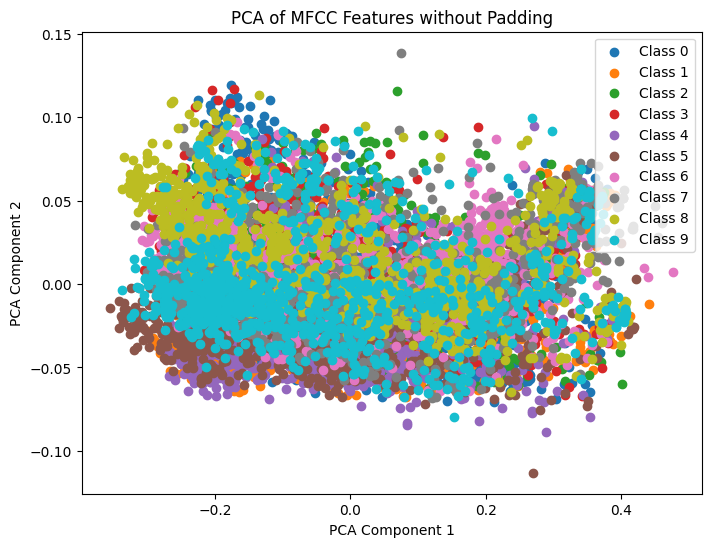

Explained variance ratio: [0.91955215 0.03313526]


In [51]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_train_no_padding_mlp)

plt.figure(figsize=(8, 6))
for i in range(10):  # Assuming 10 classes
    plt.scatter(X_pca[y_train_no_padding_mlp.argmax(axis=1) == i, 0], X_pca[y_train_no_padding_mlp.argmax(axis=1) == i, 1], label=f'Class {i}')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.title('PCA of MFCC Features without Padding')
plt.legend()
plt.show()
# Print the explained variance ratio for the first few components
print("Explained variance ratio:", pca.explained_variance_ratio_[:10])

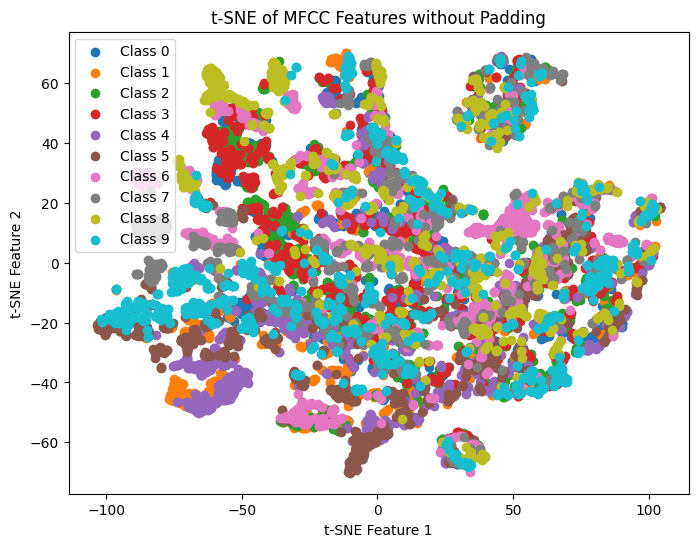

In [52]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(X_train_no_padding_mlp)  # t-SNE on a subset for performance

plt.figure(figsize=(8, 6))
for i in range(10):  # Assuming 10 classes
    plt.scatter(X_tsne[y_train_no_padding_mlp.argmax(axis=1) == i, 0], X_tsne[y_train_no_padding_mlp.argmax(axis=1) == i, 1], label=f'Class {i}')
plt.xlabel('t-SNE Feature 1')
plt.ylabel('t-SNE Feature 2')
plt.title('t-SNE of MFCC Features without Padding')
plt.legend()
plt.show()

### 2.2) Reservoir Layer

#### 2.2.1) Reservoir Dynamics Analysis

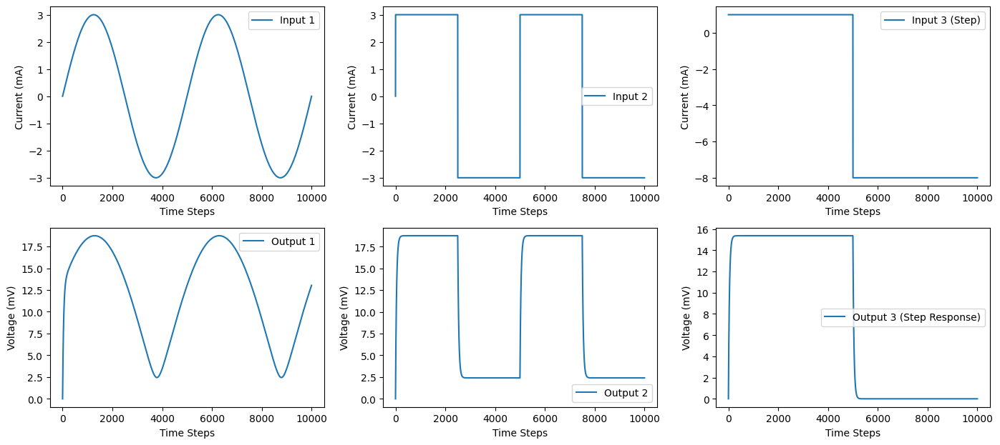

In [1]:
import numpy as np
import matplotlib.pyplot as plt

# Reestableciendo los parámetros y la función del oscilador
T_relax = 200e-9  # tiempo de relajación (s)
Delta_t = 5e-9  # intervalo de tiempo (s)
I_DC = 8e-3       # corriente continua (A)
I_c = 4.9e-3      # corriente umbral (A)
c = 0.24          # constante

def oscillator_output(I_in, v_osc_previous):

    # Definir la función para calcular v_infinity según la ecuación completa

    # Comprobar que el argumento de la raíz cuadrada sea positivo
    if  I_DC + I_in < I_c:
        argument = 0
    else : 
        argument = I_DC + I_in- I_c
    
    v_infinity = c * np.sqrt(argument)
    v_osc = v_infinity * (1 - np.exp(-Delta_t/T_relax)) + v_osc_previous * np.exp(-Delta_t/T_relax)
    return v_osc

time_steps = 10000  # número de pasos de tiempo para la simulación

# Señales de entrada entre -3 y 3 mA
input_signal_1 = 3e-3 * np.sin(np.linspace(0, 4 * np.pi, time_steps))  # señal sinusoidal
input_signal_2 = 3e-3 * np.sign(np.sin(np.linspace(0, 4 * np.pi, time_steps)))  # señal cuadrada
input_signals = [input_signal_1, input_signal_2]

oscillator_outputs = []

for input_signal in input_signals:
    v_osc = np.zeros(time_steps)
    for i in range(1, time_steps):
        v_osc[i] = oscillator_output(input_signal[i], v_osc[i-1])
    oscillator_outputs.append(v_osc)

# Convertir la corriente de Amperios a miliamperios (mA)
input_signal_1_mA = input_signal_1 * 1e3  # Convertir a mA
input_signal_2_mA = input_signal_2 * 1e3  # Convertir a mA

# Graficar con las unidades ajustadas
# Convertir las salidas del oscilador de voltios a milivoltios (mV)
oscillator_outputs_mV = [output * 1e3 for output in oscillator_outputs]  # Convertir a mV

# Definir una tercera señal constante que se apaga a 0 después de un punto en el tiempo
# La señal será constante a 3 mA durante la primera mitad del tiempo y luego caerá a 0 mA

# Generar la señal constante con un 'apagado' a la mitad del tiempo de simulación
half_time_steps = time_steps // 2
input_signal_3 = np.concatenate((np.full(half_time_steps, 1e-3),np.full(half_time_steps, -8e-3) ))

# Añadir la nueva señal al conjunto de señales
input_signals.append(input_signal_3)

# Calcular la salida del oscilador para la nueva señal
v_osc = np.zeros(time_steps)
for i in range(1, time_steps):
    v_osc[i] = oscillator_output(input_signals[2][i], v_osc[i-1])

oscillator_outputs.append(v_osc)

# Convertir la nueva señal de entrada y salida a miliamperios y milivoltios respectivamente
input_signal_3_mA = input_signal_3 * 1e3  # Convertir a mA
oscillator_output_3_mV = v_osc * 1e3  # Convertir a mV

# Graficar todas las señales de entrada y salidas del oscilador
plt.figure(figsize=(14, 9))

# Graficar las primeras dos señales como antes
for i, input_signal_mA in enumerate([input_signal_1_mA, input_signal_2_mA]):
    plt.subplot(3, len(input_signals), i+1)
    plt.plot(input_signal_mA, label=f'Input {i+1}')
    plt.xlabel('Time Steps')
    plt.ylabel('Current (mA)')
    plt.legend()
    plt.subplot(3, len(input_signals), len(input_signals) + i+1)
    plt.plot(oscillator_outputs_mV[i], label=f'Output {i+1}')
    plt.xlabel('Time Steps')
    plt.ylabel('Voltage (mV)')
    plt.legend()

# Graficar la tercera señal
plt.subplot(3, len(input_signals), len(input_signals))
plt.plot(input_signal_3_mA, label='Input 3 (Step)')
plt.xlabel('Time Steps')
plt.ylabel('Current (mA)')
plt.legend()
plt.subplot(3, len(input_signals), 2*len(input_signals))
plt.plot(oscillator_output_3_mV, label='Output 3 (Step Response)')
plt.xlabel('Time Steps')
plt.ylabel('Voltage (mV)')
plt.legend()

plt.tight_layout()
plt.show()



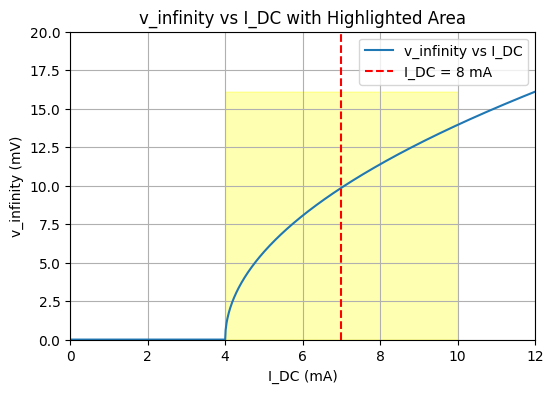

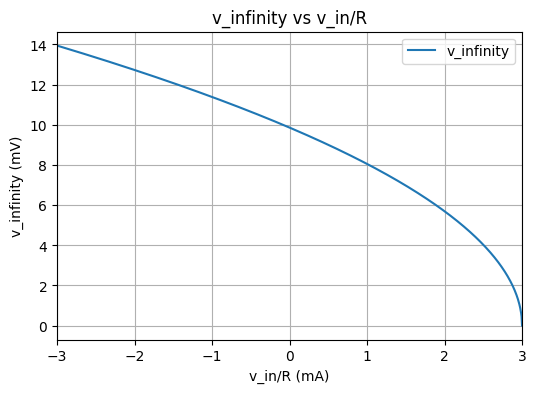

: 

In [24]:
# Definir la función para calcular v_infinity según la ecuación completa
def v_infinity_complete(c, I_DC, v_in_R, I_c):
    # Comprobar que el argumento de la raíz cuadrada sea positivo
    if  I_DC -  v_in_R < I_c:
        argument = 0
    else : 
        argument = I_DC - v_in_R - I_c
    return c * np.sqrt(argument)

# Definir los parámetros dados
c = 0.18  # Constante
I_c = 4e-3  # Corriente umbral (A)
I_DC = 7e-3  # Suponer un I_DC constante para la gráfica


# Crear un rango de valores para v_in/R (tratado como x)
v_in_R_range = np.linspace(-3e-3, 3e-3, 1000)  # De -3 a 3 mA

# Calcular v_infinity para cada valor de v_in/R
v_infinity_values_complete = [v_infinity_complete(c, I_DC, x, I_c) for x in v_in_R_range]


# Convertir v_infinity de voltios a milivoltios (mV)
v_infinity_values_complete_mV = np.array(v_infinity_values_complete) * 1e3  # Convertir a mV

# Convertir v_in/R de amperios a miliamperios (mA) para el gráfico
v_in_R_range_mA = v_in_R_range * 1e3  # Convertir a mA



# Definir la función para calcular v_infinity según la ecuación completa
def v_infinity_vs_I_DC( I_DC, I_c):
    # Comprobar que el argumento de la raíz cuadrada sea positivo
    if  I_DC  < I_c:
        argument = 0
    else : 
        argument = I_DC - I_c
    return c * np.sqrt(argument)
# Crear un rango de valores para I_DC
I_DC_range = np.linspace(0, 12e-3, 1000)  # De 0 a 10 mA

# Calcular v_infinity para cada valor de I_DC
v_infinity_values_vs_I_DC = [v_infinity_vs_I_DC(x, I_c) for x in I_DC_range]

# Convertir v_infinity de voltios a milivoltios (mV) para el gráfico
v_infinity_values_vs_I_DC_mV = np.array(v_infinity_values_vs_I_DC) * 1e3  # Convertir a mV

# Convertir I_DC de amperios a miliamperios (mA) para el gráfico
I_DC_range_mA = I_DC_range * 1e3  # Convertir a mA

# Graficar v_infinity en función de I_DC con la línea recta y el área coloreada
plt.figure(figsize=(6, 4))

# Gráfica original de v_infinity vs I_DC
plt.plot(I_DC_range_mA, v_infinity_values_vs_I_DC_mV, label='v_infinity vs I_DC')

# Añadir una línea recta en I_DC = 8 mA
plt.axvline(x=7, color='red', linestyle='--', label='I_DC = 8 mA')

# Colorear el área entre 5 mA y 11 mA de I_DC
plt.fill_betweenx(v_infinity_values_vs_I_DC_mV, 4, 10, color='yellow', alpha=0.3)

# Configuración del gráfico
plt.xlabel('I_DC (mA)')
plt.ylabel('v_infinity (mV)')
plt.title('v_infinity vs I_DC with Highlighted Area')
plt.legend()
plt.ylim(0,20)
plt.xlim(0,12)
plt.grid(True)
plt.show()


# Graficar v_infinity en función de v_in/R
plt.figure(figsize=(6, 4))
plt.plot(v_in_R_range_mA, v_infinity_values_complete_mV, label='v_infinity')
plt.xlabel('v_in/R (mA)')
plt.ylabel('v_infinity (mV)')
plt.title('v_infinity vs v_in/R')
plt.legend()
plt.grid(True)
plt.xlim(-3,3)

plt.show()




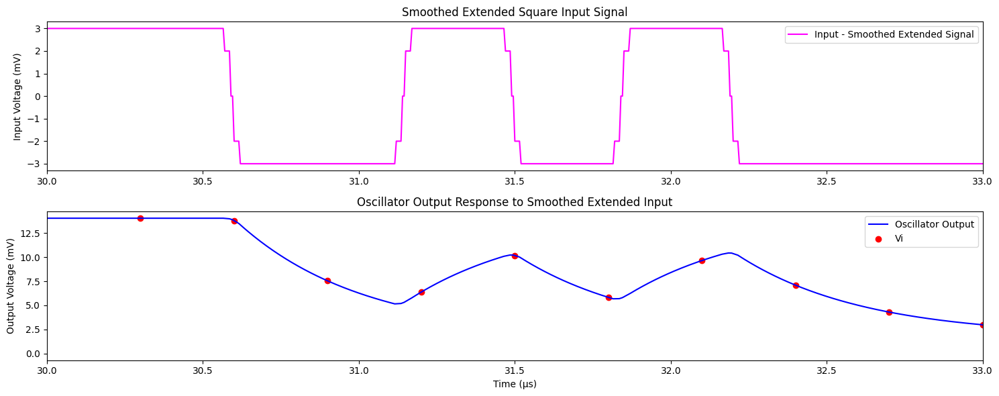

In [3]:

import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter1d

# Parámetros proporcionados en el código del usuario
T_relax = 400e-9  # tiempo de relajación (s)
Delta_t = 5e-9    # intervalo de tiempo (s)
I_DC = 8e-3       # corriente continua (A)
I_c = 4.9e-3      # corriente umbral (A)
c = 0.18        # constante

# Definición de la función del oscilador
def oscillator_output(I_in, v_osc_previous):
    if I_DC + I_in < I_c:
        argument = 0
    else: 
        argument = I_DC + I_in - I_c
    
    v_infinity = c * np.sqrt(argument)
    v_osc =  v_infinity * (1 - np.exp(-Delta_t/T_relax)) + v_osc_previous * np.exp(-Delta_t/T_relax)
    return v_osc

# Valores de la señal de entrada
high_value = 3  # valor alto de la señal de entrada (200 mV)
low_value = -3  # valor bajo de la señal de entrada (-200 mV)

# Definir el patrón inicial
pattern_periods = [
    (high_value, 0.6),
    (low_value, 0.55),
    (high_value, 0.35),
    (low_value, 0.35),
    (high_value, 0.35),
    (low_value, 0.25),
    (low_value, 1.0),
]

# Convertir los periodos a pasos de tiempo
input_signal_pattern = []
for value, period in pattern_periods:
    steps = int((period * 1e-6) / Delta_t)
    input_signal_pattern.extend([value] * steps)

# Convertir la lista a un array de numpy
input_signal_pattern = np.array(input_signal_pattern)

# Aplicar un valor constante durante los primeros 30 microsegundos
initial_constant_period = int((30e-6) / Delta_t)
initial_constant_signal = np.full(initial_constant_period, high_value)

# Combinar la señal constante con el patrón
combined_pattern = np.concatenate((initial_constant_signal, input_signal_pattern))

# Aplicar un filtro gaussiano para suavizar la señal
sigma = 1.3  # Este valor puede ajustarse para obtener la suavidad deseada
smoothed_pattern = gaussian_filter1d(combined_pattern, sigma=sigma)

# Extender el patrón suavizado para alcanzar la duración total de 100 microsegundos
pattern_duration_microseconds = 2.0  # Duración del patrón en microsegundos
total_duration_microseconds = 100.0  # Duración total deseada en microsegundos
repetitions = int(total_duration_microseconds / pattern_duration_microseconds)
extended_smoothed_pattern = np.tile(smoothed_pattern, repetitions)

# Simular la respuesta del oscilador
time_steps_extended = len(extended_smoothed_pattern)
v_osc_extended = np.zeros(time_steps_extended)
for i in range(1, time_steps_extended):
    v_osc_extended[i] = oscillator_output(extended_smoothed_pattern[i] / 1e3, v_osc_extended[i-1])

# Preparar los ejes de tiempo para el graficado
extended_time_axis = np.arange(len(extended_smoothed_pattern)) * Delta_t * 1e6  # Convertir a microsegundos

# Primero, necesitamos encontrar los índices de los puntos de tiempo especificados para el scatter plot
specified_times = [30.3, 30.6, 30.9, 31.2, 31.5, 31.8, 32.1, 32.4, 32.7, 33.0]  # tiempos especificados en microsegundos

# Convertimos los tiempos especificados a índices en el array del eje de tiempo
indices_for_scatter = [np.abs(extended_time_axis - time).argmin() for time in specified_times]

# Obtenemos los valores correspondientes de la respuesta del oscilador para estos índices
oscillator_values_for_scatter = v_osc_extended[indices_for_scatter] * 1e3  # Convertir a mV

# Ahora graficamos nuevamente, incluyendo los puntos de scatter en el gráfico de la respuesta del oscilador
plt.figure(figsize=(15, 6))

# Señal de entrada suavizada
plt.subplot(2, 1, 1)
plt.plot(extended_time_axis, extended_smoothed_pattern, label='Input - Smoothed Extended Signal', color='magenta')
plt.legend()
plt.title('Smoothed Extended Square Input Signal')
plt.ylabel('Input Voltage (mV)')
plt.xlim(30, 33)

# Respuesta del oscilador con puntos de scatter
plt.subplot(2, 1, 2)
plt.plot(extended_time_axis, v_osc_extended * 1e3, label='Oscillator Output', color='blue')  # Convertir a mV
plt.scatter(np.array(specified_times), oscillator_values_for_scatter, color='red', label='Vi')
plt.legend()
plt.title('Oscillator Output Response to Smoothed Extended Input')
plt.xlabel('Time (µs)')
plt.ylabel('Output Voltage (mV)')
plt.xlim(30, 33)
plt.tight_layout()
plt.show()


In [56]:
print(X_test_no_padding[3].shape)

(13, 8)


#### 2.2.2) Reservoir Layer Processing 1000 Neurons

##### Reservoir Function

In [57]:
import time

# Parámetros proporcionados en el código del usuario
T_relax = 410e-9  # tiempo de relajación (s)
Delta_t = 5e-9    # intervalo de tiempo (s)
I_DC = 7e-3       # corriente continua (A)
I_c = 4e-3      # corriente umbral (A)
c = 0.2        # constante

# Definición de la función del oscilador
def oscillator_output_plus(I_in, v_osc_previous):
    if I_DC + I_in < I_c:
        argument = 0
    else: 
        argument = I_DC + I_in - I_c
    
    v_infinity = c * np.sqrt(argument)
    v_osc =  v_infinity * (1 - np.exp(-Delta_t/T_relax)) + v_osc_previous * np.exp(-Delta_t/T_relax)
    return v_osc

# Valores de la señal de entrada
max_value = 3  # valor alto de la señal de entrada (200 mV)
min_value = -3  # valor bajo de la señal de entrada (-200 mV)



def oscilator_plus_processing(time_series_I_in):
    # Inicializar la respuesta del oscilador
    osc_response = []

    # Valor inicial del oscilador (estado anterior, v_osc_previous)
    v_osc_previous = 0

    # Aplicar la función del oscilador a cada punto de la serie de tiempo
    for I_in in time_series_I_in:
        v_osc = oscillator_output_plus(I_in, v_osc_previous)
        osc_response.append(v_osc)
        v_osc_previous = v_osc  # Actualizar el estado anterior para la próxima iteración

    return osc_response



In [58]:
print(mfcc_padded[1].shape)


(13, 36)


##### Masking

In [101]:
# Primero, ajustaremos la función 'masking' para que mantenga cada valor durante 200 ns en lugar de 200 s.

def masking(num_canales, num_neuronas, array_n0_ntau,random_matrix, duracion_ns=100, Delta_t=5e-9, plot=False):
    """
    Aplica un proceso de enmascaramiento a la entrada dada y mantiene cada valor durante un periodo especificado.

    :param num_canales: Número de canales.
    :param num_neuronas: Número de neuronas.
    :param array_n0_ntau: Array de entrada para el proceso.
    :param duracion_ns: Duración para mantener cada valor (en nanosegundos).
    :param Delta_t: Intervalo de tiempo del sistema (en segundos).
    :param plot: Si se establece en True, se generará un gráfico de la salida.
    :return: Array de valores extendidos.
    """
    # Crea un array aleatorio binario
    array_aleatorio_binario = random_matrix

    # Realiza el producto
    procesed_input = array_n0_ntau @ array_aleatorio_binario

    # Aplanar el array resultante
    flattened_data = procesed_input.reshape(-1)

    # Calcular la cantidad de pasos a repetir cada valor para mantenerlo durante el periodo especificado
    pasos_por_valor = int((duracion_ns * 1e-9) / Delta_t)

    # Extender cada valor en el array durante el periodo especificado
    valores_extendidos = np.repeat(flattened_data, pasos_por_valor)

    # Crear un array de tiempo basado en la escala de tiempo y la duración
    tiempo = np.arange(len(valores_extendidos)) * Delta_t * 1e9  # Convertir a nanosegundos

    # Graficar
    if plot:
        plt.figure(figsize=(15, 5))
        plt.plot(tiempo, valores_extendidos, linestyle='-', color='purple')
        plt.title('Masking Preprocesed Input')
        plt.xlabel('Tiempo (ns)')
        plt.ylabel('Valor')
        
        plt.grid(True)
        plt.show()

    return valores_extendidos




In [102]:
import time
import numpy as np

# Suponiendo que 'mfcc_padded' es una lista de arrays de MFCC
# y 'masking' es una función previamente definida

num_canales = 13
num_neuronas = 1000
random_matrix = np.random.choice([-1, 1], size=(num_canales, num_neuronas))

masked_input_train = []

total_processing_times = 0  # Para calcular el tiempo promedio



# Necesitas inicializar la variable 'index'
for index, data in enumerate(X_train_no_padding):
    start_time = time.time()  # Tiempo de inicio
    
    array_n0_ntau = data.T
    masked_values = masking(num_canales, num_neuronas, array_n0_ntau, random_matrix=random_matrix,duracion_ns=100,Delta_t=20e-9, plot=False)
    masked_input_train.append(masked_values)
    
    end_time = time.time()  # Tiempo de finalización
    processing_time = end_time - start_time  # Tiempo total de procesamiento
    total_processing_times += processing_time

    # Calcular el tiempo promedio de procesamiento hasta ahora
    average_processing_time = total_processing_times / (index + 1)

    # Estimar el tiempo restante
    remaining_items = len(mfcc_padded) - (index + 1)
    estimated_time_remaining = average_processing_time * remaining_items

    # Imprimir la información de procesamiento
    # Asegúrate de que 'processing_time' y 'estimated_time_remaining' sean escalares
    print(f"Dato procesado: {index}, Tiempo de procesamiento: {processing_time:.4f} segundos, "
          f"Tiempo estimado restante: {estimated_time_remaining:.4f} segundos, "
          f"{estimated_time_remaining/60:.4f} minutos")




Dato procesado: 0, Tiempo de procesamiento: 0.0010 segundos, Tiempo estimado restante: 1.5028 segundos, 0.0250 minutos
Dato procesado: 1, Tiempo de procesamiento: 0.0010 segundos, Tiempo estimado restante: 1.4984 segundos, 0.0250 minutos
Dato procesado: 2, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.9983 segundos, 0.0166 minutos
Dato procesado: 3, Tiempo de procesamiento: 0.0010 segundos, Tiempo estimado restante: 1.1234 segundos, 0.0187 minutos
Dato procesado: 4, Tiempo de procesamiento: 0.0010 segundos, Tiempo estimado restante: 1.1962 segundos, 0.0199 minutos
Dato procesado: 5, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.9962 segundos, 0.0166 minutos
Dato procesado: 6, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.8533 segundos, 0.0142 minutos
Dato procesado: 7, Tiempo de procesamiento: 0.0010 segundos, Tiempo estimado restante: 0.9324 segundos, 0.0155 minutos
Dato procesado: 8, Tiempo de procesamiento: 0.00

In [103]:
total_processing_times = 0  # Para calcular el tiempo promedio


masked_input_test = []

# Necesitas inicializar la variable 'index'
for index, data in enumerate(X_test_no_padding):
    start_time = time.time()  # Tiempo de inicio
    
    array_n0_ntau = data.T
    masked_values = masking(num_canales, num_neuronas, array_n0_ntau,random_matrix=random_matrix, duracion_ns=100,Delta_t=20e-9, plot=False)
    masked_input_test.append(masked_values)
    
    end_time = time.time()  # Tiempo de finalización
    processing_time = end_time - start_time  # Tiempo total de procesamiento
    total_processing_times += processing_time

    # Calcular el tiempo promedio de procesamiento hasta ahora
    average_processing_time = total_processing_times / (index + 1)

    # Estimar el tiempo restante
    remaining_items = len(X_test_no_padding) - (index + 1)
    estimated_time_remaining = average_processing_time * remaining_items

    # Imprimir la información de procesamiento
    # Asegúrate de que 'processing_time' y 'estimated_time_remaining' sean escalares
    print(f"Dato procesado: {index}, Tiempo de procesamiento: {processing_time:.4f} segundos, "
          f"Tiempo estimado restante: {estimated_time_remaining:.4f} segundos, "
          f"{estimated_time_remaining/60:.4f} minutos")

Dato procesado: 0, Tiempo de procesamiento: 0.0010 segundos, Tiempo estimado restante: 0.2988 segundos, 0.0050 minutos
Dato procesado: 1, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.1489 segundos, 0.0025 minutos
Dato procesado: 2, Tiempo de procesamiento: 0.0010 segundos, Tiempo estimado restante: 0.1977 segundos, 0.0033 minutos
Dato procesado: 3, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.1478 segundos, 0.0025 minutos
Dato procesado: 4, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.1178 segundos, 0.0020 minutos
Dato procesado: 5, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.0979 segundos, 0.0016 minutos
Dato procesado: 6, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.0836 segundos, 0.0014 minutos
Dato procesado: 7, Tiempo de procesamiento: 0.0015 segundos, Tiempo estimado restante: 0.1278 segundos, 0.0021 minutos
Dato procesado: 8, Tiempo de procesamiento: 0.00

(35000,)


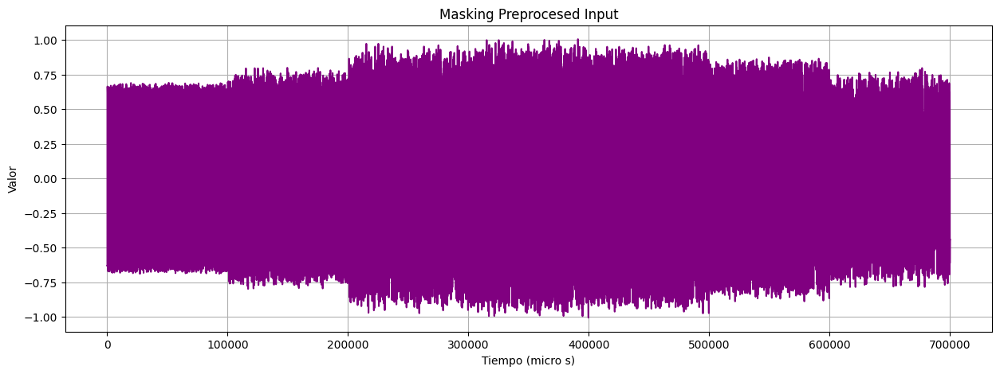

float64


In [104]:
print(masked_input_test[1].shape)
Delta_t=20e-9

    # Crear un array de tiempo basado en la escala de tiempo y la duración
tiempo = np.arange(len(masked_input_test[1])) * Delta_t * 1e9  # Convertir a nanosegundos


plt.figure(figsize=(15, 5))
plt.plot(tiempo, masked_input_test[1], linestyle='-', color='purple')
plt.title('Masking Preprocesed Input')
plt.xlabel('Tiempo (micro s)')
plt.ylabel('Valor')
        
plt.grid(True)
plt.show()

print(masked_input_test[0].dtype)

In [105]:

masked_input_train_32 = []

for input_data in masked_input_train:
    input_data = input_data.astype(np.float32)
    masked_input_train_32.append(input_data)

print(masked_input_train_32[1].dtype)



masked_input_test_32 = []

for input_data in masked_input_test:
    input_data = input_data.astype(np.float32)
    masked_input_test_32.append(input_data)

print(masked_input_test_32[1].dtype)

float32
float32


##### Scalin Input Current to +/- 3 mA

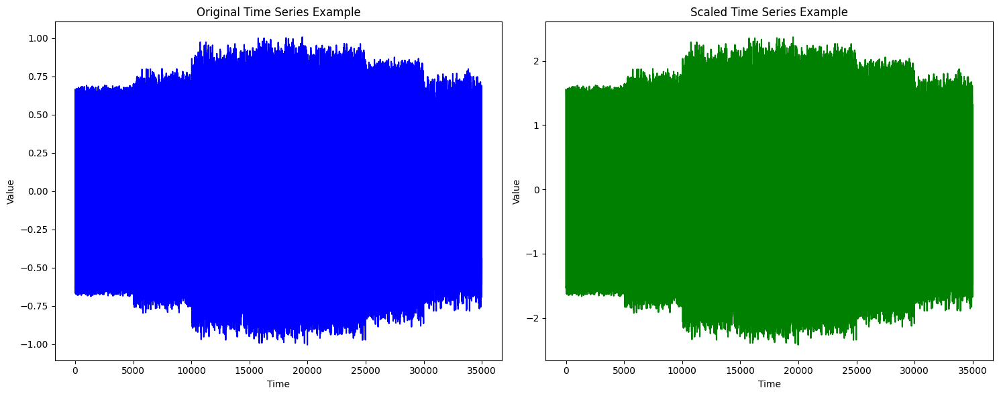

Dato procesado: 0, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.0000 segundos, 0.0000 minutos
Dato procesado: 1, Tiempo de procesamiento: 0.0010 segundos, Tiempo estimado restante: 0.5850 segundos, 0.0097 minutos
Dato procesado: 2, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.3896 segundos, 0.0065 minutos
Dato procesado: 3, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.2920 segundos, 0.0049 minutos
Dato procesado: 4, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.2334 segundos, 0.0039 minutos
Dato procesado: 5, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.1943 segundos, 0.0032 minutos
Dato procesado: 6, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.1664 segundos, 0.0028 minutos
Dato procesado: 7, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.1455 segundos, 0.0024 minutos
Dato procesado: 8, Tiempo de procesamiento: 0.00

In [106]:
import time
import numpy as np
import matplotlib.pyplot as plt

def scale_to_range(data, global_min , global_max , new_min=-3, new_max=3):
    """
    Escala los datos a un nuevo rango [new_min, new_max], con la opción de preservar los ceros.

    :param data: Array de datos a escalar.
    :param new_min: El nuevo valor mínimo del rango escalado.
    :param new_max: El nuevo valor máximo del rango escalado.
    :param preserve_zero: Si es True, los ceros en los datos originales se mantendrán como ceros.
    :return: Datos escalados.
    """
    old_min = global_min
    old_max = global_max
    old_range = old_max - old_min

    # Escalar a [0, 1]
    normalized_data = (data - old_min) / old_range

    # Escalar a [new_min, new_max]
    scaled_data = normalized_data * (new_max - new_min) + new_min



    return scaled_data


# Aplicar la función a una serie de tiempo de ejemplo

# Combinar los conjuntos de datos
combined_data = np.concatenate(masked_input_train_32 + masked_input_test_32)

# Calcular el mínimo y máximo globales
global_min = np.min(combined_data)
global_max = np.max(combined_data)

scaled_time_series = scale_to_range(masked_input_test_32[1],global_max=global_max, global_min=global_min)

# Graficar el antes y el después
plt.figure(figsize=(15, 6))

# Serie de tiempo original
plt.subplot(1, 2, 1)
plt.plot(masked_input_test_32[1], color='blue')
plt.title('Original Time Series Example')
plt.xlabel('Time')
plt.ylabel('Value')

# Serie de tiempo escalada
plt.subplot(1, 2, 2)
plt.plot(scaled_time_series, color='green')
plt.title('Scaled Time Series Example')
plt.xlabel('Time')
plt.ylabel('Value')
plt.tight_layout()
plt.show()



Input_data_train = []

total_processing_times = 0  # Para calcular el tiempo promedio
for index , input in enumerate(masked_input_train_32):

    start_time = time.time()  # Tiempo de inicio

    scaled_time_series = scale_to_range(input,global_min=global_min,global_max=global_max)
    Input_data_train.append(scaled_time_series)

    end_time = time.time()  # Tiempo de finalización
    processing_time = end_time - start_time  # Tiempo total de procesamiento
    total_processing_times += processing_time

    # Calcular el tiempo promedio de procesamiento hasta ahora
    average_processing_time = total_processing_times / (index + 1)

    # Estimar el tiempo restante
    remaining_items = len(masked_input_train_32) - (index + 1)
    estimated_time_remaining = average_processing_time * remaining_items

    # Imprimir la información de procesamiento
    # Asegúrate de que 'processing_time' y 'estimated_time_remaining' sean escalares
    print(f"Dato procesado: {index}, Tiempo de procesamiento: {processing_time:.4f} segundos, "
          f"Tiempo estimado restante: {estimated_time_remaining:.4f} segundos, "
          f"{estimated_time_remaining/60:.4f} minutos")
    

  

In [107]:
Input_data_test = []

total_processing_times = 0  # Para calcular el tiempo promedio
for index , input in enumerate(masked_input_test_32):

    start_time = time.time()  # Tiempo de inicio

    scaled_time_series = scale_to_range(input,global_min=global_min,global_max=global_max)
    Input_data_test.append(scaled_time_series)

    end_time = time.time()  # Tiempo de finalización
    processing_time = end_time - start_time  # Tiempo total de procesamiento
    total_processing_times += processing_time

    # Calcular el tiempo promedio de procesamiento hasta ahora
    average_processing_time = total_processing_times / (index + 1)

    # Estimar el tiempo restante
    remaining_items = len(masked_input_test_32) - (index + 1)
    estimated_time_remaining = average_processing_time * remaining_items

    # Imprimir la información de procesamiento
    # Asegúrate de que 'processing_time' y 'estimated_time_remaining' sean escalares
    print(f"Dato procesado: {index}, Tiempo de procesamiento: {processing_time:.4f} segundos, "
          f"Tiempo estimado restante: {estimated_time_remaining:.4f} segundos, "
          f"{estimated_time_remaining/60:.4f} minutos")  

Dato procesado: 0, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.0000 segundos, 0.0000 minutos
Dato procesado: 1, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.0000 segundos, 0.0000 minutos
Dato procesado: 2, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.0000 segundos, 0.0000 minutos
Dato procesado: 3, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.0000 segundos, 0.0000 minutos
Dato procesado: 4, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.0000 segundos, 0.0000 minutos
Dato procesado: 5, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.0000 segundos, 0.0000 minutos
Dato procesado: 6, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.0000 segundos, 0.0000 minutos
Dato procesado: 7, Tiempo de procesamiento: 0.0010 segundos, Tiempo estimado restante: 0.0367 segundos, 0.0006 minutos
Dato procesado: 8, Tiempo de procesamiento: 0.00

##### Reservoir Processing 

In [108]:
import time

reservoir_outputs_train = []
total_processing_times = 0  # Para calcular el tiempo promedio

for index, input_data in enumerate(Input_data_train):
    start_time = time.time()  # Tiempo de inicio

    # Procesar la entrada actual
    output = oscilator_plus_processing(input_data * 1e-3)

    # Añadir la salida procesada a la lista
    reservoir_outputs_train.append(output)

    end_time = time.time()  # Tiempo de finalización
    processing_time = end_time - start_time  # Tiempo total de procesamiento
    total_processing_times += processing_time

    # Calcular el tiempo promedio de procesamiento hasta ahora
    average_processing_time = total_processing_times / (index + 1)

    # Estimar el tiempo restante
    remaining_items = len(Input_data_train) - (index + 1)
    estimated_time_remaining = average_processing_time * remaining_items

    # Imprimir la información de procesamiento
    print(f"Dato procesado: {index}, Tiempo de procesamiento: {processing_time:.4f} segundos, Tiempo estimado restante: {estimated_time_remaining:.4f} segundos , {estimated_time_remaining/60:.4f} minutos")

# Asegurarse de que 'reservoir_outputs_1' tenga las salidas procesadas
print(f"Número total de salidas procesadas: {len(reservoir_outputs_train)}")

Dato procesado: 0, Tiempo de procesamiento: 0.1197 segundos, Tiempo estimado restante: 143.5548 segundos , 2.3926 minutos
Dato procesado: 1, Tiempo de procesamiento: 0.1832 segundos, Tiempo estimado restante: 181.4487 segundos , 3.0241 minutos
Dato procesado: 2, Tiempo de procesamiento: 0.1572 segundos, Tiempo estimado restante: 183.5716 segundos , 3.0595 minutos
Dato procesado: 3, Tiempo de procesamiento: 0.2052 segundos, Tiempo estimado restante: 198.9055 segundos , 3.3151 minutos
Dato procesado: 4, Tiempo de procesamiento: 0.2357 segundos, Tiempo estimado restante: 215.3185 segundos , 3.5886 minutos
Dato procesado: 5, Tiempo de procesamiento: 0.1387 segundos, Tiempo estimado restante: 206.8840 segundos , 3.4481 minutos
Dato procesado: 6, Tiempo de procesamiento: 0.1080 segundos, Tiempo estimado restante: 195.5792 segundos , 3.2597 minutos
Dato procesado: 7, Tiempo de procesamiento: 0.1102 segundos, Tiempo estimado restante: 187.4113 segundos , 3.1235 minutos
Dato procesado: 8, Tiemp

In [109]:
# Tomar solo cada 40 valores de cada serie de tiempo en reservoir_outputs
reservoir_outputs_train_sampled = [output[::5] for output in reservoir_outputs_train]

# Imprimir la forma de uno de los elementos muestreados
print("Forma de un elemento muestreado:", len(reservoir_outputs_train_sampled[3]))



Forma de un elemento muestreado: 6000


In [110]:
reservoir_outputs_train_transformed = [np.array(output).reshape(-1, 1000).T for output in reservoir_outputs_train_sampled]

# Verificar la forma de un elemento transformado
print("Forma de un elemento transformado en reservoir_outputs_train:", reservoir_outputs_train_transformed[3].shape)


Forma de un elemento transformado en reservoir_outputs_train: (1000, 6)


In [111]:
import time

reservoir_outputs_test = []
total_processing_times = 0  # Para calcular el tiempo promedio

for index, input_data in enumerate(Input_data_test):
    start_time = time.time()  # Tiempo de inicio

    # Procesar la entrada actual
    output = oscilator_plus_processing(input_data * 1e-3)

    # Añadir la salida procesada a la lista
    reservoir_outputs_test.append(output)

    end_time = time.time()  # Tiempo de finalización
    processing_time = end_time - start_time  # Tiempo total de procesamiento
    total_processing_times += processing_time

    # Calcular el tiempo promedio de procesamiento hasta ahora
    average_processing_time = total_processing_times / (index + 1)

    # Estimar el tiempo restante
    remaining_items = len(Input_data_test) - (index + 1)
    estimated_time_remaining = average_processing_time * remaining_items

    # Imprimir la información de procesamiento
    print(f"Dato procesado: {index}, Tiempo de procesamiento: {processing_time:.4f} segundos, Tiempo estimado restante: {estimated_time_remaining:.4f} segundos , {estimated_time_remaining/60:.4f} minutos")

# Asegurarse de que 'reservoir_outputs_1' tenga las salidas procesadas
print(f"Número total de salidas procesadas: {len(reservoir_outputs_test)}")

Dato procesado: 0, Tiempo de procesamiento: 0.2654 segundos, Tiempo estimado restante: 79.3520 segundos , 1.3225 minutos
Dato procesado: 1, Tiempo de procesamiento: 0.1526 segundos, Tiempo estimado restante: 62.2750 segundos , 1.0379 minutos
Dato procesado: 2, Tiempo de procesamiento: 0.1802 segundos, Tiempo estimado restante: 59.2122 segundos , 0.9869 minutos
Dato procesado: 3, Tiempo de procesamiento: 0.1769 segundos, Tiempo estimado restante: 57.3522 segundos , 0.9559 minutos
Dato procesado: 4, Tiempo de procesamiento: 0.1571 segundos, Tiempo estimado restante: 54.9945 segundos , 0.9166 minutos
Dato procesado: 5, Tiempo de procesamiento: 0.1125 segundos, Tiempo estimado restante: 51.1846 segundos , 0.8531 minutos
Dato procesado: 6, Tiempo de procesamiento: 0.2014 segundos, Tiempo estimado restante: 52.1542 segundos , 0.8692 minutos
Dato procesado: 7, Tiempo de procesamiento: 0.1326 segundos, Tiempo estimado restante: 50.3189 segundos , 0.8386 minutos
Dato procesado: 8, Tiempo de pro

In [112]:
# Tomar solo cada 40 valores de cada serie de tiempo en reservoir_outputs
reservoir_outputs_test_sampled = [output[::5] for output in reservoir_outputs_test]

# Imprimir la forma de uno de los elementos muestreados
print("Forma de un elemento muestreado:", len(reservoir_outputs_test_sampled[4]))

reservoir_outputs_test_transformed = [np.array(output).reshape(-1, 1000).T for output in reservoir_outputs_test_sampled]

# Verificar la forma de un elemento transformado
print("Forma de un elemento transformado en reservoir_outputs_test:", reservoir_outputs_test_transformed[4].shape)

Forma de un elemento muestreado: 7000
Forma de un elemento transformado en reservoir_outputs_test: (1000, 7)


##### Linear Readout

In [113]:
def linear_classifier_readout_variable_length(X_train, y_train, num_features,X_test, y_test):
    """
    Modified linear classifier to handle variable-length sequences.
    
    Args:
    X_train (list of np.array): Training data with variable-length sequences.
    y_train (np.array): Training labels.
    X_test (list of np.array): Test data with variable-length sequences.
    y_test (np.array): Test labels.
    num_labels (int): Number of label categories.
    
    Returns:
    None: Prints out the accuracy and other relevant information.
    """

    def create_S_matrix(mfcc_features, num_features=13):
        """
        Create a matrix S from variable-length MFCC feature sequences.

        Args:
        mfcc_features (list of np.array): List of MFCC feature arrays with variable length.
        num_features (int): Number of features in each MFCC array (default is 13).

        Returns:
        np.array: The resulting S matrix with dimensions [(num_samples * num_intervals), num_features].
        """
        # Flatten each MFCC feature array and concatenate
        transposed_features = [sequence.T for sequence in mfcc_features]
        S = np.vstack(transposed_features)


        return S

    S = create_S_matrix(X_train)


    def create_Y_hat_repeated(y_train, X_train, num_features):
        """
        Create the Y_hat_repeated matrix for variable-length sequences.

        Args:
        y_train (np.array): Training labels.
        X_train (list of np.array): Training data with variable-length sequences.
        num_features (int): Number of features in each MFCC array (default is 13).

        Returns:
        np.array: The resulting Y_hat_repeated matrix.
        """
        # Contar los intervalos en cada secuencia de X_train
        intervals_per_sample = [sequence.shape[1] for sequence in X_train]

        # Replicar cada etiqueta en y_train basado en el número de intervalos de su secuencia correspondiente
        Y_hat_repeated = np.repeat(y_train, intervals_per_sample, axis=0)

        return Y_hat_repeated

    Y_hat_repeated = create_Y_hat_repeated(y_train, X_train, num_features)

    # Calculamos la pseudoinversa 

    S_moore = np.linalg.pinv(S)

    Weights = Y_hat_repeated.T @ S_moore.T

    # Imprimir los resultados
    print('Shapes:')
    print("Forma de la matriz S:", S.shape)
    print("Y_hat_repeated shape:", Y_hat_repeated.shape)
    print("Pseudo inverse shape :",S_moore.shape)
    print('Weights matrix shape', Weights.shape)
    print('Weigths:',Weights)
 
# Aplicamos los pesos al conjunto de prueba
    
    def apply_weights_and_predict(data_set, Weights, num_features):
        """
        Apply the weight matrix to each sequence in the test set and predict classes.

        Args:
        data_set (list of np.array): Test data with variable-length sequences.
        Weights (np.array): The weight matrix from the trained model.
        num_features (int): Number of features in each MFCC array (default is 13).

        Returns:
        np.array: Predicted classes for each test sample.
        """
        # Initialize an empty list to store averaged results for each test sample
        averaged_results = []

        # Apply weights to each test sequence and compute the average result
        for sequence in data_set:

            # Apply weights to the sequence
            interval_results = sequence.T @ Weights.T
      
            # Average the results over all intervals for the test sample
            averaged_results.append(np.mean(interval_results, axis=0))

        # Convert the list of averages to a NumPy array
        averaged_results = np.array(averaged_results)

        # Predict the class for each test sample
        y_test_pred = np.argmax(averaged_results, axis=1)

        return y_test_pred , averaged_results
    
    
    y_test_pred , y_test_promedio = apply_weights_and_predict(X_test, Weights, num_features)

    y_train_pred , y_train_promedio = apply_weights_and_predict(X_train,Weights,num_features)

    # Convertimos las etiquetas verdaderas one-hot en índices de clase
    y_test_true_indices = np.argmax(y_test, axis=1)
    y_train_true_indices = np.argmax(y_train,axis=1)

    
    # Calculamos la precisión
    accuracy_test = accuracy_score(y_test_true_indices, y_test_pred)
    accuracy_train = accuracy_score(y_train_true_indices,y_train_pred)

    print('Shapes for Test Set :')
    print("Mean Results shape:", y_test_promedio.shape)
    print('Predicted Test Labels:')
    print(y_test_pred)
    print('true Test Labels:')
    print( y_test_true_indices)
    print(f'Accuracy en el conjunto de prueba: {accuracy_test*100:.2f} %')

    print('Shapes for train Set :')
    print("Mean Results shape:", y_train_promedio.shape)
    print('Predicted train Labels:')
    print(y_train_pred)
    print(f'Accuracy en el conjunto de entrenamiento: {accuracy_train*100:.2f} %')

    return y_test_pred , y_test_true_indices

In [114]:
num_samples_test = 300
num_samples_train = 1200
num_labels = 10
num_features = 1000

y_test_pred, y_test_true_indices = linear_classifier_readout_variable_length(
reservoir_outputs_train_transformed, y_train_no_padding, num_features=num_features , X_test=
reservoir_outputs_test_transformed, y_test=y_test_no_padding)

Shapes:
Forma de la matriz S: (9298, 1000)
Y_hat_repeated shape: (9298, 10)
Pseudo inverse shape : (1000, 9298)
Weights matrix shape (10, 1000)
Weigths: [[ 3.83068998e+04 -2.15747452e+05  1.78260250e+07 ...  1.25050212e+06
  -2.37719480e+06  6.16093378e+05]
 [-2.06935987e+05  1.80529964e+07 -9.44801002e+06 ...  2.75653633e+06
  -3.94381606e+06  8.17831444e+05]
 [ 2.28102836e+05 -1.88908100e+06  2.30644319e+07 ...  6.23217439e+06
  -9.84317515e+06  2.27077060e+06]
 ...
 [-6.18533536e+05 -1.16714869e+07 -2.62660657e+07 ... -4.37602947e+06
   7.06597332e+06 -1.53722680e+06]
 [-7.10016283e+05  2.67606962e+07 -4.55547256e+07 ...  4.47906656e+06
  -8.51941390e+06  2.02483112e+06]
 [ 7.16863745e+05 -1.49725866e+07  8.71885155e+05 ... -4.18173603e+06
   7.37077661e+06 -1.38307599e+06]]
Shapes for Test Set :
Mean Results shape: (300, 10)
Predicted Test Labels:
[6 2 5 9 4 1 2 4 6 0 0 5 6 1 2 3 8 3 3 8 2 6 3 1 3 7 5 3 4 9 3 9 8 0 6 2 0
 1 1 6 4 9 1 5 6 5 3 7 3 9 9 5 9 4 9 9 5 1 0 6 7 4 3 0 5 3 8 

##### Non Linear Readout : MLP

In [91]:
def create_S_matrix(mfcc_features, num_features=13):
        """
        Create a matrix S from variable-length MFCC feature sequences.

        Args:
        mfcc_features (list of np.array): List of MFCC feature arrays with variable length.
        num_features (int): Number of features in each MFCC array (default is 13).

        Returns:
        np.array: The resulting S matrix with dimensions [(num_samples * num_intervals), num_features].
        """
        # Flatten each MFCC feature array and concatenate
        transposed_features = [sequence.T for sequence in mfcc_features]
        S = np.vstack(transposed_features)


        return S


def create_Y_hat_repeated(y_train, X_train, num_features):
        """
        Create the Y_hat_repeated matrix for variable-length sequences.

        Args:
        y_train (np.array): Training labels.
        X_train (list of np.array): Training data with variable-length sequences.
        num_features (int): Number of features in each MFCC array (default is 13).

        Returns:
        np.array: The resulting Y_hat_repeated matrix.
        """
        # Contar los intervalos en cada secuencia de X_train
        intervals_per_sample = [sequence.shape[1] for sequence in X_train]

        # Replicar cada etiqueta en y_train basado en el número de intervalos de su secuencia correspondiente
        Y_hat_repeated = np.repeat(y_train, intervals_per_sample, axis=0)

        return Y_hat_repeated


In [124]:
X_train_no_padding_mlp_1000 = create_S_matrix(reservoir_outputs_train_transformed,13)
X_test_no_padding_mlp_1000 = create_S_matrix(reservoir_outputs_test_transformed,13)

y_train_no_padding_mlp_1000 = create_Y_hat_repeated(y_train_no_padding, reservoir_outputs_train_transformed, num_features=13)

y_test_no_padding_mlp_1000 = create_Y_hat_repeated(y_test_no_padding, reservoir_outputs_test_transformed, num_features=13)






print('Xtrain shape',reservoir_outputs_train_transformed[1].shape)
print('Xtest shape',reservoir_outputs_test_transformed[1].shape)

print('ytrain shape',y_train_no_padding_mlp_1000.shape)
print('ytest shape',y_test_no_padding_mlp_1000.shape)
print(y_train.shape)

Xtrain shape (1000, 8)
Xtest shape (1000, 7)
ytrain shape (9298, 10)
ytest shape (2254, 10)
(1200, 10)


In [116]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam

# Asegúrate de que los datos estén en el formato correcto
# X_train, y_train, X_test, y_test deben ser arrays de numpy o listas convertibles a arrays de numpy

# Definir la arquitectura del modelo
model_noPadding_res_1000 = Sequential([
    Dense(256, activation='relu', input_shape=(X_train_no_padding_mlp_1000.shape[1],)),
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),
    
    Dense(y_train.shape[1], activation='sigmoid')  # Usar 'sigmoid' para clasificación multilabel
])

# Compilar el modelo
model_noPadding_res_1000.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])

# Entrenar el modelo
history_noPadding = model_noPadding_res_1000.fit(X_train_no_padding_mlp_1000, y_train_no_padding_mlp_1000, epochs=1000, batch_size=32, validation_data=(X_test_no_padding_mlp_1000, y_test_no_padding_mlp_1000))


Epoch 1/1000
291/291 [==============================] - 2s 3ms/step - loss: 0.3448 - accuracy: 0.0970 - val_loss: 0.3250 - val_accuracy: 0.1069
Epoch 2/1000
291/291 [==============================] - 1s 3ms/step - loss: 0.3256 - accuracy: 0.1058 - val_loss: 0.3252 - val_accuracy: 0.1247
Epoch 3/1000
291/291 [==============================] - 1s 3ms/step - loss: 0.3256 - accuracy: 0.1077 - val_loss: 0.3249 - val_accuracy: 0.1247
Epoch 4/1000
291/291 [==============================] - 1s 3ms/step - loss: 0.3252 - accuracy: 0.1121 - val_loss: 0.3253 - val_accuracy: 0.1247
Epoch 5/1000
291/291 [==============================] - 1s 4ms/step - loss: 0.3253 - accuracy: 0.1084 - val_loss: 0.3250 - val_accuracy: 0.1069
Epoch 6/1000
291/291 [==============================] - 1s 3ms/step - loss: 0.3252 - accuracy: 0.1093 - val_loss: 0.3247 - val_accuracy: 0.1247
Epoch 7/1000
291/291 [==============================] - 1s 3ms/step - loss: 0.3252 - accuracy: 0.1114 - val_loss: 0.3247 - val_accuracy:

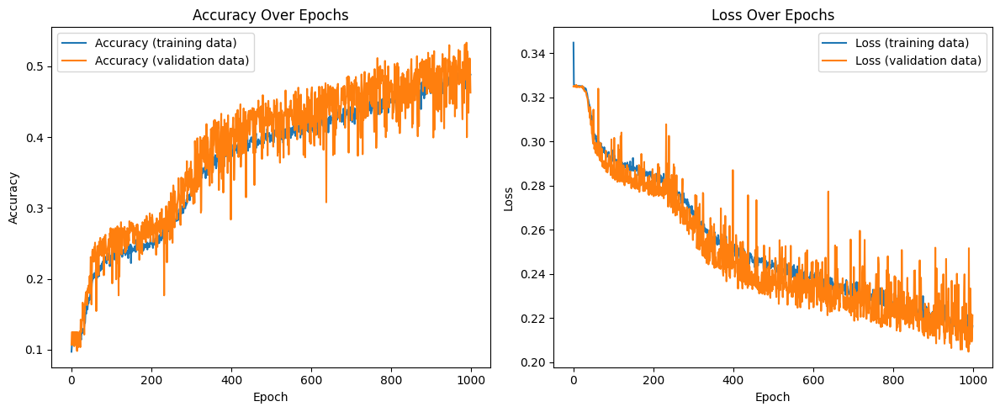

In [118]:
# Plotear las curvas de entrenamiento
plt.figure(figsize=(12, 5))

# Plotear la precisión del entrenamiento
plt.subplot(1, 2, 1)
plt.plot(history_noPadding.history['accuracy'], label='Accuracy (training data)')
plt.plot(history_noPadding.history['val_accuracy'], label='Accuracy (validation data)')
plt.title('Accuracy Over Epochs')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend()

# Plotear la pérdida del entrenamiento
plt.subplot(1, 2, 2)
plt.plot(history_noPadding.history['loss'], label='Loss (training data)')
plt.plot(history_noPadding.history['val_loss'], label='Loss (validation data)')
plt.title('Loss Over Epochs')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend()

plt.tight_layout()
plt.show()

In [119]:
import numpy as np

# Mejor precisión en el conjunto de entrenamiento
best_train_accuracy = max(history_noPadding.history['accuracy'])

# Mejor precisión en el conjunto de validación
best_val_accuracy = max(history_noPadding.history['val_accuracy'])

# Época en la que se obtuvo la mejor precisión en el conjunto de validación
best_epoch_val_accuracy = np.argmax(history_noPadding.history['val_accuracy']) + 1

print("Mejor precisión en entrenamiento:", best_train_accuracy)
print("Mejor precisión en validación:", best_val_accuracy)
print("Época de la mejor precisión en validación:", best_epoch_val_accuracy)

Mejor precisión en entrenamiento: 0.49451494216918945
Mejor precisión en validación: 0.5332741737365723
Época de la mejor precisión en validación: 990


In [125]:


test_results_res_1000 = []

for sequence in reservoir_outputs_test_transformed:
    print(sequence.T.shape)
    logits = model_noPadding_res_1000.predict(sequence.T)
    average_logits = np.mean(logits, axis=0)
    predicted_class = np.argmax(average_logits, axis=0)
    print(predicted_class)
    test_results_res_1000.append(predicted_class)

(12, 1000)
1/1 [==============================] - 0s 82ms/step
6
(7, 1000)
1/1 [==============================] - 0s 26ms/step
2
(8, 1000)
1/1 [==============================] - 0s 23ms/step
5
(8, 1000)
1/1 [==============================] - 0s 22ms/step
9
(7, 1000)
1/1 [==============================] - 0s 24ms/step
4
(5, 1000)
1/1 [==============================] - 0s 22ms/step
5
(9, 1000)
1/1 [==============================] - 0s 24ms/step
3
(6, 1000)
1/1 [==============================] - 0s 25ms/step
9
(8, 1000)
1/1 [==============================] - 0s 23ms/step
6
(9, 1000)
1/1 [==============================] - 0s 22ms/step
0
(7, 1000)
1/1 [==============================] - 0s 24ms/step
5
(6, 1000)
1/1 [==============================] - 0s 23ms/step
5
(13, 1000)
1/1 [==============================] - 0s 24ms/step
6
(9, 1000)
1/1 [==============================] - 0s 22ms/step
1
(9, 1000)
1/1 [==============================] - 0s 22ms/step
2
(5, 1000)
1/1 [=======================

In [127]:
test_targets = []
for sequence in y_test_no_padding:
    
    prediction = np.argmax(sequence, axis=0)
    
    test_targets.append(prediction)
    # Calculamos la precisión
accuracy_test = accuracy_score(test_targets, test_results_res_1000)

print(test_results[:50])
print(test_targets)
print(f'Accuracy en el conjunto de prueba: {accuracy_test*100:.2f} %')

[6, 2, 5, 9, 4, 1, 2, 1, 6, 0, 0, 5, 6, 1, 2, 3, 8, 3, 3, 8, 2, 6, 3, 1, 3, 7, 5, 3, 4, 9, 3, 9, 8, 0, 6, 2, 0, 1, 1, 6, 4, 9, 1, 5, 6, 5, 3, 7, 3, 9]
[6, 2, 5, 9, 4, 1, 2, 0, 5, 0, 0, 5, 6, 1, 2, 3, 8, 4, 3, 8, 2, 6, 3, 1, 3, 7, 5, 3, 4, 9, 2, 9, 8, 0, 6, 2, 0, 1, 1, 6, 4, 9, 1, 5, 6, 5, 3, 7, 2, 9, 9, 5, 9, 4, 9, 3, 5, 1, 0, 6, 7, 4, 3, 0, 5, 3, 8, 2, 2, 6, 5, 4, 7, 0, 9, 1, 5, 3, 0, 7, 1, 7, 7, 8, 7, 7, 8, 3, 7, 4, 5, 7, 8, 6, 8, 9, 8, 0, 9, 9, 4, 1, 2, 7, 5, 6, 9, 7, 1, 4, 6, 0, 9, 7, 8, 3, 0, 1, 9, 6, 0, 6, 2, 2, 9, 9, 8, 6, 7, 8, 7, 5, 8, 7, 8, 3, 1, 8, 9, 5, 1, 2, 6, 3, 2, 7, 5, 5, 3, 0, 4, 3, 7, 6, 9, 5, 2, 6, 9, 5, 9, 8, 6, 8, 4, 4, 5, 5, 7, 6, 4, 3, 3, 1, 0, 2, 4, 0, 4, 3, 1, 9, 0, 7, 1, 4, 0, 7, 4, 0, 3, 3, 2, 1, 4, 2, 5, 7, 1, 9, 5, 3, 2, 6, 5, 8, 4, 0, 2, 5, 9, 0, 8, 4, 2, 6, 0, 2, 3, 6, 9, 8, 0, 0, 0, 2, 5, 8, 9, 5, 1, 6, 7, 3, 8, 5, 8, 6, 2, 7, 8, 2, 4, 7, 7, 4, 4, 8, 2, 1, 2, 9, 3, 2, 5, 6, 3, 0, 1, 1, 1, 4, 3, 3, 9, 0, 8, 1, 9, 4, 4, 8, 6, 3, 6, 2, 8, 1, 8, 8, 7, 1, 1,

##### Dimentionality reduction vizualization

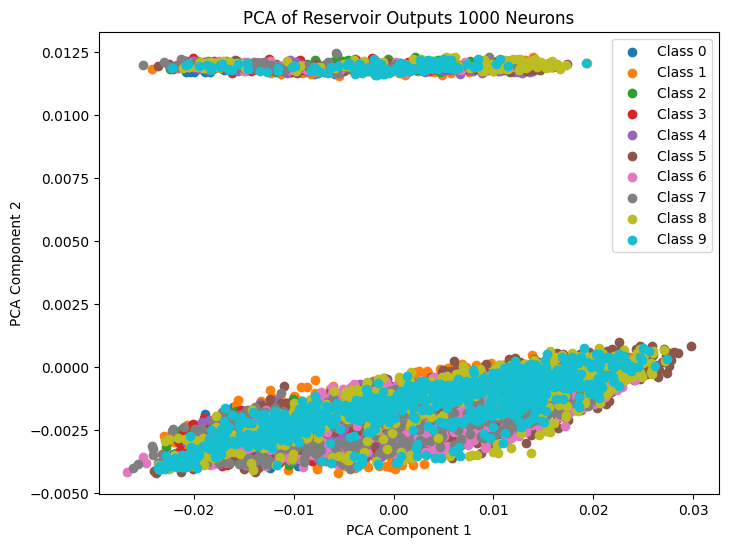

Explained variance ratio: [0.81910768 0.12337182]


In [133]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_train_no_padding_mlp_1000)

plt.figure(figsize=(8, 6))
for i in range(10):  # Assuming 10 classes
    plt.scatter(X_pca[y_train_no_padding_mlp_1000.argmax(axis=1) == i, 0], X_pca[y_train_no_padding_mlp_1000.argmax(axis=1) == i, 1], label=f'Class {i}')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.title('PCA of Reservoir Outputs 1000 Neurons')
plt.legend()
plt.show()
# Print the explained variance ratio for the first few components
print("Explained variance ratio:", pca.explained_variance_ratio_[:10])

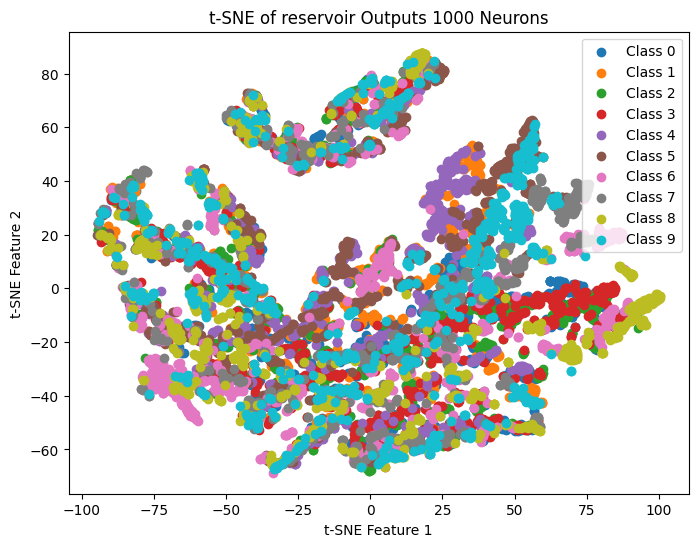

In [132]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(X_train_no_padding_mlp_1000)  # t-SNE on a subset for performance

plt.figure(figsize=(8, 6))
for i in range(10):  # Assuming 10 classes
    plt.scatter(X_tsne[y_train_no_padding_mlp_1000.argmax(axis=1) == i, 0], X_tsne[y_train_no_padding_mlp_1000.argmax(axis=1) == i, 1], label=f'Class {i}')
plt.xlabel('t-SNE Feature 1')
plt.ylabel('t-SNE Feature 2')
plt.title('t-SNE of reservoir Outputs 1000 Neurons')
plt.legend()
plt.show()

#### 2.2.3) Reservoir Layer Processing 2000 Neurons

##### masking

In [77]:
import time
import numpy as np

# Suponiendo que 'mfcc_padded' es una lista de arrays de MFCC
# y 'masking' es una función previamente definida

num_canales = 13
num_neuronas = 2000
random_matrix = np.random.choice([-1, 1], size=(num_canales, num_neuronas))

masked_input_train = []

total_processing_times = 0  # Para calcular el tiempo promedio



# Necesitas inicializar la variable 'index'
for index, data in enumerate(X_train_no_padding):
    start_time = time.time()  # Tiempo de inicio
    
    array_n0_ntau = data.T
    masked_values = masking(num_canales, num_neuronas, array_n0_ntau, random_matrix=random_matrix,duracion_ns=100,Delta_t=20e-9, plot=False)
    masked_input_train.append(masked_values)
    
    end_time = time.time()  # Tiempo de finalización
    processing_time = end_time - start_time  # Tiempo total de procesamiento
    total_processing_times += processing_time

    # Calcular el tiempo promedio de procesamiento hasta ahora
    average_processing_time = total_processing_times / (index + 1)

    # Estimar el tiempo restante
    remaining_items = len(mfcc_padded) - (index + 1)
    estimated_time_remaining = average_processing_time * remaining_items

    # Imprimir la información de procesamiento
    # Asegúrate de que 'processing_time' y 'estimated_time_remaining' sean escalares
    print(f"Dato procesado: {index}, Tiempo de procesamiento: {processing_time:.4f} segundos, "
          f"Tiempo estimado restante: {estimated_time_remaining:.4f} segundos, "
          f"{estimated_time_remaining/60:.4f} minutos")

Dato procesado: 0, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.0000 segundos, 0.0000 minutos
Dato procesado: 1, Tiempo de procesamiento: 0.0020 segundos, Tiempo estimado restante: 1.4916 segundos, 0.0249 minutos
Dato procesado: 2, Tiempo de procesamiento: 0.0020 segundos, Tiempo estimado restante: 1.9934 segundos, 0.0332 minutos
Dato procesado: 3, Tiempo de procesamiento: 0.0016 segundos, Tiempo estimado restante: 2.0806 segundos, 0.0347 minutos
Dato procesado: 4, Tiempo de procesamiento: 0.0020 segundos, Tiempo estimado restante: 2.2487 segundos, 0.0375 minutos
Dato procesado: 5, Tiempo de procesamiento: 0.0010 segundos, Tiempo estimado restante: 2.1213 segundos, 0.0354 minutos
Dato procesado: 6, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 1.8170 segundos, 0.0303 minutos
Dato procesado: 7, Tiempo de procesamiento: 0.0010 segundos, Tiempo estimado restante: 1.7754 segundos, 0.0296 minutos
Dato procesado: 8, Tiempo de procesamiento: 0.00

In [78]:
total_processing_times = 0  # Para calcular el tiempo promedio


masked_input_test = []

# Necesitas inicializar la variable 'index'
for index, data in enumerate(X_test_no_padding):
    start_time = time.time()  # Tiempo de inicio
    
    array_n0_ntau = data.T
    masked_values = masking(num_canales, num_neuronas, array_n0_ntau,random_matrix=random_matrix, duracion_ns=100,Delta_t=20e-9, plot=False)
    masked_input_test.append(masked_values)
    
    end_time = time.time()  # Tiempo de finalización
    processing_time = end_time - start_time  # Tiempo total de procesamiento
    total_processing_times += processing_time

    # Calcular el tiempo promedio de procesamiento hasta ahora
    average_processing_time = total_processing_times / (index + 1)

    # Estimar el tiempo restante
    remaining_items = len(X_test_no_padding) - (index + 1)
    estimated_time_remaining = average_processing_time * remaining_items

    # Imprimir la información de procesamiento
    # Asegúrate de que 'processing_time' y 'estimated_time_remaining' sean escalares
    print(f"Dato procesado: {index}, Tiempo de procesamiento: {processing_time:.4f} segundos, "
          f"Tiempo estimado restante: {estimated_time_remaining:.4f} segundos, "
          f"{estimated_time_remaining/60:.4f} minutos")

Dato procesado: 0, Tiempo de procesamiento: 0.0020 segundos, Tiempo estimado restante: 0.5994 segundos, 0.0100 minutos
Dato procesado: 1, Tiempo de procesamiento: 0.0010 segundos, Tiempo estimado restante: 0.4477 segundos, 0.0075 minutos
Dato procesado: 2, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.2975 segundos, 0.0050 minutos
Dato procesado: 3, Tiempo de procesamiento: 0.0010 segundos, Tiempo estimado restante: 0.2964 segundos, 0.0049 minutos
Dato procesado: 4, Tiempo de procesamiento: 0.0010 segundos, Tiempo estimado restante: 0.2954 segundos, 0.0049 minutos
Dato procesado: 5, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.2453 segundos, 0.0041 minutos
Dato procesado: 6, Tiempo de procesamiento: 0.0010 segundos, Tiempo estimado restante: 0.2514 segundos, 0.0042 minutos
Dato procesado: 7, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.2192 segundos, 0.0037 minutos
Dato procesado: 8, Tiempo de procesamiento: 0.00

In [79]:

masked_input_train_32 = []

for input_data in masked_input_train:
    input_data = input_data.astype(np.float32)
    masked_input_train_32.append(input_data)

print(masked_input_train_32[1].dtype)



masked_input_test_32 = []

for input_data in masked_input_test:
    input_data = input_data.astype(np.float32)
    masked_input_test_32.append(input_data)

print(masked_input_test_32[1].dtype)

float32
float32


##### Scalin Input Current to +/- 3 mA

In [80]:
Input_data_train = []

total_processing_times = 0  # Para calcular el tiempo promedio
for index , input in enumerate(masked_input_train_32):

    start_time = time.time()  # Tiempo de inicio

    scaled_time_series = scale_to_range(input,global_min=global_min,global_max=global_max)
    Input_data_train.append(scaled_time_series)

    end_time = time.time()  # Tiempo de finalización
    processing_time = end_time - start_time  # Tiempo total de procesamiento
    total_processing_times += processing_time

    # Calcular el tiempo promedio de procesamiento hasta ahora
    average_processing_time = total_processing_times / (index + 1)

    # Estimar el tiempo restante
    remaining_items = len(masked_input_train_32) - (index + 1)
    estimated_time_remaining = average_processing_time * remaining_items

    # Imprimir la información de procesamiento
    # Asegúrate de que 'processing_time' y 'estimated_time_remaining' sean escalares
    print(f"Dato procesado: {index}, Tiempo de procesamiento: {processing_time:.4f} segundos, "
          f"Tiempo estimado restante: {estimated_time_remaining:.4f} segundos, "
          f"{estimated_time_remaining/60:.4f} minutos")

Dato procesado: 0, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.0000 segundos, 0.0000 minutos
Dato procesado: 1, Tiempo de procesamiento: 0.0010 segundos, Tiempo estimado restante: 0.5980 segundos, 0.0100 minutos
Dato procesado: 2, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.3983 segundos, 0.0066 minutos
Dato procesado: 3, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.2985 segundos, 0.0050 minutos
Dato procesado: 4, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.2386 segundos, 0.0040 minutos
Dato procesado: 5, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.1987 segundos, 0.0033 minutos
Dato procesado: 6, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.1701 segundos, 0.0028 minutos
Dato procesado: 7, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.1487 segundos, 0.0025 minutos
Dato procesado: 8, Tiempo de procesamiento: 0.00

In [81]:
Input_data_test = []

total_processing_times = 0  # Para calcular el tiempo promedio
for index , input in enumerate(masked_input_test_32):

    start_time = time.time()  # Tiempo de inicio

    scaled_time_series = scale_to_range(input,global_min=global_min,global_max=global_max)
    Input_data_test.append(scaled_time_series)

    end_time = time.time()  # Tiempo de finalización
    processing_time = end_time - start_time  # Tiempo total de procesamiento
    total_processing_times += processing_time

    # Calcular el tiempo promedio de procesamiento hasta ahora
    average_processing_time = total_processing_times / (index + 1)

    # Estimar el tiempo restante
    remaining_items = len(masked_input_test_32) - (index + 1)
    estimated_time_remaining = average_processing_time * remaining_items

    # Imprimir la información de procesamiento
    # Asegúrate de que 'processing_time' y 'estimated_time_remaining' sean escalares
    print(f"Dato procesado: {index}, Tiempo de procesamiento: {processing_time:.4f} segundos, "
          f"Tiempo estimado restante: {estimated_time_remaining:.4f} segundos, "
          f"{estimated_time_remaining/60:.4f} minutos")  

Dato procesado: 0, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.0000 segundos, 0.0000 minutos
Dato procesado: 1, Tiempo de procesamiento: 0.0010 segundos, Tiempo estimado restante: 0.1510 segundos, 0.0025 minutos
Dato procesado: 2, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.1003 segundos, 0.0017 minutos
Dato procesado: 3, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.0750 segundos, 0.0013 minutos
Dato procesado: 4, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.0598 segundos, 0.0010 minutos
Dato procesado: 5, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.0497 segundos, 0.0008 minutos
Dato procesado: 6, Tiempo de procesamiento: 0.0010 segundos, Tiempo estimado restante: 0.0837 segundos, 0.0014 minutos
Dato procesado: 7, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.0730 segundos, 0.0012 minutos
Dato procesado: 8, Tiempo de procesamiento: 0.00

##### Reservoir Processing 

In [82]:
import time

reservoir_outputs_train = []
total_processing_times = 0  # Para calcular el tiempo promedio

for index, input_data in enumerate(Input_data_train):
    start_time = time.time()  # Tiempo de inicio

    # Procesar la entrada actual
    output = oscilator_plus_processing(input_data * 1e-3)

    # Añadir la salida procesada a la lista
    reservoir_outputs_train.append(output)

    end_time = time.time()  # Tiempo de finalización
    processing_time = end_time - start_time  # Tiempo total de procesamiento
    total_processing_times += processing_time

    # Calcular el tiempo promedio de procesamiento hasta ahora
    average_processing_time = total_processing_times / (index + 1)

    # Estimar el tiempo restante
    remaining_items = len(Input_data_train) - (index + 1)
    estimated_time_remaining = average_processing_time * remaining_items

    # Imprimir la información de procesamiento
    print(f"Dato procesado: {index}, Tiempo de procesamiento: {processing_time:.4f} segundos, Tiempo estimado restante: {estimated_time_remaining:.4f} segundos , {estimated_time_remaining/60:.4f} minutos")

# Asegurarse de que 'reservoir_outputs_1' tenga las salidas procesadas
print(f"Número total de salidas procesadas: {len(reservoir_outputs_train)}")

Dato procesado: 0, Tiempo de procesamiento: 0.2206 segundos, Tiempo estimado restante: 264.4858 segundos , 4.4081 minutos
Dato procesado: 1, Tiempo de procesamiento: 0.3606 segundos, Tiempo estimado restante: 348.1574 segundos , 5.8026 minutos
Dato procesado: 2, Tiempo de procesamiento: 0.2690 segundos, Tiempo estimado restante: 339.2461 segundos , 5.6541 minutos
Dato procesado: 3, Tiempo de procesamiento: 0.2667 segundos, Tiempo estimado restante: 333.9706 segundos , 5.5662 minutos
Dato procesado: 4, Tiempo de procesamiento: 0.3999 segundos, Tiempo estimado restante: 362.5340 segundos , 6.0422 minutos
Dato procesado: 5, Tiempo de procesamiento: 0.2686 segundos, Tiempo estimado restante: 355.3043 segundos , 5.9217 minutos
Dato procesado: 6, Tiempo de procesamiento: 0.2232 segundos, Tiempo estimado restante: 342.3347 segundos , 5.7056 minutos
Dato procesado: 7, Tiempo de procesamiento: 0.2182 segundos, Tiempo estimado restante: 331.8013 segundos , 5.5300 minutos
Dato procesado: 8, Tiemp

In [83]:
# Tomar solo cada 40 valores de cada serie de tiempo en reservoir_outputs
reservoir_outputs_train_sampled = [output[::5] for output in reservoir_outputs_train]

# Imprimir la forma de uno de los elementos muestreados
print("Forma de un elemento muestreado:", len(reservoir_outputs_train_sampled[3]))

Forma de un elemento muestreado: 12000


In [88]:
reservoir_outputs_train_transformed_2000 = [np.array(output).reshape(-1, 2000).T for output in reservoir_outputs_train_sampled]

# Verificar la forma de un elemento transformado
print("Forma de un elemento transformado en reservoir_outputs_train:", reservoir_outputs_train_transformed[3].shape)

Forma de un elemento transformado en reservoir_outputs_train: (2000, 6)


In [85]:
import time

reservoir_outputs_test = []
total_processing_times = 0  # Para calcular el tiempo promedio

for index, input_data in enumerate(Input_data_test):
    start_time = time.time()  # Tiempo de inicio

    # Procesar la entrada actual
    output = oscilator_plus_processing(input_data * 1e-3)

    # Añadir la salida procesada a la lista
    reservoir_outputs_test.append(output)

    end_time = time.time()  # Tiempo de finalización
    processing_time = end_time - start_time  # Tiempo total de procesamiento
    total_processing_times += processing_time

    # Calcular el tiempo promedio de procesamiento hasta ahora
    average_processing_time = total_processing_times / (index + 1)

    # Estimar el tiempo restante
    remaining_items = len(Input_data_test) - (index + 1)
    estimated_time_remaining = average_processing_time * remaining_items

    # Imprimir la información de procesamiento
    print(f"Dato procesado: {index}, Tiempo de procesamiento: {processing_time:.4f} segundos, Tiempo estimado restante: {estimated_time_remaining:.4f} segundos , {estimated_time_remaining/60:.4f} minutos")

# Asegurarse de que 'reservoir_outputs_1' tenga las salidas procesadas
print(f"Número total de salidas procesadas: {len(reservoir_outputs_test)}")

Dato procesado: 0, Tiempo de procesamiento: 0.5639 segundos, Tiempo estimado restante: 168.5972 segundos , 2.8100 minutos
Dato procesado: 1, Tiempo de procesamiento: 0.3105 segundos, Tiempo estimado restante: 130.2852 segundos , 2.1714 minutos
Dato procesado: 2, Tiempo de procesamiento: 0.3576 segundos, Tiempo estimado restante: 121.9687 segundos , 2.0328 minutos
Dato procesado: 3, Tiempo de procesamiento: 0.3529 segundos, Tiempo estimado restante: 117.2820 segundos , 1.9547 minutos
Dato procesado: 4, Tiempo de procesamiento: 0.3087 segundos, Tiempo estimado restante: 111.7212 segundos , 1.8620 minutos
Dato procesado: 5, Tiempo de procesamiento: 0.2197 segundos, Tiempo estimado restante: 103.5504 segundos , 1.7258 minutos
Dato procesado: 6, Tiempo de procesamiento: 0.4048 segundos, Tiempo estimado restante: 105.3991 segundos , 1.7567 minutos
Dato procesado: 7, Tiempo de procesamiento: 0.2709 segundos, Tiempo estimado restante: 101.7955 segundos , 1.6966 minutos
Dato procesado: 8, Tiemp

In [89]:
# Tomar solo cada 40 valores de cada serie de tiempo en reservoir_outputs
reservoir_outputs_test_sampled = [output[::5] for output in reservoir_outputs_test]

# Imprimir la forma de uno de los elementos muestreados
print("Forma de un elemento muestreado:", len(reservoir_outputs_test_sampled[4]))

reservoir_outputs_test_transformed_2000 = [np.array(output).reshape(-1, 2000).T for output in reservoir_outputs_test_sampled]

# Verificar la forma de un elemento transformado
print("Forma de un elemento transformado en reservoir_outputs_test:", reservoir_outputs_test_transformed[4].shape)

Forma de un elemento muestreado: 14000
Forma de un elemento transformado en reservoir_outputs_test: (2000, 7)


##### Linear Readout

In [90]:
num_samples_test = 300
num_samples_train = 1200
num_labels = 10
num_features = 2000

y_test_pred , y_test_true_indices = linear_classifier_readout_variable_length(
reservoir_outputs_train_transformed_2000, y_train_no_padding, num_features=num_features , X_test=
reservoir_outputs_test_transformed_2000, y_test=y_test_no_padding)

Shapes:
Forma de la matriz S: (9298, 2000)
Y_hat_repeated shape: (9298, 10)
Pseudo inverse shape : (2000, 9298)
Weights matrix shape (10, 2000)
Weigths: [[ -1070077.13418512   1267209.84674209   3829362.84878484 ...
   32660925.72329843  -5712864.28026503   1142865.3561141 ]
 [   187064.31059866 -30078434.60978181  43799640.32222647 ...
   52043826.24359707 -16910360.90447091   3143952.06529844]
 [ -1930532.17035834 -15513736.73354962  30498199.73680909 ...
   86085178.44471665 -24024362.44715858   6171759.95306573]
 ...
 [  1082411.61274138 -12630679.18866698  16303908.32997606 ...
   13765805.8621587   -5577394.23633259   1590154.19653171]
 [  2503866.63126336 -35241920.92373942  51508920.41972508 ...
   29552619.46246389  -5302617.24595989    622613.1420007 ]
 [  3118400.70740548  10749448.78111449 -22995607.37647225 ...
   26796969.58398566  -7268692.05812031   2255423.09617577]]
Shapes for Test Set :
Mean Results shape: (300, 10)
Predicted Test Labels:
[6 2 5 9 4 1 2 4 6 0 6 5 6 1

##### Non lineal Readout Mlp

In [134]:
X_train_no_padding_mlp_2000 = create_S_matrix(reservoir_outputs_train_transformed_2000,13)
X_test_no_padding_mlp_2000 = create_S_matrix(reservoir_outputs_test_transformed_2000,13)

y_train_no_padding_mlp_2000 = create_Y_hat_repeated(y_train_no_padding, reservoir_outputs_train_transformed_2000, num_features=13)

y_test_no_padding_mlp_2000 = create_Y_hat_repeated(y_test_no_padding, reservoir_outputs_test_transformed_2000, num_features=13)






print('Xtrain shape',reservoir_outputs_train_transformed_2000[1].shape)
print('Xtest shape',reservoir_outputs_test_transformed_2000[1].shape)

print('ytrain shape',y_train_no_padding_mlp_2000.shape)
print('ytest shape',y_test_no_padding_mlp_2000.shape)
print(y_train.shape)

Xtrain shape (2000, 8)
Xtest shape (2000, 7)
ytrain shape (9298, 10)
ytest shape (2254, 10)
(1200, 10)


In [135]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam

# Asegúrate de que los datos estén en el formato correcto
# X_train, y_train, X_test, y_test deben ser arrays de numpy o listas convertibles a arrays de numpy

# Definir la arquitectura del modelo
model_noPadding_res_2000 = Sequential([
    Dense(256, activation='relu', input_shape=(X_train_no_padding_mlp_2000.shape[1],)),
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),
    
    Dense(y_train.shape[1], activation='sigmoid')  # Usar 'sigmoid' para clasificación multilabel
])

# Compilar el modelo
model_noPadding_res_2000.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])

# Entrenar el modelo
history_noPadding_res_2000 = model_noPadding_res_2000.fit(X_train_no_padding_mlp_2000, y_train_no_padding_mlp_2000, epochs=500, batch_size=32, validation_data=(X_test_no_padding_mlp_2000, y_test_no_padding_mlp_2000))

Epoch 1/500
291/291 [==============================] - 2s 6ms/step - loss: 0.3412 - accuracy: 0.1037 - val_loss: 0.3256 - val_accuracy: 0.0958
Epoch 2/500
291/291 [==============================] - 1s 5ms/step - loss: 0.3259 - accuracy: 0.1040 - val_loss: 0.3252 - val_accuracy: 0.0980
Epoch 3/500
291/291 [==============================] - 2s 5ms/step - loss: 0.3256 - accuracy: 0.1009 - val_loss: 0.3256 - val_accuracy: 0.1047
Epoch 4/500
291/291 [==============================] - 2s 5ms/step - loss: 0.3256 - accuracy: 0.1107 - val_loss: 0.3253 - val_accuracy: 0.0980
Epoch 5/500
291/291 [==============================] - 2s 5ms/step - loss: 0.3254 - accuracy: 0.1060 - val_loss: 0.3252 - val_accuracy: 0.0980
Epoch 6/500
291/291 [==============================] - 1s 5ms/step - loss: 0.3254 - accuracy: 0.1072 - val_loss: 0.3257 - val_accuracy: 0.1247
Epoch 7/500
291/291 [==============================] - 1s 5ms/step - loss: 0.3254 - accuracy: 0.1108 - val_loss: 0.3246 - val_accuracy: 0.1247

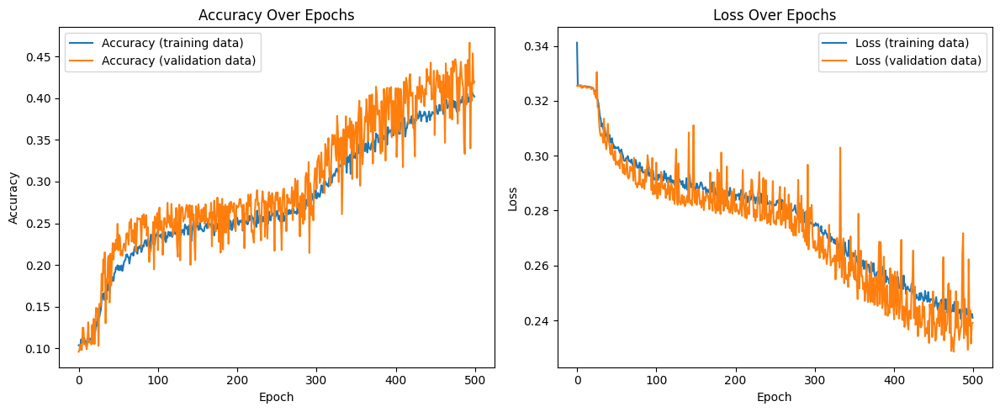

In [136]:
# Plotear las curvas de entrenamiento
plt.figure(figsize=(12, 5))

# Plotear la precisión del entrenamiento
plt.subplot(1, 2, 1)
plt.plot(history_noPadding_res_2000.history['accuracy'], label='Accuracy (training data)')
plt.plot(history_noPadding_res_2000.history['val_accuracy'], label='Accuracy (validation data)')
plt.title('Accuracy Over Epochs')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend()

# Plotear la pérdida del entrenamiento
plt.subplot(1, 2, 2)
plt.plot(history_noPadding_res_2000.history['loss'], label='Loss (training data)')
plt.plot(history_noPadding_res_2000.history['val_loss'], label='Loss (validation data)')
plt.title('Loss Over Epochs')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend()

plt.tight_layout()
plt.show()

In [139]:
import numpy as np

# Mejor precisión en el conjunto de entrenamiento
best_train_accuracy_res_2000 = max(history_noPadding_res_2000.history['accuracy'])

# Mejor precisión en el conjunto de validación
best_val_accuracy_res_2000 = max(history_noPadding_res_2000.history['val_accuracy'])

# Época en la que se obtuvo la mejor precisión en el conjunto de validación
best_epoch_val_accuracy_res_2000 = np.argmax(history_noPadding_res_2000.history['val_accuracy']) + 1

print("Mejor precisión en entrenamiento:", best_train_accuracy_res_2000)
print("Mejor precisión en validación:", best_val_accuracy_res_2000)
print("Época de la mejor precisión en validación:", best_epoch_val_accuracy_res_2000)

Mejor precisión en entrenamiento: 0.4078296422958374
Mejor precisión en validación: 0.46672582626342773
Época de la mejor precisión en validación: 494


In [140]:


test_results_res_2000 = []

for sequence in reservoir_outputs_test_transformed_2000:
    print(sequence.T.shape)
    logits = model_noPadding_res_2000.predict(sequence.T)
    average_logits = np.mean(logits, axis=0)
    predicted_class = np.argmax(average_logits, axis=0)
    print(predicted_class)
    test_results_res_2000.append(predicted_class)

(12, 2000)
1/1 [==============================] - 0s 68ms/step
6
(7, 2000)
1/1 [==============================] - 0s 25ms/step
2
(8, 2000)
1/1 [==============================] - 0s 24ms/step
5
(8, 2000)
1/1 [==============================] - 0s 22ms/step
9
(7, 2000)
1/1 [==============================] - 0s 24ms/step
4
(5, 2000)
1/1 [==============================] - 0s 23ms/step
4
(9, 2000)
1/1 [==============================] - 0s 24ms/step
2
(6, 2000)
1/1 [==============================] - 0s 24ms/step
4
(8, 2000)
1/1 [==============================] - 0s 22ms/step
5
(9, 2000)
1/1 [==============================] - 0s 22ms/step
0
(7, 2000)
1/1 [==============================] - 0s 23ms/step
6
(6, 2000)
1/1 [==============================] - 0s 23ms/step
5
(13, 2000)
1/1 [==============================] - 0s 21ms/step
6
(9, 2000)
1/1 [==============================] - 0s 22ms/step
9
(9, 2000)
1/1 [==============================] - 0s 21ms/step
2
(5, 2000)
1/1 [=======================

In [141]:
test_targets = []
for sequence in y_test_no_padding:
    
    prediction = np.argmax(sequence, axis=0)
    
    test_targets.append(prediction)
    # Calculamos la precisión
accuracy_test = accuracy_score(test_targets, test_results_res_2000)

print(test_results_res_2000[:50])
print(test_targets)
print(f'Accuracy en el conjunto de prueba: {accuracy_test*100:.2f} %')

[6, 2, 5, 9, 4, 4, 2, 4, 5, 0, 6, 5, 6, 9, 2, 3, 8, 0, 3, 8, 2, 6, 3, 9, 7, 6, 4, 3, 4, 9, 3, 9, 8, 7, 6, 2, 3, 9, 4, 5, 7, 9, 5, 5, 6, 5, 3, 7, 3, 9]
[6, 2, 5, 9, 4, 1, 2, 0, 5, 0, 0, 5, 6, 1, 2, 3, 8, 4, 3, 8, 2, 6, 3, 1, 3, 7, 5, 3, 4, 9, 2, 9, 8, 0, 6, 2, 0, 1, 1, 6, 4, 9, 1, 5, 6, 5, 3, 7, 2, 9, 9, 5, 9, 4, 9, 3, 5, 1, 0, 6, 7, 4, 3, 0, 5, 3, 8, 2, 2, 6, 5, 4, 7, 0, 9, 1, 5, 3, 0, 7, 1, 7, 7, 8, 7, 7, 8, 3, 7, 4, 5, 7, 8, 6, 8, 9, 8, 0, 9, 9, 4, 1, 2, 7, 5, 6, 9, 7, 1, 4, 6, 0, 9, 7, 8, 3, 0, 1, 9, 6, 0, 6, 2, 2, 9, 9, 8, 6, 7, 8, 7, 5, 8, 7, 8, 3, 1, 8, 9, 5, 1, 2, 6, 3, 2, 7, 5, 5, 3, 0, 4, 3, 7, 6, 9, 5, 2, 6, 9, 5, 9, 8, 6, 8, 4, 4, 5, 5, 7, 6, 4, 3, 3, 1, 0, 2, 4, 0, 4, 3, 1, 9, 0, 7, 1, 4, 0, 7, 4, 0, 3, 3, 2, 1, 4, 2, 5, 7, 1, 9, 5, 3, 2, 6, 5, 8, 4, 0, 2, 5, 9, 0, 8, 4, 2, 6, 0, 2, 3, 6, 9, 8, 0, 0, 0, 2, 5, 8, 9, 5, 1, 6, 7, 3, 8, 5, 8, 6, 2, 7, 8, 2, 4, 7, 7, 4, 4, 8, 2, 1, 2, 9, 3, 2, 5, 6, 3, 0, 1, 1, 1, 4, 3, 3, 9, 0, 8, 1, 9, 4, 4, 8, 6, 3, 6, 2, 8, 1, 8, 8, 7, 1, 1,

#### 2.2.4) Reservoir Layer Processing 100 Neurons 

##### masking

In [154]:
import time
import numpy as np

# Suponiendo que 'mfcc_padded' es una lista de arrays de MFCC
# y 'masking' es una función previamente definida

num_canales = 13
num_neuronas = 100
random_matrix_100 = np.random.choice([-1, 1], size=(num_canales, num_neuronas))

masked_100_input_train = []

total_processing_times = 0  # Para calcular el tiempo promedio



# Necesitas inicializar la variable 'index'
for index, data in enumerate(X_train_no_padding):
    start_time = time.time()  # Tiempo de inicio
    
    array_n0_ntau = data.T
    masked_values = masking(num_canales, num_neuronas, array_n0_ntau, random_matrix=random_matrix_100,duracion_ns=100,Delta_t=20e-9, plot=False)
    masked_100_input_train.append(masked_values)
    
    end_time = time.time()  # Tiempo de finalización
    processing_time = end_time - start_time  # Tiempo total de procesamiento
    total_processing_times += processing_time

    # Calcular el tiempo promedio de procesamiento hasta ahora
    average_processing_time = total_processing_times / (index + 1)

    # Estimar el tiempo restante
    remaining_items = len(mfcc_padded) - (index + 1)
    estimated_time_remaining = average_processing_time * remaining_items

    # Imprimir la información de procesamiento
    # Asegúrate de que 'processing_time' y 'estimated_time_remaining' sean escalares
    print(f"Dato procesado: {index}, Tiempo de procesamiento: {processing_time:.4f} segundos, "
          f"Tiempo estimado restante: {estimated_time_remaining:.4f} segundos, "
          f"{estimated_time_remaining/60:.4f} minutos")

Dato procesado: 0, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.0000 segundos, 0.0000 minutos
Dato procesado: 1, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.0000 segundos, 0.0000 minutos
Dato procesado: 2, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.0000 segundos, 0.0000 minutos
Dato procesado: 3, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.0000 segundos, 0.0000 minutos
Dato procesado: 4, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.0000 segundos, 0.0000 minutos
Dato procesado: 5, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.0000 segundos, 0.0000 minutos
Dato procesado: 6, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.0000 segundos, 0.0000 minutos
Dato procesado: 7, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.0000 segundos, 0.0000 minutos
Dato procesado: 8, Tiempo de procesamiento: 0.00

In [171]:
total_processing_times = 0  # Para calcular el tiempo promedio
num_neuronas = 100

masked_100_input_test = []

# Necesitas inicializar la variable 'index'
for index, data in enumerate(X_test_no_padding):
    start_time = time.time()  # Tiempo de inicio
    
    array_n0_ntau = data.T
    masked_values = masking(num_canales, num_neuronas, array_n0_ntau,random_matrix=random_matrix_100, duracion_ns=100,Delta_t=20e-9, plot=False)
    masked_100_input_test.append(masked_values)
    
    end_time = time.time()  # Tiempo de finalización
    processing_time = end_time - start_time  # Tiempo total de procesamiento
    total_processing_times += processing_time

    # Calcular el tiempo promedio de procesamiento hasta ahora
    average_processing_time = total_processing_times / (index + 1)

    # Estimar el tiempo restante
    remaining_items = len(X_test_no_padding) - (index + 1)
    estimated_time_remaining = average_processing_time * remaining_items

    # Imprimir la información de procesamiento
    # Asegúrate de que 'processing_time' y 'estimated_time_remaining' sean escalares
    print(f"Dato procesado: {index}, Tiempo de procesamiento: {processing_time:.4f} segundos, "
          f"Tiempo estimado restante: {estimated_time_remaining:.4f} segundos, "
          f"{estimated_time_remaining/60:.4f} minutos")

Dato procesado: 0, Tiempo de procesamiento: 0.0010 segundos, Tiempo estimado restante: 0.2987 segundos, 0.0050 minutos
Dato procesado: 1, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.1488 segundos, 0.0025 minutos
Dato procesado: 2, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.0989 segundos, 0.0016 minutos
Dato procesado: 3, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.0739 segundos, 0.0012 minutos
Dato procesado: 4, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.0589 segundos, 0.0010 minutos
Dato procesado: 5, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.0489 segundos, 0.0008 minutos
Dato procesado: 6, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.0418 segundos, 0.0007 minutos
Dato procesado: 7, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.0365 segundos, 0.0006 minutos
Dato procesado: 8, Tiempo de procesamiento: 0.00

In [172]:

masked_100_input_train_32 = []

for input_data in masked_100_input_train:
    input_data = input_data.astype(np.float32)
    masked_100_input_train_32.append(input_data)

print(masked_100_input_train_32[1].dtype)



masked_100_input_test_32 = []

for input_data in masked_100_input_test:
    input_data = input_data.astype(np.float32)
    masked_100_input_test_32.append(input_data)

print(masked_100_input_test_32[1].dtype)

float32
float32


##### Scalin Input Current to +/- 3 mA

In [173]:
Input_data_train_100 = []

total_processing_times = 0  # Para calcular el tiempo promedio
for index , input in enumerate(masked_100_input_train_32):

    start_time = time.time()  # Tiempo de inicio

    scaled_time_series = scale_to_range(input,global_min=global_min,global_max=global_max)
    Input_data_train_100.append(scaled_time_series)

    end_time = time.time()  # Tiempo de finalización
    processing_time = end_time - start_time  # Tiempo total de procesamiento
    total_processing_times += processing_time

    # Calcular el tiempo promedio de procesamiento hasta ahora
    average_processing_time = total_processing_times / (index + 1)

    # Estimar el tiempo restante
    remaining_items = len(masked_100_input_train_32) - (index + 1)
    estimated_time_remaining = average_processing_time * remaining_items

    # Imprimir la información de procesamiento
    # Asegúrate de que 'processing_time' y 'estimated_time_remaining' sean escalares
    print(f"Dato procesado: {index}, Tiempo de procesamiento: {processing_time:.4f} segundos, "
          f"Tiempo estimado restante: {estimated_time_remaining:.4f} segundos, "
          f"{estimated_time_remaining/60:.4f} minutos")

Dato procesado: 0, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.0000 segundos, 0.0000 minutos
Dato procesado: 1, Tiempo de procesamiento: 0.0010 segundos, Tiempo estimado restante: 0.5990 segundos, 0.0100 minutos
Dato procesado: 2, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.3990 segundos, 0.0066 minutos
Dato procesado: 3, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.2990 segundos, 0.0050 minutos
Dato procesado: 4, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.2390 segundos, 0.0040 minutos
Dato procesado: 5, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.1990 segundos, 0.0033 minutos
Dato procesado: 6, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.1704 segundos, 0.0028 minutos
Dato procesado: 7, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.1490 segundos, 0.0025 minutos
Dato procesado: 8, Tiempo de procesamiento: 0.00

In [174]:
Input_data_test_100 = []

total_processing_times = 0  # Para calcular el tiempo promedio
for index , input in enumerate(masked_100_input_test_32):

    start_time = time.time()  # Tiempo de inicio

    scaled_time_series = scale_to_range(input,global_min=global_min,global_max=global_max)
    Input_data_test_100.append(scaled_time_series)

    end_time = time.time()  # Tiempo de finalización
    processing_time = end_time - start_time  # Tiempo total de procesamiento
    total_processing_times += processing_time

    # Calcular el tiempo promedio de procesamiento hasta ahora
    average_processing_time = total_processing_times / (index + 1)

    # Estimar el tiempo restante
    remaining_items = len(masked_100_input_test_32) - (index + 1)
    estimated_time_remaining = average_processing_time * remaining_items

    # Imprimir la información de procesamiento
    # Asegúrate de que 'processing_time' y 'estimated_time_remaining' sean escalares
    print(f"Dato procesado: {index}, Tiempo de procesamiento: {processing_time:.4f} segundos, "
          f"Tiempo estimado restante: {estimated_time_remaining:.4f} segundos, "
          f"{estimated_time_remaining/60:.4f} minutos")  

Dato procesado: 0, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.0000 segundos, 0.0000 minutos
Dato procesado: 1, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.0000 segundos, 0.0000 minutos
Dato procesado: 2, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.0000 segundos, 0.0000 minutos
Dato procesado: 3, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.0000 segundos, 0.0000 minutos
Dato procesado: 4, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.0000 segundos, 0.0000 minutos
Dato procesado: 5, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.0000 segundos, 0.0000 minutos
Dato procesado: 6, Tiempo de procesamiento: 0.0010 segundos, Tiempo estimado restante: 0.0418 segundos, 0.0007 minutos
Dato procesado: 7, Tiempo de procesamiento: 0.0000 segundos, Tiempo estimado restante: 0.0365 segundos, 0.0006 minutos
Dato procesado: 8, Tiempo de procesamiento: 0.00

In [175]:
print(len(masked_100_input_test[4]))

3500


##### Reservoir Processing 

In [148]:
import time

reservoir_outputs_train_100 = []
total_processing_times = 0  # Para calcular el tiempo promedio

for index, input_data in enumerate(Input_data_train_100):
    start_time = time.time()  # Tiempo de inicio

    # Procesar la entrada actual
    output = oscilator_plus_processing(input_data * 1e-3)

    # Añadir la salida procesada a la lista
    reservoir_outputs_train_100.append(output)

    end_time = time.time()  # Tiempo de finalización
    processing_time = end_time - start_time  # Tiempo total de procesamiento
    total_processing_times += processing_time

    # Calcular el tiempo promedio de procesamiento hasta ahora
    average_processing_time = total_processing_times / (index + 1)

    # Estimar el tiempo restante
    remaining_items = len(Input_data_train_100) - (index + 1)
    estimated_time_remaining = average_processing_time * remaining_items

    # Imprimir la información de procesamiento
    print(f"Dato procesado: {index}, Tiempo de procesamiento: {processing_time:.4f} segundos, Tiempo estimado restante: {estimated_time_remaining:.4f} segundos , {estimated_time_remaining/60:.4f} minutos")

# Asegurarse de que 'reservoir_outputs_1' tenga las salidas procesadas
print(f"Número total de salidas procesadas: {len(reservoir_outputs_train_100)}")

Dato procesado: 0, Tiempo de procesamiento: 0.0126 segundos, Tiempo estimado restante: 15.0710 segundos , 0.2512 minutos
Dato procesado: 1, Tiempo de procesamiento: 0.0241 segundos, Tiempo estimado restante: 21.9697 segundos , 0.3662 minutos
Dato procesado: 2, Tiempo de procesamiento: 0.0150 segundos, Tiempo estimado restante: 20.6193 segundos , 0.3437 minutos
Dato procesado: 3, Tiempo de procesamiento: 0.0165 segundos, Tiempo estimado restante: 20.3934 segundos , 0.3399 minutos
Dato procesado: 4, Tiempo de procesamiento: 0.0305 segundos, Tiempo estimado restante: 23.5930 segundos , 0.3932 minutos
Dato procesado: 5, Tiempo de procesamiento: 0.0210 segundos, Tiempo estimado restante: 23.8276 segundos , 0.3971 minutos
Dato procesado: 6, Tiempo de procesamiento: 0.0125 segundos, Tiempo estimado restante: 22.5387 segundos , 0.3756 minutos
Dato procesado: 7, Tiempo de procesamiento: 0.0135 segundos, Tiempo estimado restante: 21.7176 segundos , 0.3620 minutos
Dato procesado: 8, Tiempo de pro

In [150]:
# Tomar solo cada  v5alores de cada serie de tiempo en reservoir_outputs
reservoir_outputs_train_sampled_100 = [output[::5] for output in reservoir_outputs_train_100]

# Imprimir la forma de uno de los elementos muestreados
print("Forma de un elemento muestreado:", len(reservoir_outputs_train_sampled_100[3]))

Forma de un elemento muestreado: 600


In [151]:
reservoir_outputs_train_transformed_100 = [np.array(output).reshape(-1, 100).T for output in reservoir_outputs_train_sampled_100]

# Verificar la forma de un elemento transformado
print("Forma de un elemento transformado en reservoir_outputs_train:", reservoir_outputs_train_transformed_100[3].shape)

Forma de un elemento transformado en reservoir_outputs_train: (100, 6)


In [176]:
import time

reservoir_outputs_test_100 = []
total_processing_times = 0  # Para calcular el tiempo promedio

for index, input_data in enumerate(Input_data_test_100):
    start_time = time.time()  # Tiempo de inicio

    # Procesar la entrada actual
    output = oscilator_plus_processing(input_data * 1e-3)

    # Añadir la salida procesada a la lista
    reservoir_outputs_test_100.append(output)

    end_time = time.time()  # Tiempo de finalización
    processing_time = end_time - start_time  # Tiempo total de procesamiento
    total_processing_times += processing_time

    # Calcular el tiempo promedio de procesamiento hasta ahora
    average_processing_time = total_processing_times / (index + 1)

    # Estimar el tiempo restante
    remaining_items = len(Input_data_test_100) - (index + 1)
    estimated_time_remaining = average_processing_time * remaining_items

    # Imprimir la información de procesamiento
    print(f"Dato procesado: {index}, Tiempo de procesamiento: {processing_time:.4f} segundos, Tiempo estimado restante: {estimated_time_remaining:.4f} segundos , {estimated_time_remaining/60:.4f} minutos")

# Asegurarse de que 'reservoir_outputs_1' tenga las salidas procesadas
print(f"Número total de salidas procesadas: {len(reservoir_outputs_test_100)}")

Dato procesado: 0, Tiempo de procesamiento: 0.0301 segundos, Tiempo estimado restante: 8.9942 segundos , 0.1499 minutos
Dato procesado: 1, Tiempo de procesamiento: 0.0177 segundos, Tiempo estimado restante: 7.1225 segundos , 0.1187 minutos
Dato procesado: 2, Tiempo de procesamiento: 0.0200 segundos, Tiempo estimado restante: 6.7146 segundos , 0.1119 minutos
Dato procesado: 3, Tiempo de procesamiento: 0.0205 segundos, Tiempo estimado restante: 6.5374 segundos , 0.1090 minutos
Dato procesado: 4, Tiempo de procesamiento: 0.0150 segundos, Tiempo estimado restante: 6.0973 segundos , 0.1016 minutos
Dato procesado: 5, Tiempo de procesamiento: 0.0115 segundos, Tiempo estimado restante: 5.6295 segundos , 0.0938 minutos
Dato procesado: 6, Tiempo de procesamiento: 0.0191 segundos, Tiempo estimado restante: 5.6075 segundos , 0.0935 minutos
Dato procesado: 7, Tiempo de procesamiento: 0.0132 segundos, Tiempo estimado restante: 5.3700 segundos , 0.0895 minutos
Dato procesado: 8, Tiempo de procesamien

In [177]:
# Tomar solo cada 40 valores de cada serie de tiempo en reservoir_outputs
reservoir_outputs_test_sampled_100 = [output[::5] for output in reservoir_outputs_test_100]

# Imprimir la forma de uno de los elementos muestreados
print("Forma de un elemento muestreado:", len(reservoir_outputs_test_sampled_100[4]))

reservoir_outputs_test_transformed_100 = [np.array(output).reshape(-1, 100).T for output in reservoir_outputs_test_sampled_100]

# Verificar la forma de un elemento transformado
print("Forma de un elemento transformado en reservoir_outputs_test:", reservoir_outputs_test_transformed_100[4].shape)

Forma de un elemento muestreado: 700
Forma de un elemento transformado en reservoir_outputs_test: (100, 7)


##### Linear Readout

In [179]:
num_samples_test = 300
num_samples_train = 1200
num_labels = 10
num_features = 100

y_test_pred_100 , y_test_true_indices_100 = linear_classifier_readout_variable_length(
reservoir_outputs_train_transformed_100, y_train_no_padding, num_features=num_features , X_test=
reservoir_outputs_test_transformed_100, y_test=y_test_no_padding)

Shapes:
Forma de la matriz S: (9298, 100)
Y_hat_repeated shape: (9298, 10)
Pseudo inverse shape : (100, 9298)
Weights matrix shape (10, 100)
Weigths: [[-3.61929396e+04  6.30603722e+04 -3.78982173e+04  3.04626487e+04
   7.17413672e+04 -1.42449980e+05  2.90480962e+05 -3.94688193e+05
  -5.54463450e+04  2.16781729e+05 -1.80514607e+04  4.98515629e+04
  -7.78722842e+04  3.76331129e+04  7.22396325e+04 -1.49175525e+05
   9.16409925e+04 -2.26321232e+04 -7.55253003e+04  3.54932231e+04
  -1.44091991e+04 -3.52872172e+03 -3.18786182e+03 -7.52816995e+03
   8.22647788e+03 -1.25985268e+04  2.81519122e+05 -4.98033791e+05
   1.67980280e+05 -6.69331534e+04  1.52743562e+05 -2.10746176e+04
  -1.21978677e+05  1.86689283e+05 -5.78564595e+04  2.95856075e+04
  -3.49229534e+04  3.86897451e+04 -4.05274153e+04 -3.80931011e+04
   5.29753260e+04  7.95264682e+03 -1.58355571e+04  6.01288787e+03
   1.91479537e+04 -3.32817977e+04  8.27829983e+04 -2.69164302e+05
   2.79427047e+05 -1.03776872e+05  5.45004952e+03 -9.12986

##### Non lineal Readout Mlp

In [180]:
X_train_no_padding_mlp_100 = create_S_matrix(reservoir_outputs_train_transformed_100,13)
X_test_no_padding_mlp_100 = create_S_matrix(reservoir_outputs_test_transformed_100,13)

y_train_no_padding_mlp_100 = create_Y_hat_repeated(y_train_no_padding, reservoir_outputs_train_transformed_100, num_features=13)

y_test_no_padding_mlp_100 = create_Y_hat_repeated(y_test_no_padding, reservoir_outputs_test_transformed_100, num_features=13)






print('Xtrain shape',reservoir_outputs_train_transformed_100[1].shape)
print('Xtest shape',reservoir_outputs_test_transformed_100[1].shape)

print('ytrain shape',y_train_no_padding_mlp_100.shape)
print('ytest shape',y_test_no_padding_mlp_100.shape)
print(y_train.shape)

Xtrain shape (100, 8)
Xtest shape (100, 7)
ytrain shape (9298, 10)
ytest shape (2254, 10)
(1200, 10)


In [181]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam

# Asegúrate de que los datos estén en el formato correcto
# X_train, y_train, X_test, y_test deben ser arrays de numpy o listas convertibles a arrays de numpy

# Definir la arquitectura del modelo
model_noPadding_res_100 = Sequential([
    Dense(256, activation='relu', input_shape=(X_train_no_padding_mlp_100.shape[1],)),
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),
    
    Dense(y_train.shape[1], activation='sigmoid')  # Usar 'sigmoid' para clasificación multilabel
])

# Compilar el modelo
model_noPadding_res_100.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])

# Entrenar el modelo
history_noPadding_res_100 = model_noPadding_res_100.fit(X_train_no_padding_mlp_100, y_train_no_padding_mlp_100, epochs=500, batch_size=32, validation_data=(X_test_no_padding_mlp_100, y_test_no_padding_mlp_100))

Epoch 1/500


291/291 [==============================] - 2s 3ms/step - loss: 0.3590 - accuracy: 0.1074 - val_loss: 0.3251 - val_accuracy: 0.0958
Epoch 2/500
291/291 [==============================] - 1s 2ms/step - loss: 0.3253 - accuracy: 0.1043 - val_loss: 0.3249 - val_accuracy: 0.1247
Epoch 3/500
291/291 [==============================] - 1s 2ms/step - loss: 0.3255 - accuracy: 0.1044 - val_loss: 0.3248 - val_accuracy: 0.1247
Epoch 4/500
291/291 [==============================] - 1s 2ms/step - loss: 0.3253 - accuracy: 0.1115 - val_loss: 0.3248 - val_accuracy: 0.1247
Epoch 5/500
291/291 [==============================] - 1s 2ms/step - loss: 0.3254 - accuracy: 0.1084 - val_loss: 0.3248 - val_accuracy: 0.1247
Epoch 6/500
291/291 [==============================] - 1s 2ms/step - loss: 0.3254 - accuracy: 0.1074 - val_loss: 0.3252 - val_accuracy: 0.1247
Epoch 7/500
291/291 [==============================] - 1s 2ms/step - loss: 0.3253 - accuracy: 0.1088 - val_loss: 0.3256 - val_accuracy: 0.1047
Epoch 8/500

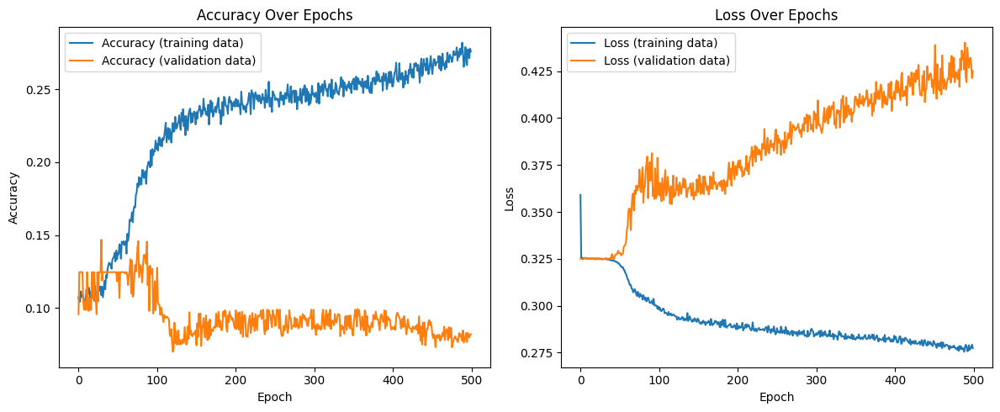

In [182]:
# Plotear las curvas de entrenamiento
plt.figure(figsize=(12, 5))

# Plotear la precisión del entrenamiento
plt.subplot(1, 2, 1)
plt.plot(history_noPadding_res_100.history['accuracy'], label='Accuracy (training data)')
plt.plot(history_noPadding_res_100.history['val_accuracy'], label='Accuracy (validation data)')
plt.title('Accuracy Over Epochs')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend()

# Plotear la pérdida del entrenamiento
plt.subplot(1, 2, 2)
plt.plot(history_noPadding_res_100.history['loss'], label='Loss (training data)')
plt.plot(history_noPadding_res_100.history['val_loss'], label='Loss (validation data)')
plt.title('Loss Over Epochs')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend()

plt.tight_layout()
plt.show()

In [183]:
import numpy as np

# Mejor precisión en el conjunto de entrenamiento
best_train_accuracy_res_100 = max(history_noPadding_res_100.history['accuracy'])

# Mejor precisión en el conjunto de validación
best_val_accuracy_res_100 = max(history_noPadding_res_100.history['val_accuracy'])

# Época en la que se obtuvo la mejor precisión en el conjunto de validación
best_epoch_val_accuracy_res_100 = np.argmax(history_noPadding_res_100.history['val_accuracy']) + 1

print("Mejor precisión en entrenamiento:", best_train_accuracy_res_100)
print("Mejor precisión en validación:", best_val_accuracy_res_100)
print("Época de la mejor precisión en validación:", best_epoch_val_accuracy_res_100)

Mejor precisión en entrenamiento: 0.28199613094329834
Mejor precisión en validación: 0.14685004949569702
Época de la mejor precisión en validación: 30


In [184]:


test_results_res_100 = []

for sequence in reservoir_outputs_test_transformed_100:
    print(sequence.T.shape)
    logits = model_noPadding_res_100.predict(sequence.T)
    average_logits = np.mean(logits, axis=0)
    predicted_class = np.argmax(average_logits, axis=0)
    print(predicted_class)
    test_results_res_100.append(predicted_class)

(12, 100)
1/1 [==============================] - 0s 59ms/step


9
(7, 100)
1/1 [==============================] - 0s 26ms/step
9
(8, 100)
1/1 [==============================] - 0s 26ms/step
0
(8, 100)
1/1 [==============================] - 0s 21ms/step
0
(7, 100)
1/1 [==============================] - 0s 21ms/step
0
(5, 100)
1/1 [==============================] - 0s 24ms/step
0
(9, 100)
1/1 [==============================] - 0s 24ms/step
9
(6, 100)
1/1 [==============================] - 0s 24ms/step
9
(8, 100)
1/1 [==============================] - 0s 22ms/step
9
(9, 100)
1/1 [==============================] - 0s 24ms/step
9
(7, 100)
1/1 [==============================] - 0s 24ms/step
9
(6, 100)
1/1 [==============================] - 0s 23ms/step
0
(13, 100)
1/1 [==============================] - 0s 22ms/step
9
(9, 100)
1/1 [==============================] - 0s 23ms/step
9
(9, 100)
1/1 [==============================] - 0s 25ms/step
9
(5, 100)
1/1 [==============================] - 0s 24ms/step
9
(7, 100)
1/1 [==============================] - 0s 2

In [186]:
test_targets = []
for sequence in y_test_no_padding:
    
    prediction = np.argmax(sequence, axis=0)
    
    test_targets.append(prediction)
    # Calculamos la precisión
accuracy_test = accuracy_score(test_targets, test_results_res_100)

print(test_results_res_100[:50])
print(test_targets)
print(f'Accuracy en el conjunto de prueba: {accuracy_test*100:.2f} %')

[9, 9, 0, 0, 0, 0, 9, 9, 9, 9, 9, 0, 9, 9, 9, 9, 0, 9, 9, 9, 9, 9, 9, 0, 9, 9, 0, 9, 9, 0, 9, 0, 9, 9, 9, 9, 9, 0, 9, 9, 9, 9, 9, 0, 9, 9, 9, 0, 9, 0]
[6, 2, 5, 9, 4, 1, 2, 0, 5, 0, 0, 5, 6, 1, 2, 3, 8, 4, 3, 8, 2, 6, 3, 1, 3, 7, 5, 3, 4, 9, 2, 9, 8, 0, 6, 2, 0, 1, 1, 6, 4, 9, 1, 5, 6, 5, 3, 7, 2, 9, 9, 5, 9, 4, 9, 3, 5, 1, 0, 6, 7, 4, 3, 0, 5, 3, 8, 2, 2, 6, 5, 4, 7, 0, 9, 1, 5, 3, 0, 7, 1, 7, 7, 8, 7, 7, 8, 3, 7, 4, 5, 7, 8, 6, 8, 9, 8, 0, 9, 9, 4, 1, 2, 7, 5, 6, 9, 7, 1, 4, 6, 0, 9, 7, 8, 3, 0, 1, 9, 6, 0, 6, 2, 2, 9, 9, 8, 6, 7, 8, 7, 5, 8, 7, 8, 3, 1, 8, 9, 5, 1, 2, 6, 3, 2, 7, 5, 5, 3, 0, 4, 3, 7, 6, 9, 5, 2, 6, 9, 5, 9, 8, 6, 8, 4, 4, 5, 5, 7, 6, 4, 3, 3, 1, 0, 2, 4, 0, 4, 3, 1, 9, 0, 7, 1, 4, 0, 7, 4, 0, 3, 3, 2, 1, 4, 2, 5, 7, 1, 9, 5, 3, 2, 6, 5, 8, 4, 0, 2, 5, 9, 0, 8, 4, 2, 6, 0, 2, 3, 6, 9, 8, 0, 0, 0, 2, 5, 8, 9, 5, 1, 6, 7, 3, 8, 5, 8, 6, 2, 7, 8, 2, 4, 7, 7, 4, 4, 8, 2, 1, 2, 9, 3, 2, 5, 6, 3, 0, 1, 1, 1, 4, 3, 3, 9, 0, 8, 1, 9, 4, 4, 8, 6, 3, 6, 2, 8, 1, 8, 8, 7, 1, 1,